<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Mon Feb 26 14:55:11 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   51C    P0              86W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 9s, sys: 1.74 ms, total: 9min 9s
Wall time: 9min 10s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

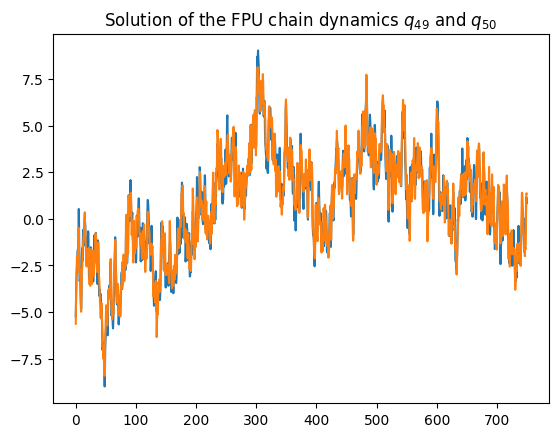

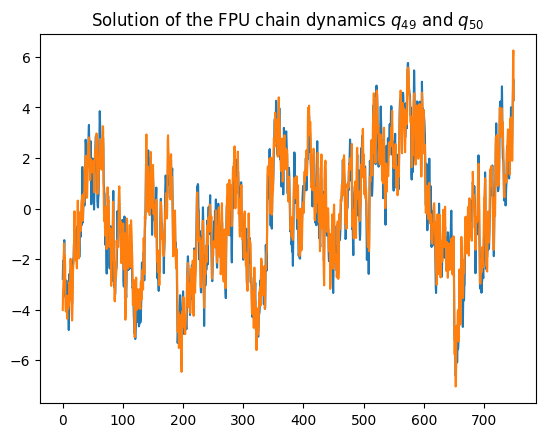

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


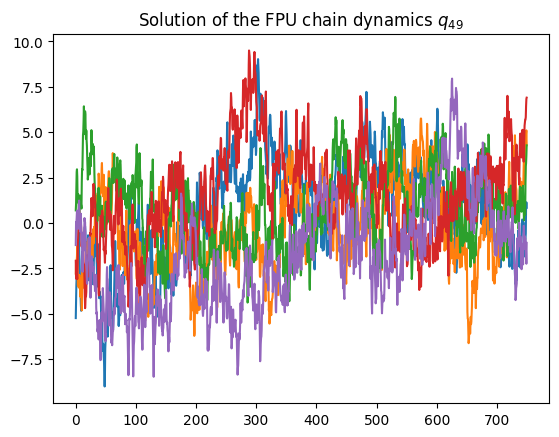

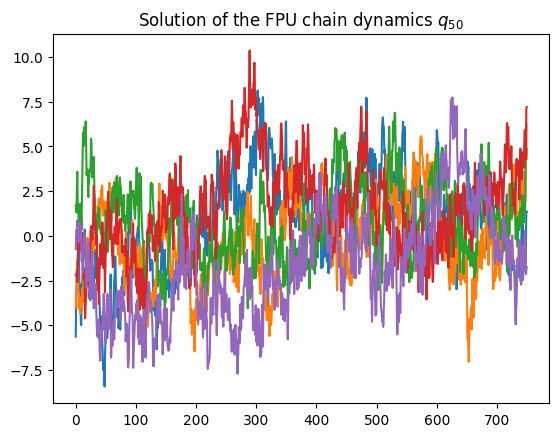

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 1)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 1), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 1]) torch.float32
The torch validation size is torch.Size([800, 400, 1]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


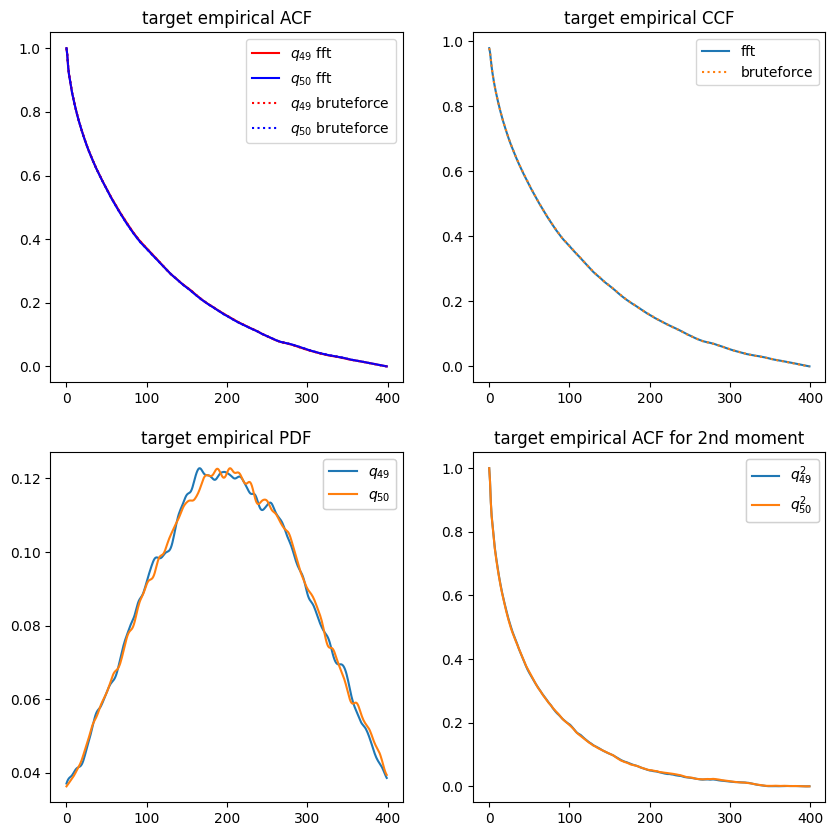

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

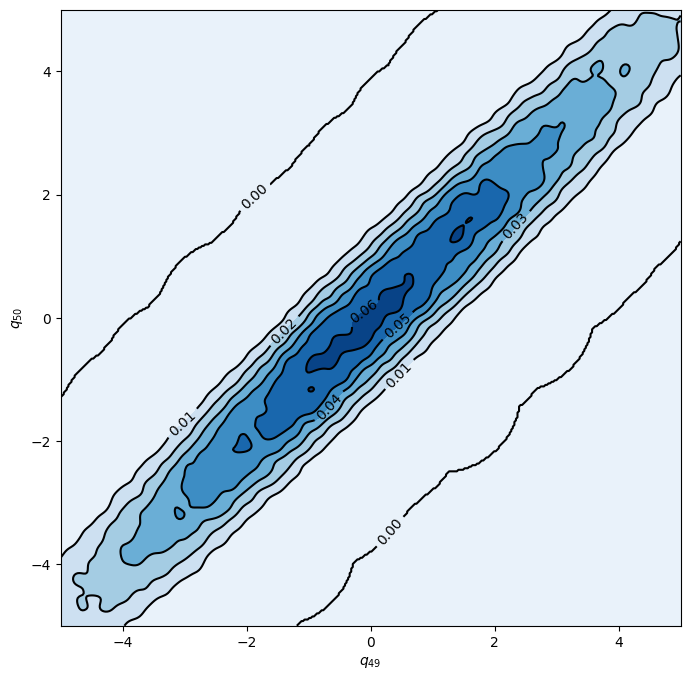

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

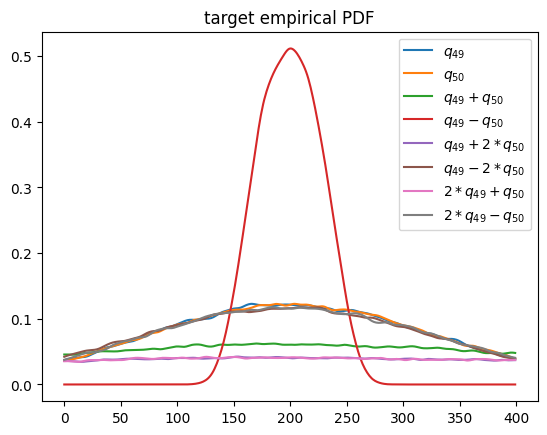

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(2.).float()
        self.x_pdf2_s = torch.tensor(2.).float()
        self.x_acf2_s = torch.tensor(2.).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8319, 0.8206, acf: 0.09769, ccf: 0.09793, pdf: 0.29325, pdf2: 0.28996, acf2: 0.04174
[50]-th step loss: 0.0960, 0.1103, acf: 0.01881, ccf: 0.01877, pdf: 0.03196, pdf2: 0.02980, acf2: 0.01097
[100]-th step loss: 0.0207, 0.0161, acf: 0.00251, ccf: 0.00253, pdf: 0.00500, pdf2: 0.00394, acf2: 0.00213
[150]-th step loss: 0.0159, 0.0097, acf: 0.00161, ccf: 0.00164, pdf: 0.00261, pdf2: 0.00234, acf2: 0.00151
[200]-th step loss: 0.0691, 0.0806, acf: 0.01482, ccf: 0.01477, pdf: 0.02380, pdf2: 0.02397, acf2: 0.00321
[250]-th step loss: 0.0142, 0.0145, acf: 0.00066, ccf: 0.00066, pdf: 0.00508, pdf2: 0.00541, acf2: 0.00263
[300]-th step loss: 0.0152, 0.0123, acf: 0.00105, ccf: 0.00108, pdf: 0.00416, pdf2: 0.00511, acf2: 0.00088
[350]-th step loss: 0.1984, 0.1717, acf: 0.05252, ccf: 0.05240, pdf: 0.00829, pdf2: 0.04578, acf2: 0.01266
[400]-th step loss: 0.0724, 0.0755, acf: 0.00860, ccf: 0.00845, pdf: 0.00829, pdf2: 0.04455, acf2: 0.00565
[450]-th step loss: 0.0705, 0.0667, acf:

[3850]-th step loss: 0.0711, 0.0690, acf: 0.00031, ccf: 0.00032, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01533
[3900]-th step loss: 0.0701, 0.0670, acf: 0.00047, ccf: 0.00047, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01300
[3950]-th step loss: 0.0663, 0.0679, acf: 0.00032, ccf: 0.00033, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01418
[4000]-th step loss: 0.0701, 0.0686, acf: 0.00029, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01497
[4050]-th step loss: 0.0695, 0.0654, acf: 0.00073, ccf: 0.00073, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01087
[4100]-th step loss: 0.0700, 0.0693, acf: 0.00030, ccf: 0.00032, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01563
[4150]-th step loss: 0.0699, 0.0673, acf: 0.00034, ccf: 0.00035, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01352
[4200]-th step loss: 0.0682, 0.0667, acf: 0.00044, ccf: 0.00044, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01277
[4250]-th step loss: 0.0721, 0.0680, acf: 0.00031, ccf: 0.00032, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01434
[4300]-th step loss: 0.0710,

[7650]-th step loss: 0.0688, 0.0687, acf: 0.00036, ccf: 0.00036, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01497
[7700]-th step loss: 0.0677, 0.0688, acf: 0.00033, ccf: 0.00034, pdf: 0.00829, pdf2: 0.04473, acf2: 0.01512
[7750]-th step loss: 0.0686, 0.0665, acf: 0.00056, ccf: 0.00056, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01238
[7800]-th step loss: 0.0704, 0.0689, acf: 0.00032, ccf: 0.00033, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01525
[7850]-th step loss: 0.0718, 0.0696, acf: 0.00032, ccf: 0.00033, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01592
[7900]-th step loss: 0.0703, 0.0685, acf: 0.00033, ccf: 0.00034, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01475
[7950]-th step loss: 0.0673, 0.0684, acf: 0.00033, ccf: 0.00034, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01465
[8000]-th step loss: 0.0685, 0.0684, acf: 0.00033, ccf: 0.00034, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01466
[8050]-th step loss: 0.0691, 0.0687, acf: 0.00031, ccf: 0.00032, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01505
[8100]-th step loss: 0.0709,

[11450]-th step loss: 0.0662, 0.0679, acf: 0.00029, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01424
[11500]-th step loss: 0.0674, 0.0674, acf: 0.00030, ccf: 0.00031, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01381
[11550]-th step loss: 0.0712, 0.0694, acf: 0.00028, ccf: 0.00029, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01581
[11600]-th step loss: 0.0667, 0.0659, acf: 0.00052, ccf: 0.00053, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01184
[11650]-th step loss: 0.0705, 0.0705, acf: 0.00027, ccf: 0.00028, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01690
[11700]-th step loss: 0.0677, 0.0684, acf: 0.00025, ccf: 0.00026, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01485
[11750]-th step loss: 0.0679, 0.0701, acf: 0.00026, ccf: 0.00027, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01653
[11800]-th step loss: 0.0690, 0.0693, acf: 0.00024, ccf: 0.00025, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01575
[11850]-th step loss: 0.0688, 0.0676, acf: 0.00029, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01401
[11900]-th step los

[15250]-th step loss: 0.0671, 0.0655, acf: 0.00043, ccf: 0.00043, pdf: 0.00829, pdf2: 0.04461, acf2: 0.01176
[15300]-th step loss: 0.0680, 0.0716, acf: 0.00027, ccf: 0.00028, pdf: 0.00829, pdf2: 0.04465, acf2: 0.01806
[15350]-th step loss: 0.0671, 0.0687, acf: 0.00025, ccf: 0.00026, pdf: 0.00829, pdf2: 0.04465, acf2: 0.01522
[15400]-th step loss: 0.0706, 0.0652, acf: 0.00053, ccf: 0.00053, pdf: 0.00829, pdf2: 0.04456, acf2: 0.01133
[15450]-th step loss: 0.0688, 0.0689, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04462, acf2: 0.01560
[15500]-th step loss: 0.0676, 0.0687, acf: 0.00016, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04460, acf2: 0.01550
[15550]-th step loss: 0.0680, 0.0672, acf: 0.00020, ccf: 0.00020, pdf: 0.00829, pdf2: 0.04457, acf2: 0.01394
[15600]-th step loss: 0.0718, 0.0700, acf: 0.00019, ccf: 0.00020, pdf: 0.00829, pdf2: 0.04465, acf2: 0.01667
[15650]-th step loss: 0.0708, 0.0677, acf: 0.00018, ccf: 0.00019, pdf: 0.00829, pdf2: 0.04465, acf2: 0.01437
[15700]-th step los

[19050]-th step loss: 0.0675, 0.0657, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04379, acf2: 0.01351
[19100]-th step loss: 0.0660, 0.0658, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04368, acf2: 0.01376
[19150]-th step loss: 0.0678, 0.0655, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04366, acf2: 0.01342
[19200]-th step loss: 0.0658, 0.0658, acf: 0.00006, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04393, acf2: 0.01350
[19250]-th step loss: 0.0668, 0.0661, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04352, acf2: 0.01421
[19300]-th step loss: 0.0645, 0.0649, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.04351, acf2: 0.01289
[19350]-th step loss: 0.0702, 0.0698, acf: 0.00016, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04346, acf2: 0.01772
[19400]-th step loss: 0.0672, 0.0657, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04361, acf2: 0.01370
[19450]-th step loss: 0.0669, 0.0657, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04348, acf2: 0.01391
[19500]-th step los

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

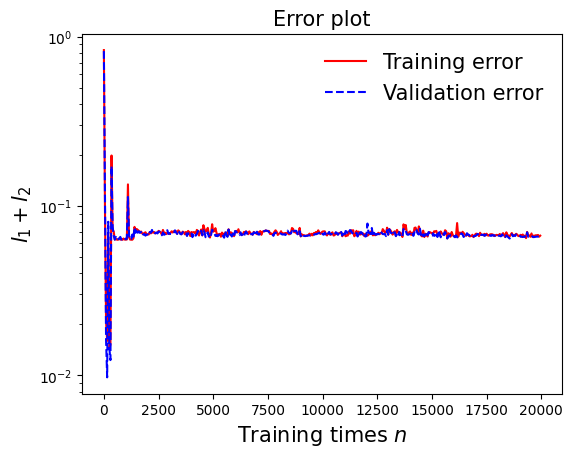

In [25]:
draw_loss(model)

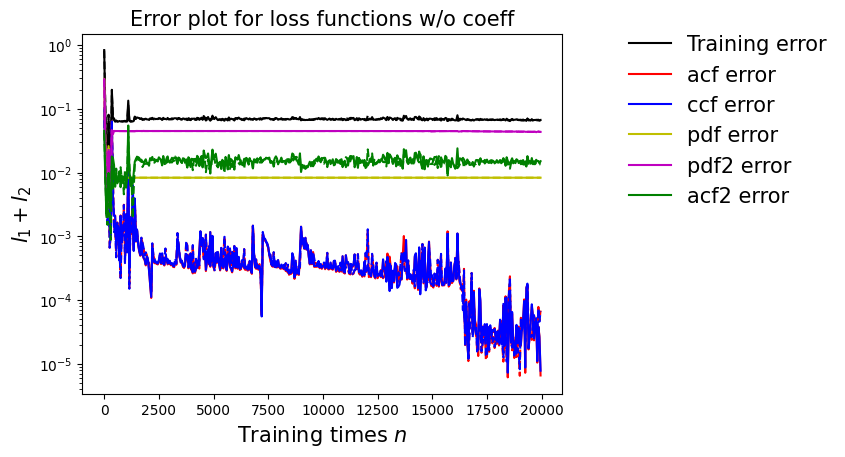

In [26]:
draw_errors(model)

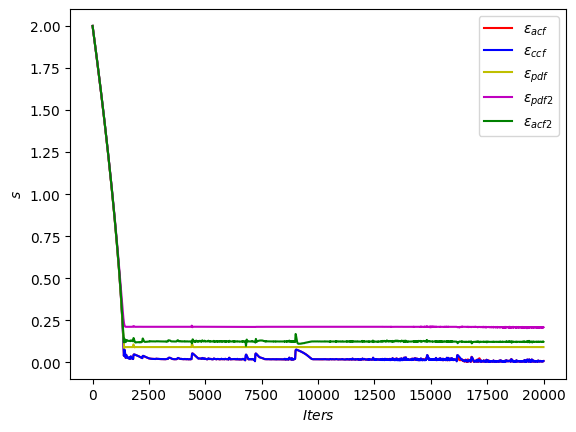

In [27]:
draw_adaptive_w(model)

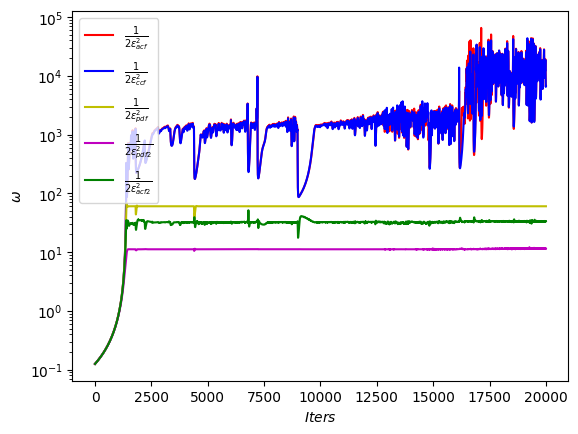

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

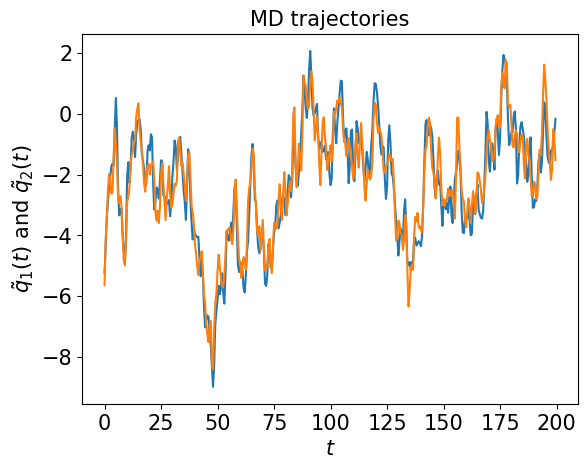

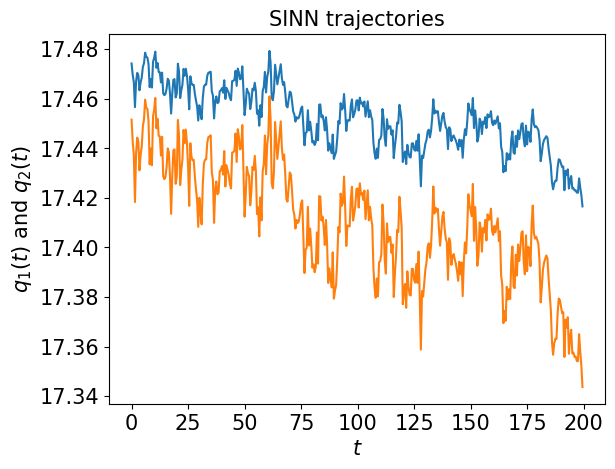

In [36]:
test1(model)

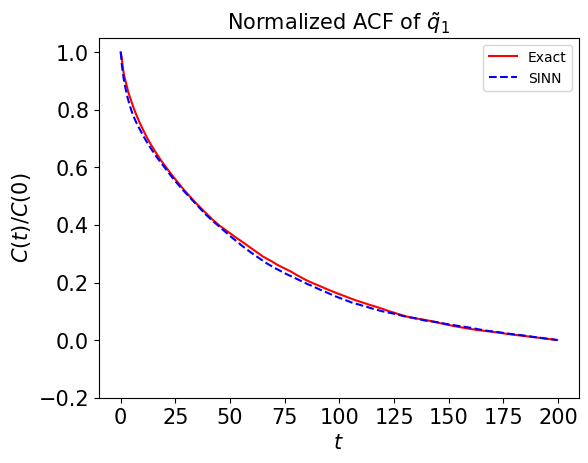

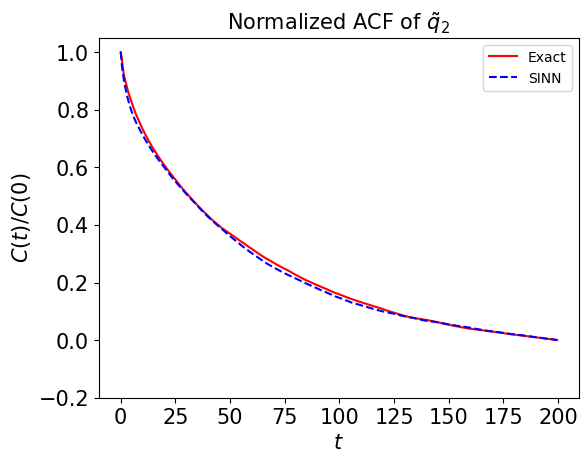

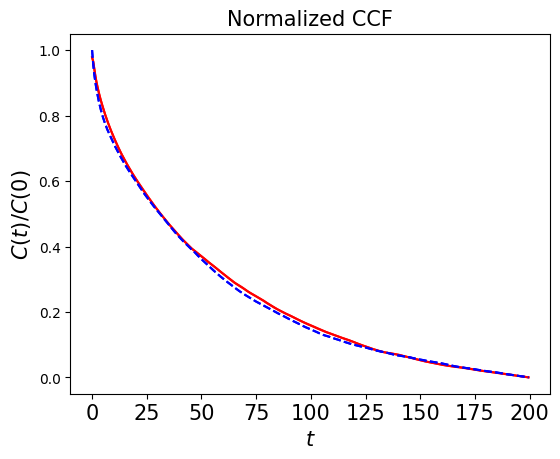

In [37]:
test2(model)

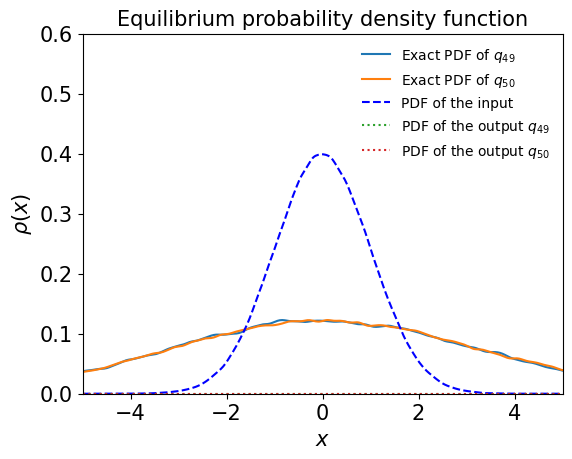

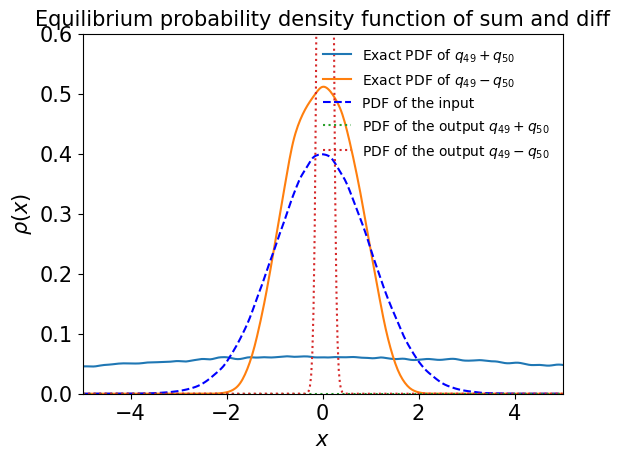

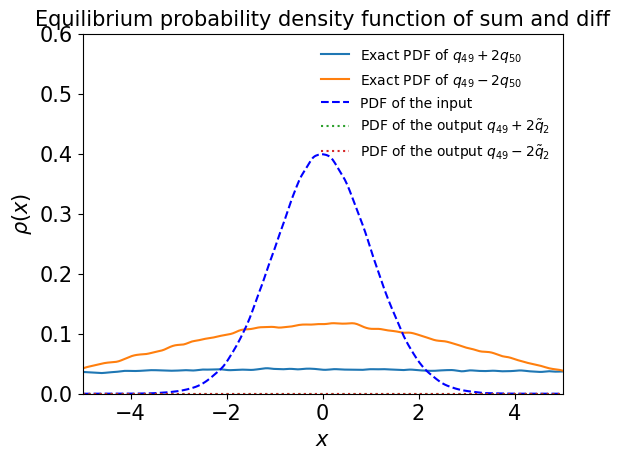

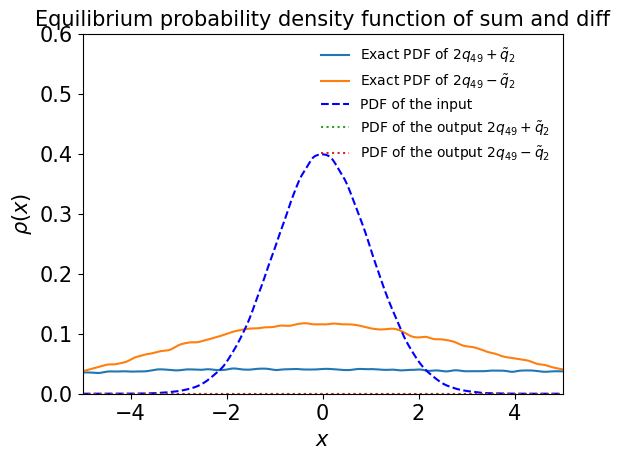

In [38]:
test3(model)

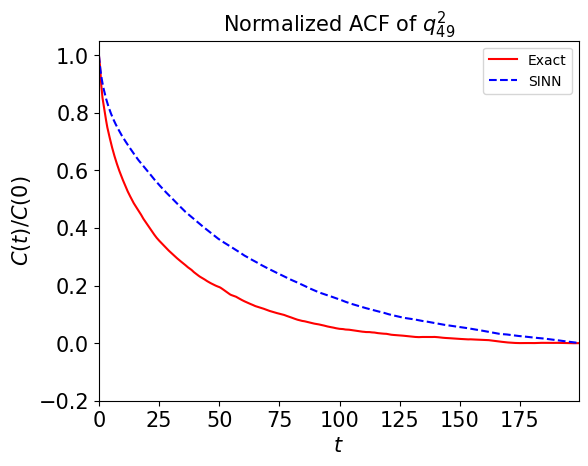

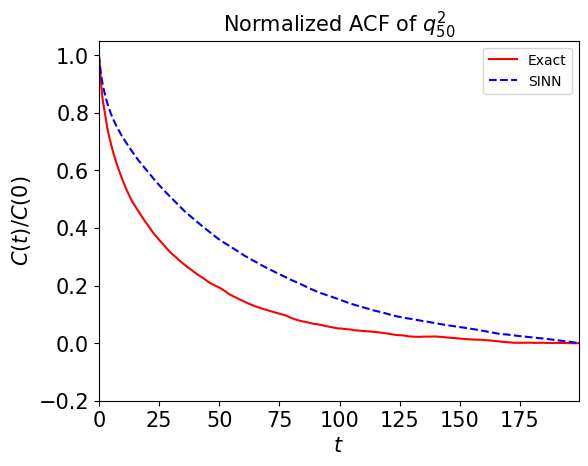

In [39]:
test4(model)

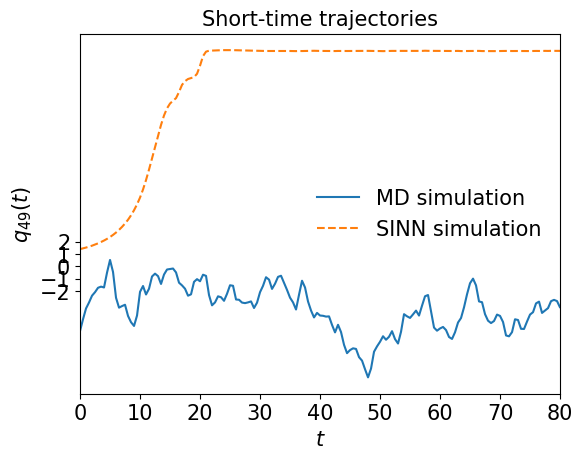

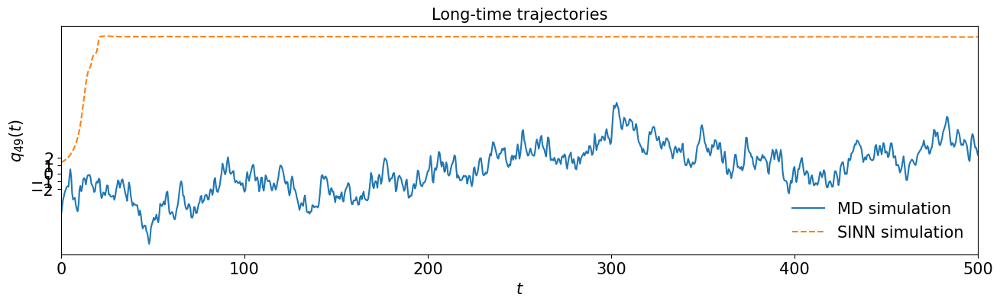

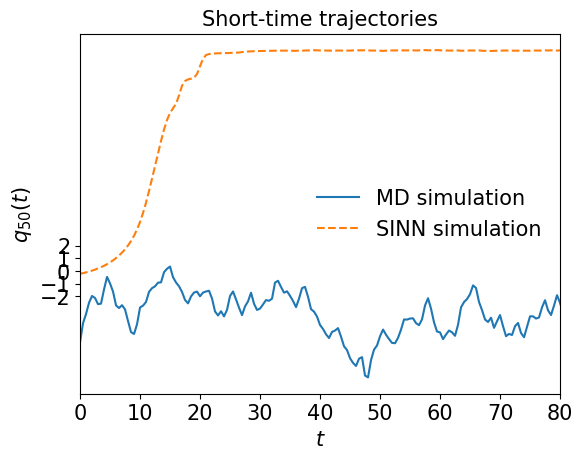

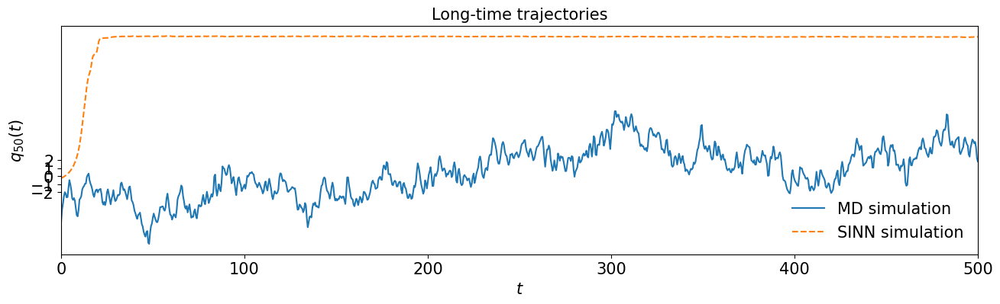

In [40]:
test5(model)

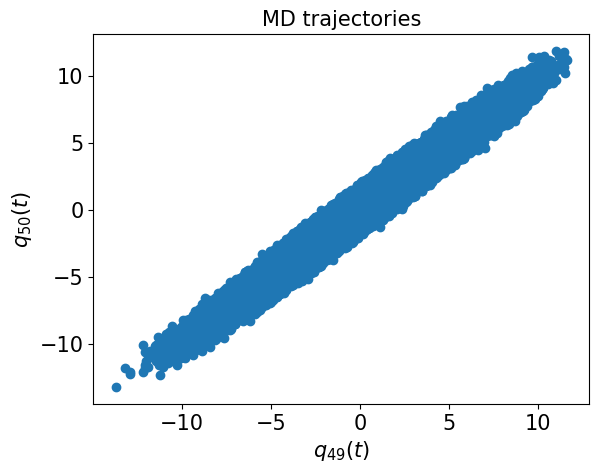

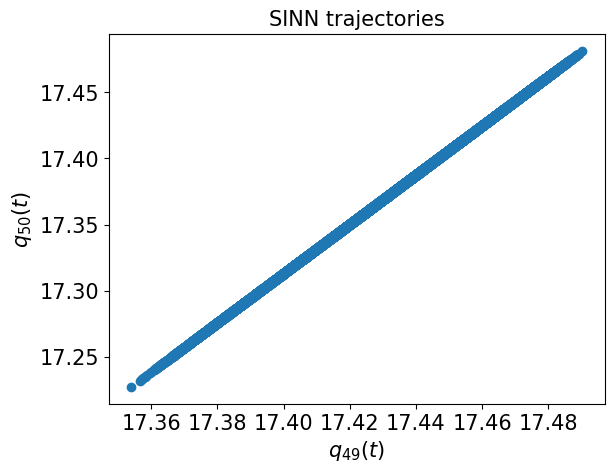

In [41]:
test6(model)

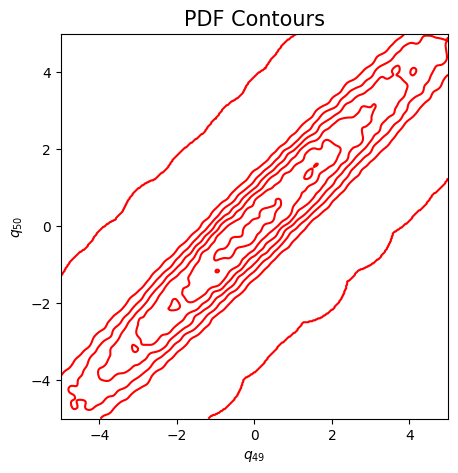

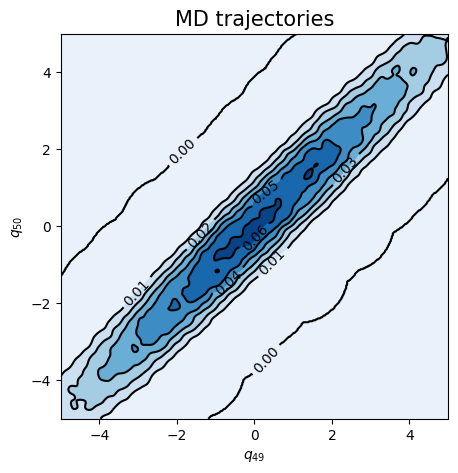

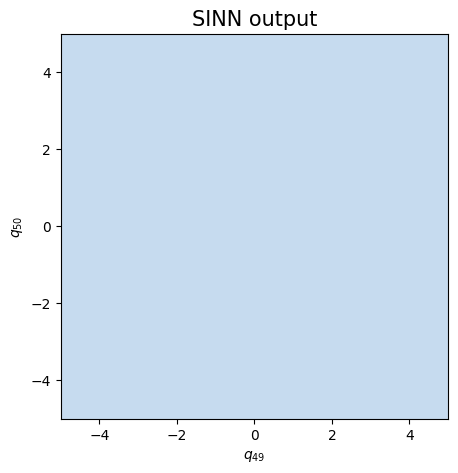

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8651, 0.8617, acf: 0.11002, ccf: 0.11648, pdf: 0.29322, pdf2: 0.28987, acf2: 0.05214
[50]-th step loss: 0.0713, 0.0646, acf: 0.01248, ccf: 0.01245, pdf: 0.01642, pdf2: 0.01924, acf2: 0.00406
[100]-th step loss: 0.0169, 0.0171, acf: 0.00213, ccf: 0.00211, pdf: 0.00465, pdf2: 0.00677, acf2: 0.00141
[150]-th step loss: 0.5863, 0.5619, acf: 0.06840, ccf: 0.06827, pdf: 0.30706, pdf2: 0.09665, acf2: 0.02154
[200]-th step loss: 0.4197, 0.4212, acf: 0.00045, ccf: 0.00039, pdf: 0.30618, pdf2: 0.10197, acf2: 0.01221
[250]-th step loss: 0.4154, 0.4175, acf: 0.00026, ccf: 0.00025, pdf: 0.30677, pdf2: 0.09810, acf2: 0.01210
[300]-th step loss: 0.4136, 0.4167, acf: 0.00015, ccf: 0.00015, pdf: 0.30681, pdf2: 0.09664, acf2: 0.01294
[350]-th step loss: 0.1723, 0.1506, acf: 0.01381, ccf: 0.01377, pdf: 0.06694, pdf2: 0.05481, acf2: 0.00132
[400]-th step loss: 0.0271, 0.0296, acf: 0.00062, ccf: 0.00071, pdf: 0.00829, pdf2: 0.00753, acf2: 0.01240
[450]-th step loss: 0.0267, 0.0256, acf:

[3850]-th step loss: 0.0221, 0.0258, acf: 0.00020, ccf: 0.00020, pdf: 0.00825, pdf2: 0.00392, acf2: 0.01327
[3900]-th step loss: 0.0343, 0.0350, acf: 0.00127, ccf: 0.00128, pdf: 0.00820, pdf2: 0.00380, acf2: 0.02044
[3950]-th step loss: 0.0271, 0.0295, acf: 0.00025, ccf: 0.00025, pdf: 0.00840, pdf2: 0.00485, acf2: 0.01579
[4000]-th step loss: 0.0245, 0.0304, acf: 0.00051, ccf: 0.00052, pdf: 0.00826, pdf2: 0.00378, acf2: 0.01732
[4050]-th step loss: 0.0256, 0.0300, acf: 0.00053, ccf: 0.00054, pdf: 0.00819, pdf2: 0.00370, acf2: 0.01708
[4100]-th step loss: 0.0239, 0.0307, acf: 0.00052, ccf: 0.00052, pdf: 0.00824, pdf2: 0.00386, acf2: 0.01756
[4150]-th step loss: 0.0246, 0.0277, acf: 0.00022, ccf: 0.00023, pdf: 0.00836, pdf2: 0.00392, acf2: 0.01498
[4200]-th step loss: 0.0274, 0.0299, acf: 0.00067, ccf: 0.00068, pdf: 0.00811, pdf2: 0.00371, acf2: 0.01674
[4250]-th step loss: 0.0232, 0.0289, acf: 0.00031, ccf: 0.00032, pdf: 0.00820, pdf2: 0.00470, acf2: 0.01532
[4300]-th step loss: 0.0259,

[7650]-th step loss: 0.0845, 0.0653, acf: 0.00235, ccf: 0.00232, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00765
[7700]-th step loss: 0.0691, 0.0713, acf: 0.00175, ccf: 0.00176, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01475
[7750]-th step loss: 0.0765, 0.0904, acf: 0.00617, ccf: 0.00608, pdf: 0.00854, pdf2: 0.04429, acf2: 0.02530
[7800]-th step loss: 0.0767, 0.1065, acf: 0.00642, ccf: 0.00646, pdf: 0.00829, pdf2: 0.04483, acf2: 0.04053
[7850]-th step loss: 0.0668, 0.0666, acf: 0.00094, ccf: 0.00094, pdf: 0.00829, pdf2: 0.04483, acf2: 0.01156
[7900]-th step loss: 0.0692, 0.0715, acf: 0.00037, ccf: 0.00038, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01777
[7950]-th step loss: 0.0677, 0.0708, acf: 0.00027, ccf: 0.00028, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01721
[8000]-th step loss: 0.0641, 0.0737, acf: 0.00066, ccf: 0.00067, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01935
[8050]-th step loss: 0.0766, 0.0741, acf: 0.00047, ccf: 0.00049, pdf: 0.00829, pdf2: 0.04474, acf2: 0.02014
[8100]-th step loss: 0.0676,

[11450]-th step loss: 0.0662, 0.0711, acf: 0.00023, ccf: 0.00024, pdf: 0.00829, pdf2: 0.04462, acf2: 0.01770
[11500]-th step loss: 0.0654, 0.0692, acf: 0.00010, ccf: 0.00010, pdf: 0.00829, pdf2: 0.04462, acf2: 0.01610
[11550]-th step loss: 0.0692, 0.0777, acf: 0.00098, ccf: 0.00100, pdf: 0.00829, pdf2: 0.04457, acf2: 0.02285
[11600]-th step loss: 0.0712, 0.0748, acf: 0.00065, ccf: 0.00066, pdf: 0.00829, pdf2: 0.04458, acf2: 0.02064
[11650]-th step loss: 0.0708, 0.0737, acf: 0.00049, ccf: 0.00050, pdf: 0.00829, pdf2: 0.04461, acf2: 0.01985
[11700]-th step loss: 0.0680, 0.0755, acf: 0.00071, ccf: 0.00072, pdf: 0.00829, pdf2: 0.04455, acf2: 0.02120
[11750]-th step loss: 0.0663, 0.0732, acf: 0.00037, ccf: 0.00038, pdf: 0.00829, pdf2: 0.04453, acf2: 0.01966
[11800]-th step loss: 0.0632, 0.0718, acf: 0.00029, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04444, acf2: 0.01844
[11850]-th step loss: 0.0683, 0.0716, acf: 0.00030, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04457, acf2: 0.01811
[11900]-th step los

[15250]-th step loss: 0.0281, 0.0312, acf: 0.00036, ccf: 0.00037, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01846
[15300]-th step loss: 0.0298, 0.0372, acf: 0.00056, ccf: 0.00057, pdf: 0.00829, pdf2: 0.00749, acf2: 0.02028
[15350]-th step loss: 0.0263, 0.0327, acf: 0.00052, ccf: 0.00053, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01969
[15400]-th step loss: 0.0310, 0.0358, acf: 0.00089, ccf: 0.00090, pdf: 0.00829, pdf2: 0.00374, acf2: 0.02199
[15450]-th step loss: 0.0268, 0.0335, acf: 0.00054, ccf: 0.00055, pdf: 0.00829, pdf2: 0.00428, acf2: 0.01980
[15500]-th step loss: 0.0245, 0.0402, acf: 0.00116, ccf: 0.00117, pdf: 0.00829, pdf2: 0.00601, acf2: 0.02361
[15550]-th step loss: 0.0247, 0.0301, acf: 0.00026, ccf: 0.00026, pdf: 0.00829, pdf2: 0.00384, acf2: 0.01749
[15600]-th step loss: 0.0466, 0.0483, acf: 0.00074, ccf: 0.00075, pdf: 0.00829, pdf2: 0.01803, acf2: 0.02052
[15650]-th step loss: 0.0433, 0.0452, acf: 0.00047, ccf: 0.00048, pdf: 0.00829, pdf2: 0.01657, acf2: 0.01941
[15700]-th step los

[19050]-th step loss: 0.0306, 0.0351, acf: 0.00071, ccf: 0.00072, pdf: 0.00829, pdf2: 0.00467, acf2: 0.02073
[19100]-th step loss: 0.0302, 0.0349, acf: 0.00070, ccf: 0.00071, pdf: 0.00829, pdf2: 0.00449, acf2: 0.02070
[19150]-th step loss: 0.0254, 0.0310, acf: 0.00037, ccf: 0.00038, pdf: 0.00829, pdf2: 0.00365, acf2: 0.01832
[19200]-th step loss: 0.0264, 0.0329, acf: 0.00054, ccf: 0.00054, pdf: 0.00829, pdf2: 0.00461, acf2: 0.01892
[19250]-th step loss: 0.0282, 0.0329, acf: 0.00059, ccf: 0.00060, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01968
[19300]-th step loss: 0.0261, 0.0330, acf: 0.00027, ccf: 0.00027, pdf: 0.00829, pdf2: 0.00640, acf2: 0.01780
[19350]-th step loss: 0.0258, 0.0311, acf: 0.00035, ccf: 0.00035, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01842
[19400]-th step loss: 0.0274, 0.0427, acf: 0.00077, ccf: 0.00076, pdf: 0.00829, pdf2: 0.01126, acf2: 0.02161
[19450]-th step loss: 0.0251, 0.0376, acf: 0.00082, ccf: 0.00081, pdf: 0.00829, pdf2: 0.00641, acf2: 0.02130
[19500]-th step los

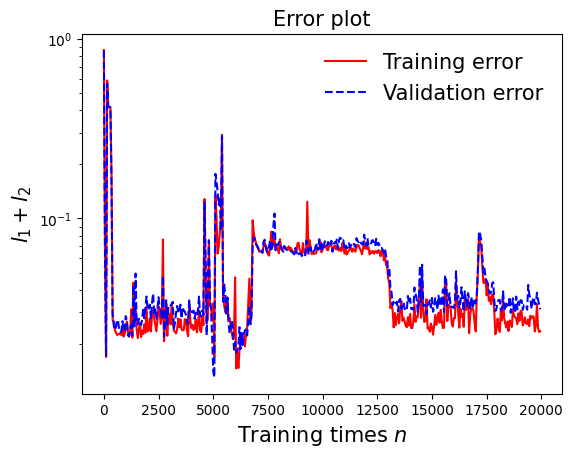

In [44]:
draw_loss(model1)

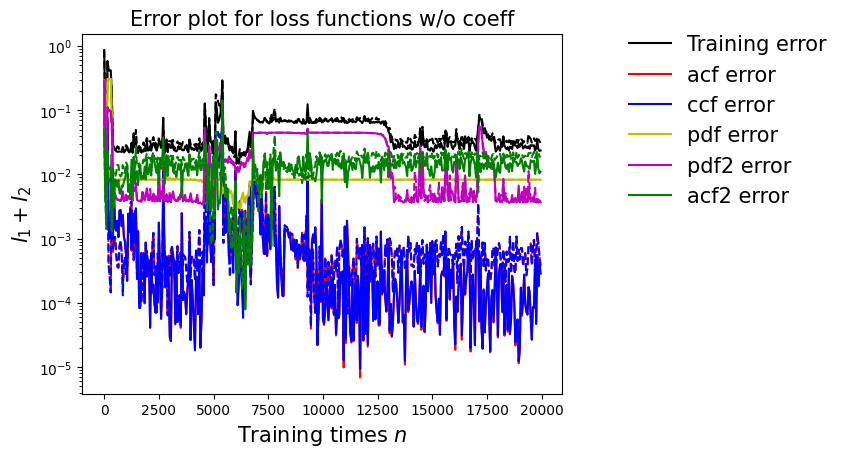

In [45]:
draw_errors(model1)

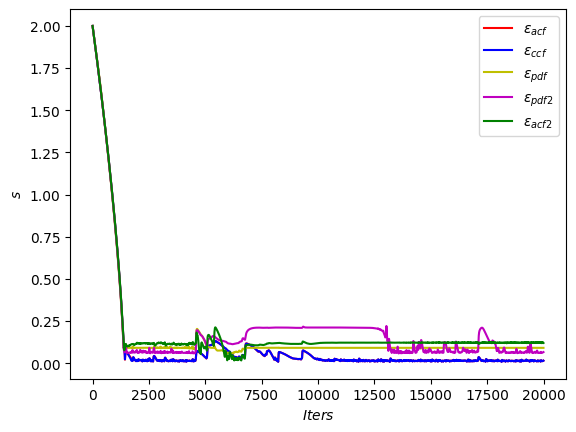

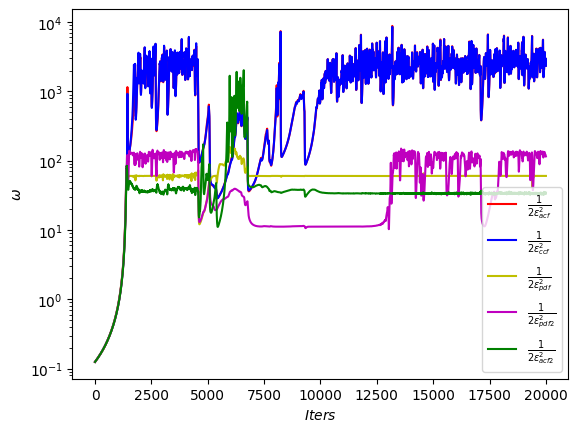

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

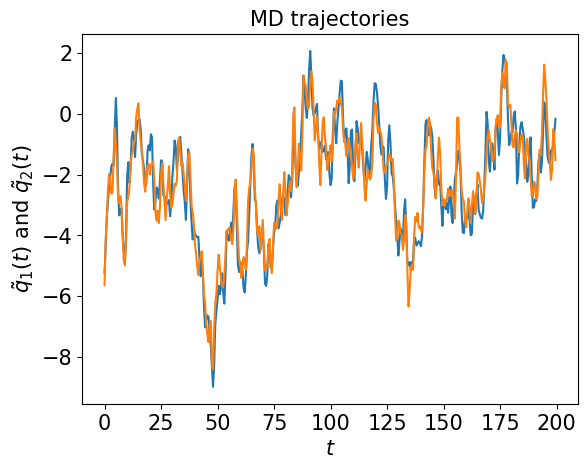

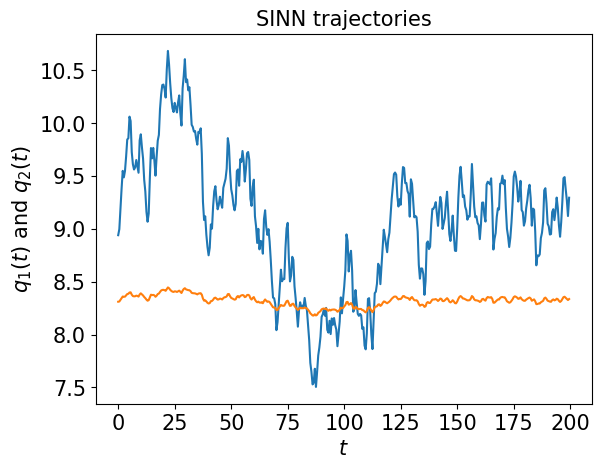

In [47]:
test1(model1)

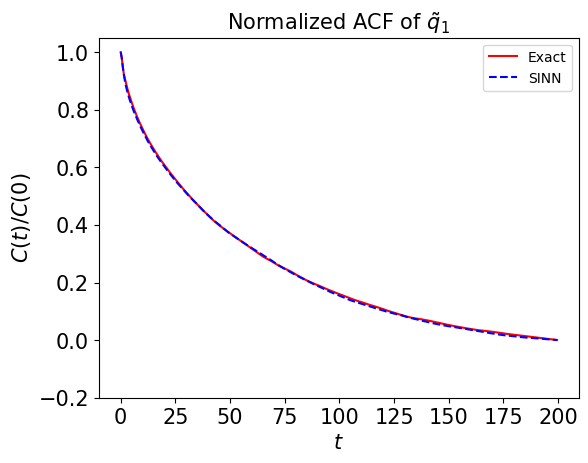

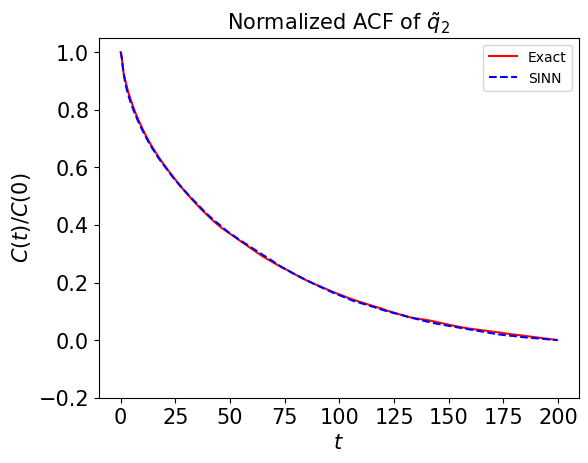

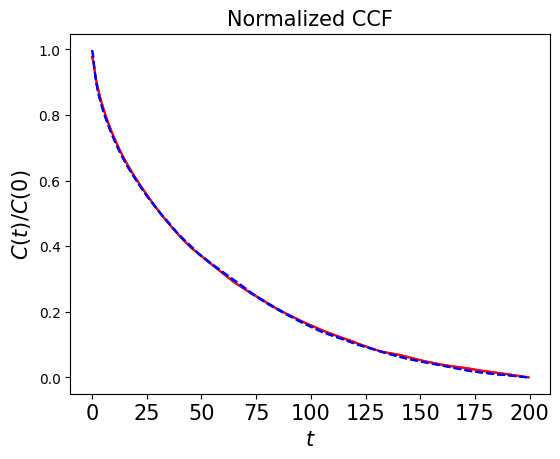

In [48]:
test2(model1)

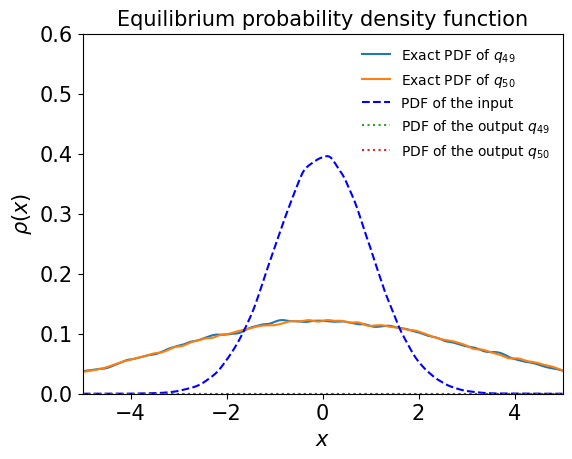

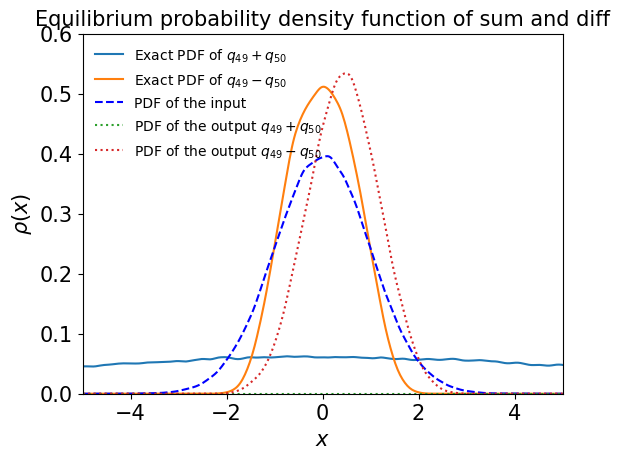

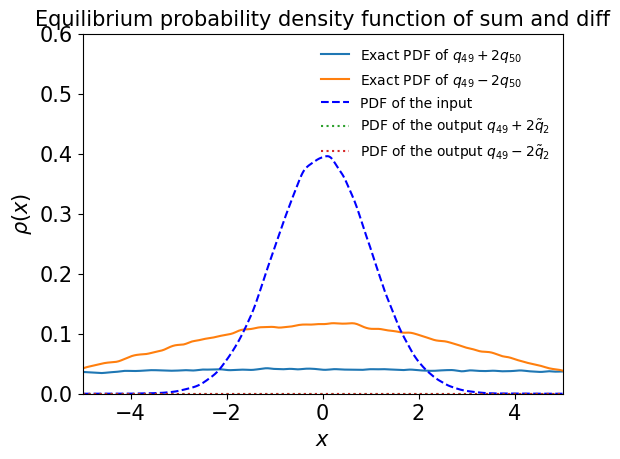

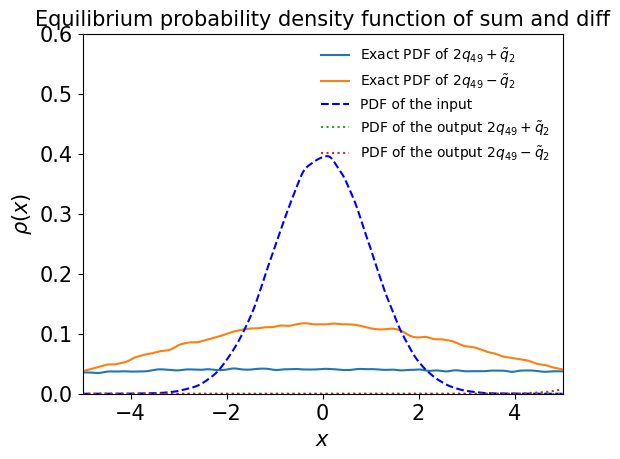

In [49]:
test3(model1)

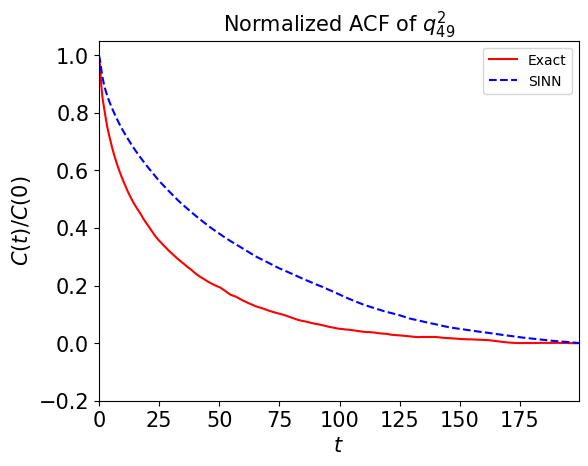

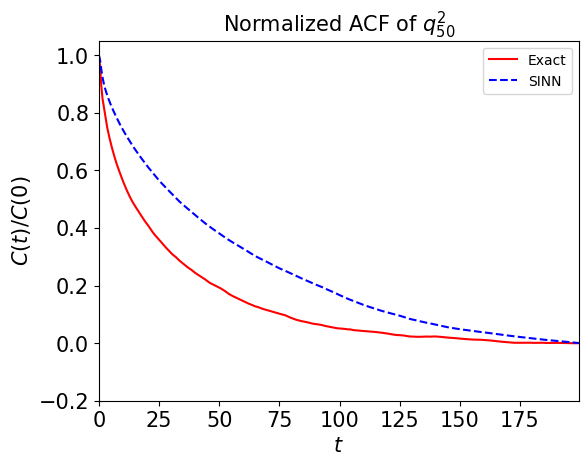

In [50]:
test4(model1)

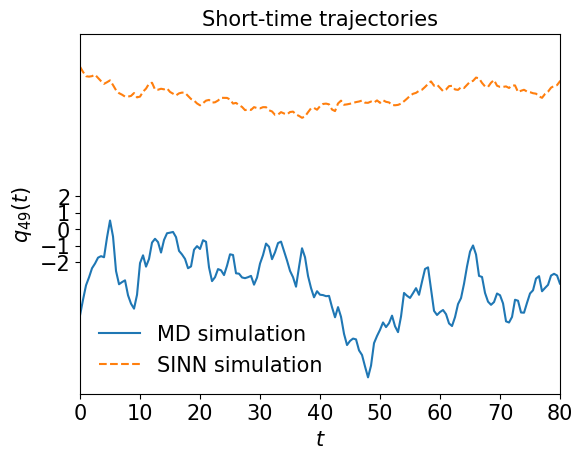

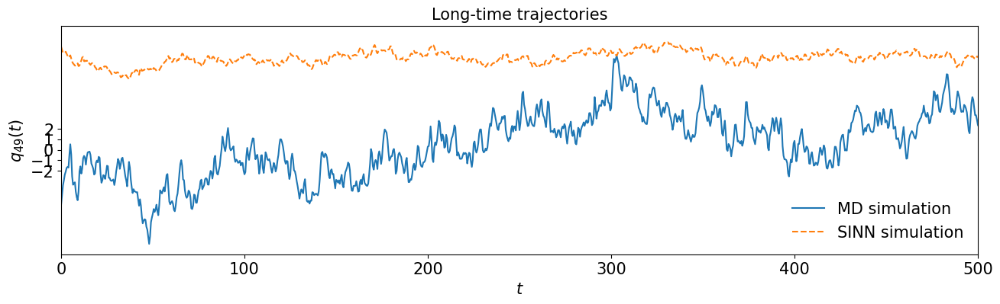

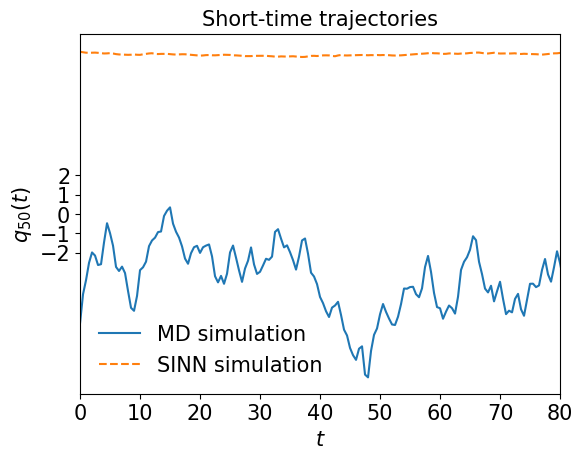

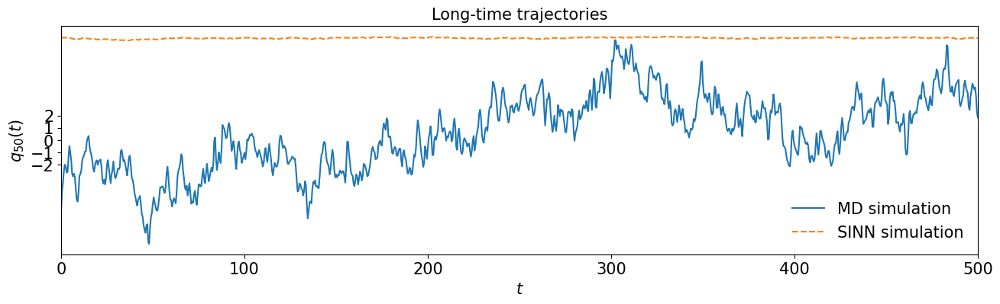

In [51]:
test5(model1)

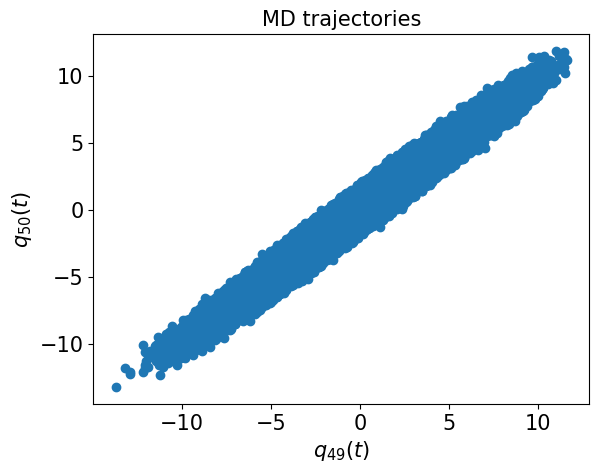

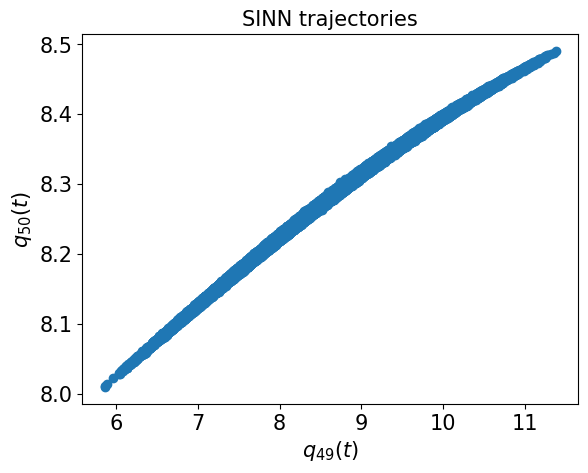

In [52]:
test6(model1)

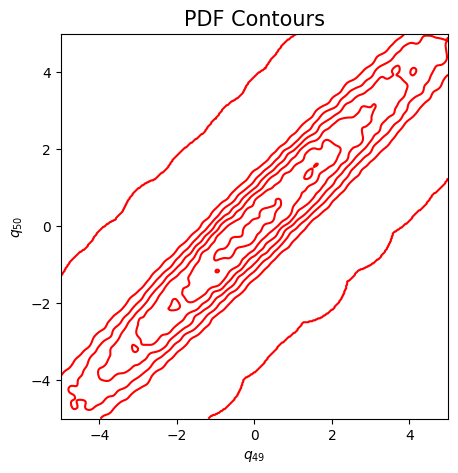

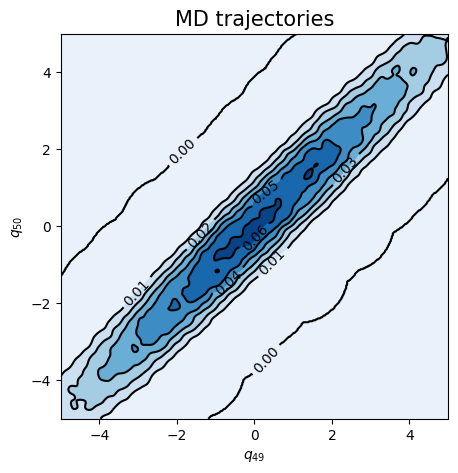

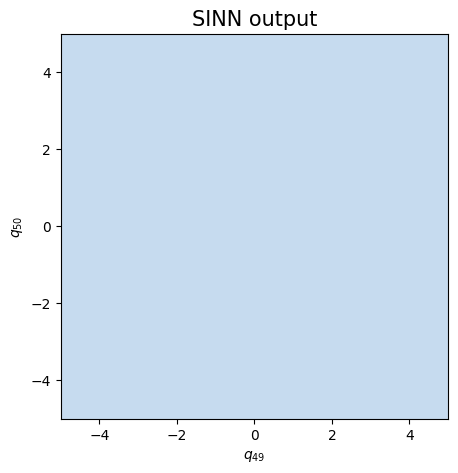

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8675, 0.8179, acf: 0.09676, ccf: 0.09700, pdf: 0.29320, pdf2: 0.28989, acf2: 0.04100
[50]-th step loss: 0.1363, 0.1119, acf: 0.00830, ccf: 0.00825, pdf: 0.04667, pdf2: 0.04018, acf2: 0.00853
[100]-th step loss: 0.0530, 0.0378, acf: 0.00212, ccf: 0.00213, pdf: 0.01252, pdf2: 0.01005, acf2: 0.01097
[150]-th step loss: 0.0314, 0.0304, acf: 0.00069, ccf: 0.00067, pdf: 0.00697, pdf2: 0.00766, acf2: 0.01439
[200]-th step loss: 0.0208, 0.0212, acf: 0.00108, ccf: 0.00108, pdf: 0.00585, pdf2: 0.00375, acf2: 0.00941
[250]-th step loss: 0.1592, 0.0963, acf: 0.02036, ccf: 0.02033, pdf: 0.00829, pdf2: 0.04371, acf2: 0.00363
[300]-th step loss: 0.0231, 0.0215, acf: 0.00227, ccf: 0.00229, pdf: 0.00520, pdf2: 0.00334, acf2: 0.00835
[350]-th step loss: 0.0228, 0.0234, acf: 0.00139, ccf: 0.00147, pdf: 0.00758, pdf2: 0.00658, acf2: 0.00638
[400]-th step loss: 0.0115, 0.0150, acf: 0.00054, ccf: 0.00055, pdf: 0.00434, pdf2: 0.00279, acf2: 0.00679
[450]-th step loss: 0.0133, 0.0105, acf:

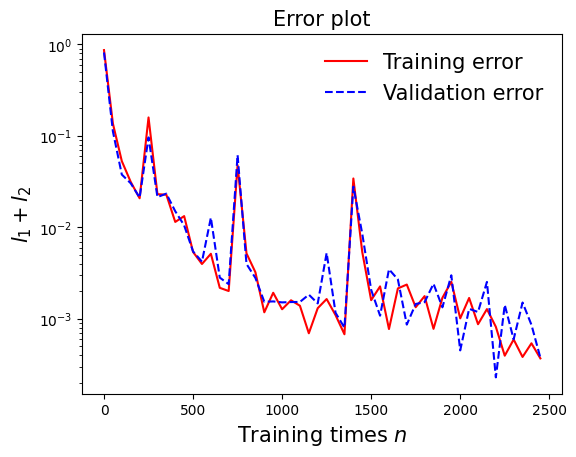

In [55]:
draw_loss(model2)

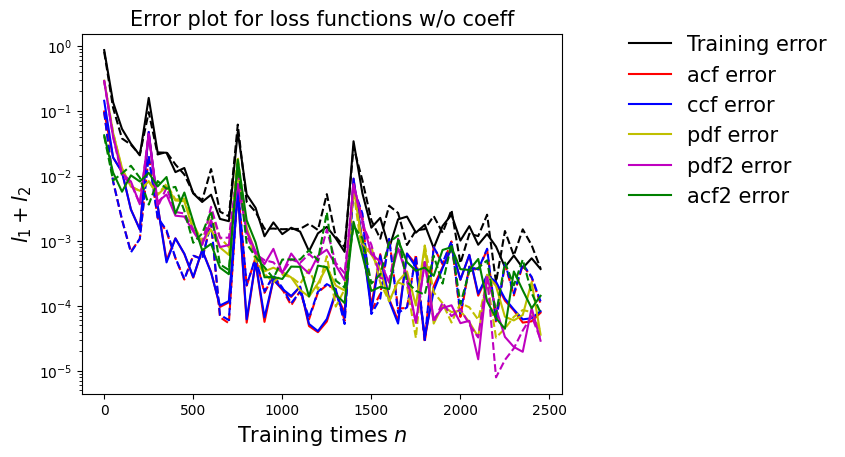

In [56]:
draw_errors(model2)

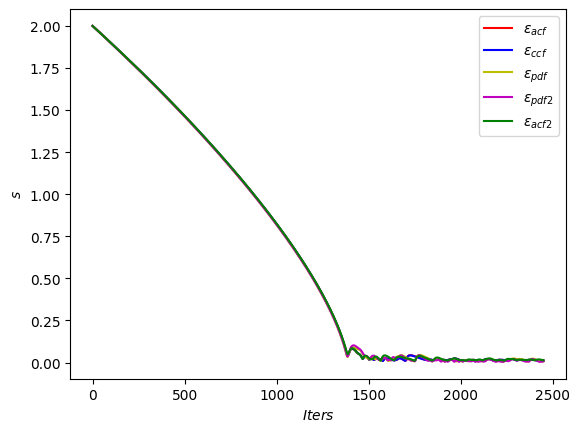

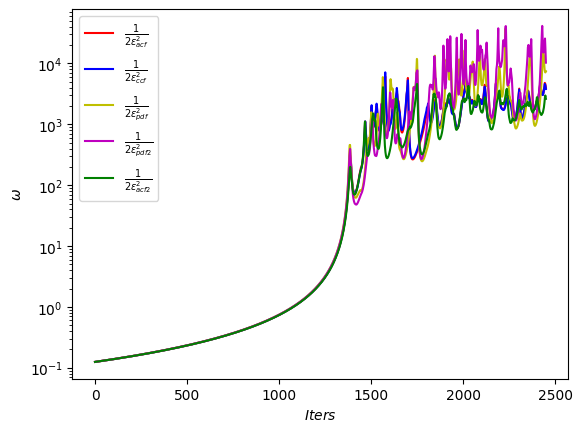

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

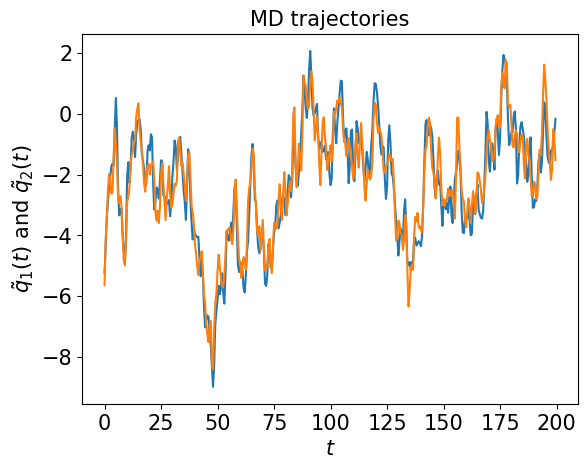

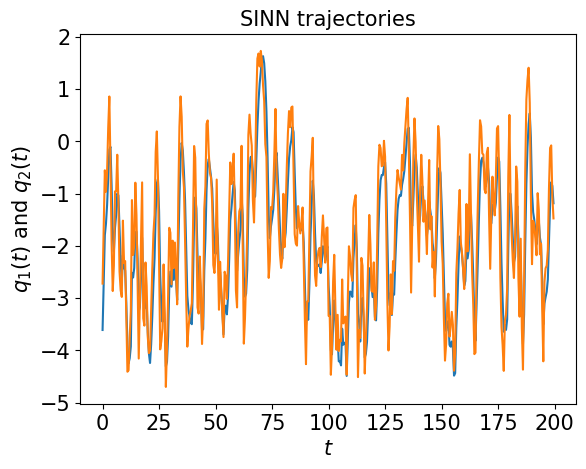

In [58]:
test1(model2)

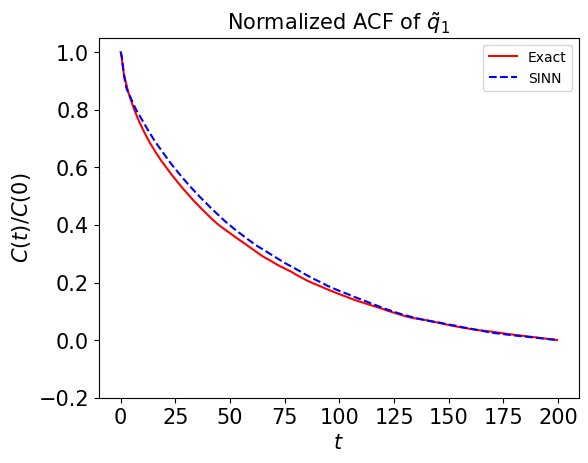

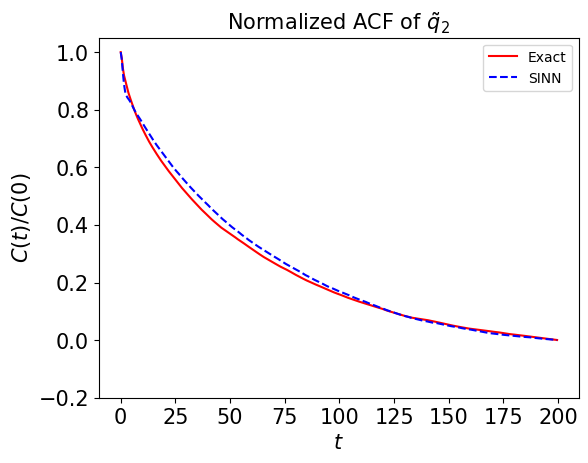

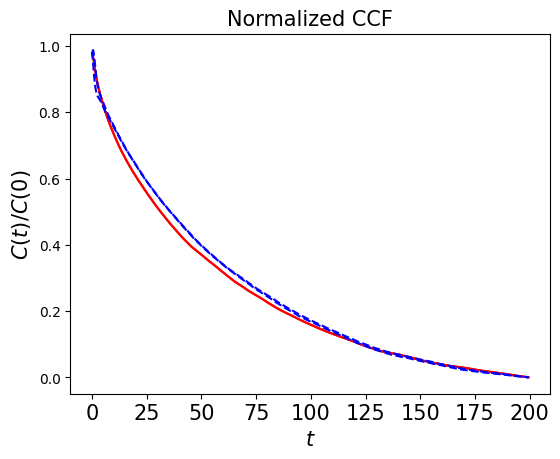

In [59]:
test2(model2)

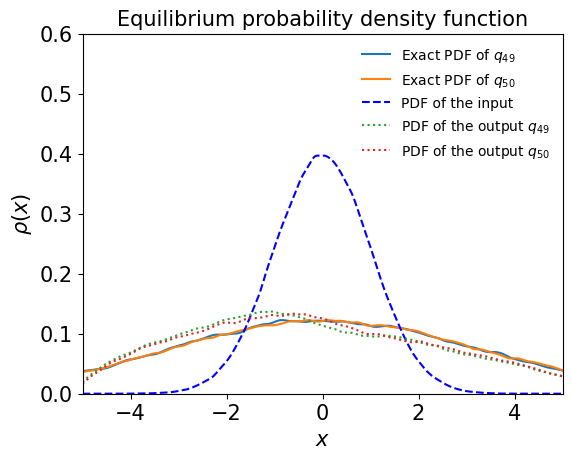

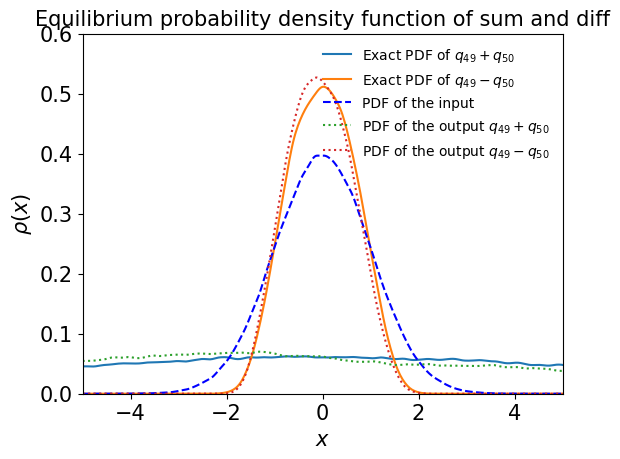

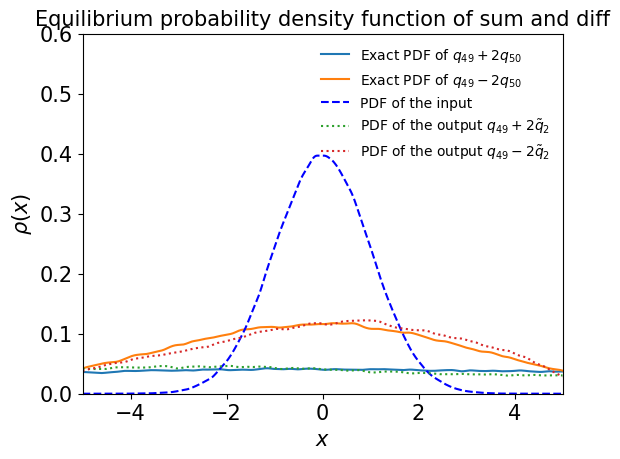

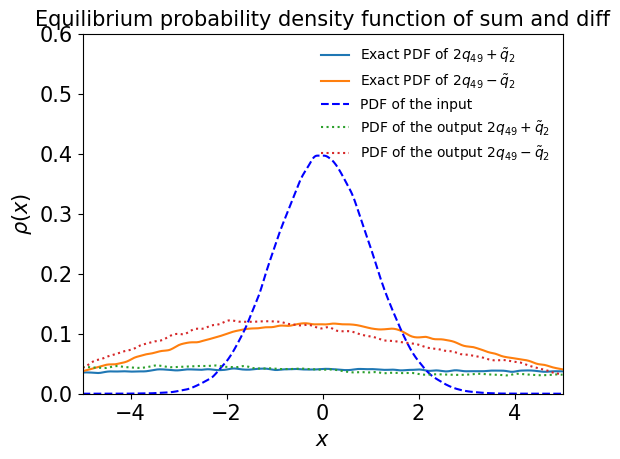

In [60]:
test3(model2)

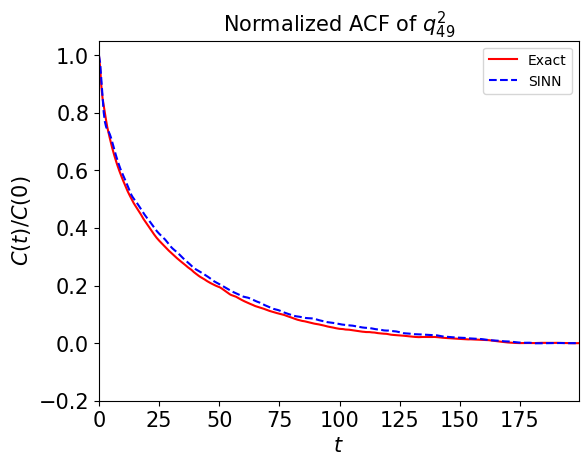

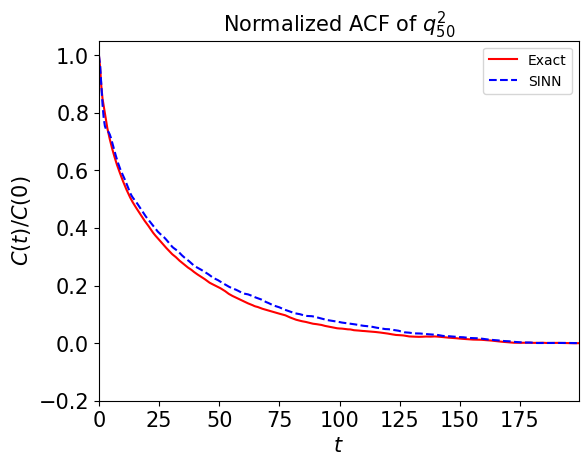

In [61]:
test4(model2)

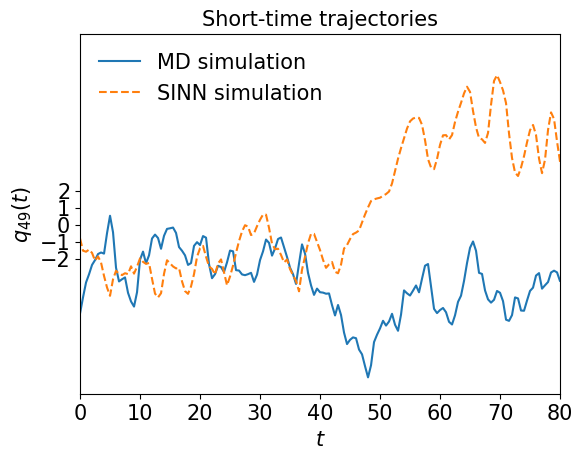

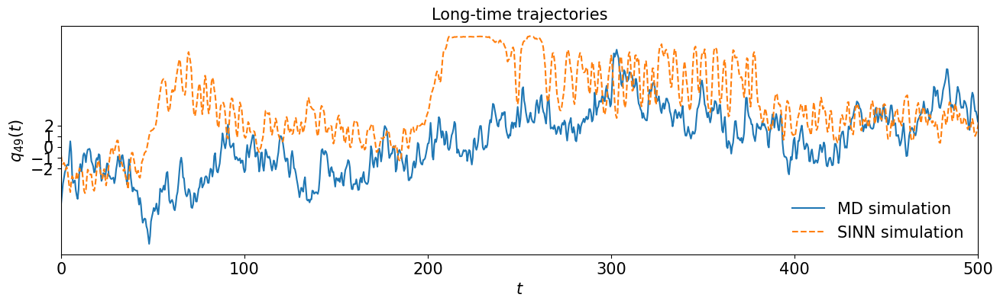

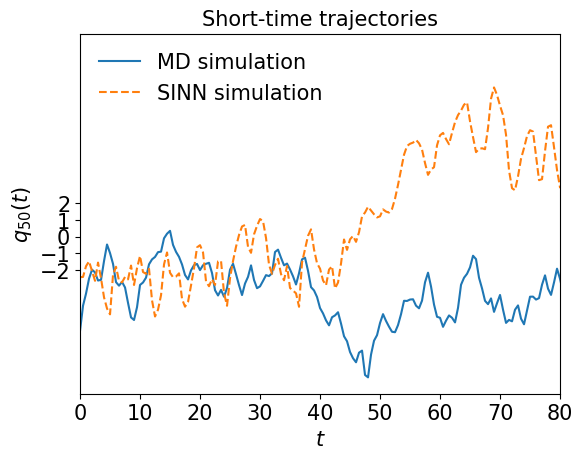

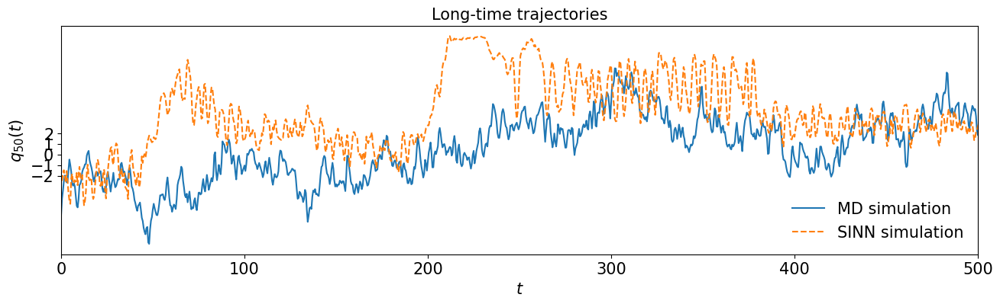

In [62]:
test5(model2)

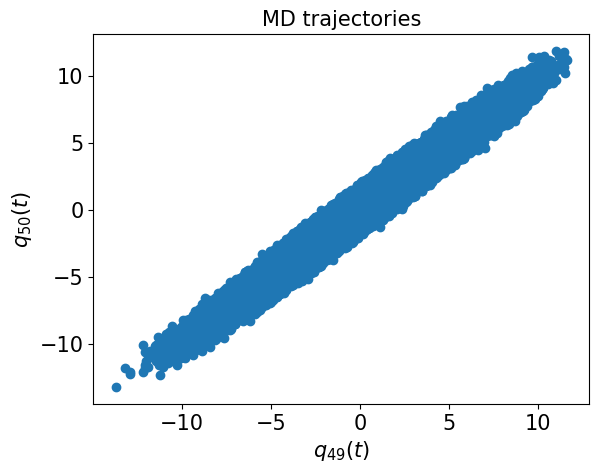

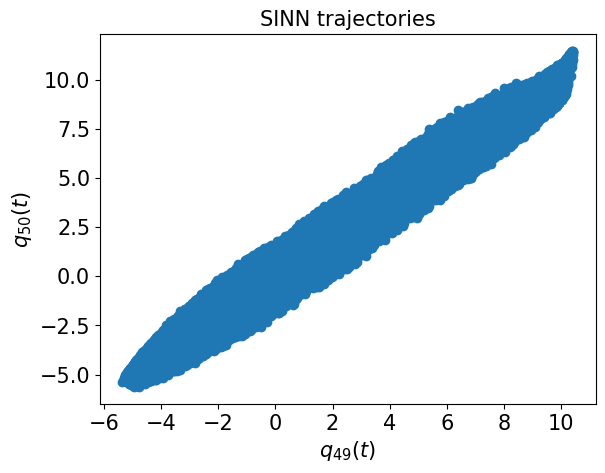

In [63]:
test6(model2)

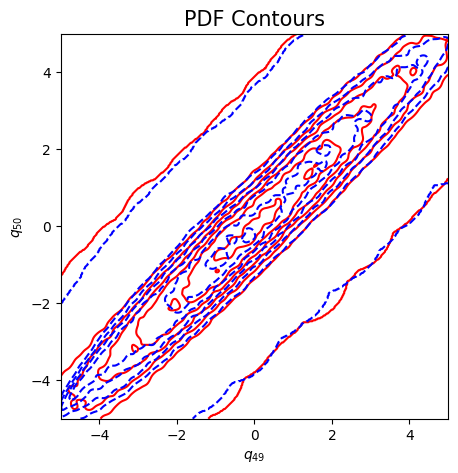

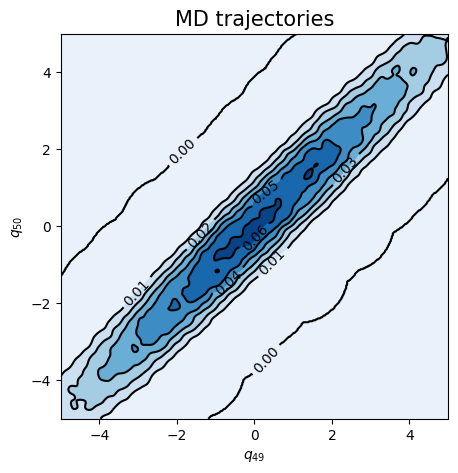

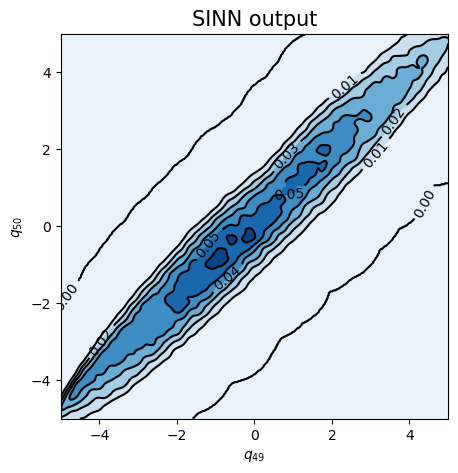

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8638, 0.8312, acf: 0.10169, ccf: 0.10145, pdf: 0.29321, pdf2: 0.28981, acf2: 0.04501
[50]-th step loss: 0.1440, 0.1047, acf: 0.00584, ccf: 0.00586, pdf: 0.05123, pdf2: 0.04086, acf2: 0.00093
[100]-th step loss: 0.0220, 0.0231, acf: 0.00067, ccf: 0.00062, pdf: 0.01085, pdf2: 0.00915, acf2: 0.00185
[150]-th step loss: 0.0287, 0.0257, acf: 0.00145, ccf: 0.00127, pdf: 0.01097, pdf2: 0.01114, acf2: 0.00084
[200]-th step loss: 0.0209, 0.0167, acf: 0.00026, ccf: 0.00027, pdf: 0.00823, pdf2: 0.00694, acf2: 0.00098
[250]-th step loss: 0.0273, 0.0215, acf: 0.00059, ccf: 0.00061, pdf: 0.00733, pdf2: 0.01230, acf2: 0.00065
[300]-th step loss: 0.0158, 0.0170, acf: 0.00045, ccf: 0.00040, pdf: 0.00707, pdf2: 0.00728, acf2: 0.00176
[350]-th step loss: 0.0208, 0.0297, acf: 0.00239, ccf: 0.00119, pdf: 0.00593, pdf2: 0.00818, acf2: 0.01202
[400]-th step loss: 0.0285, 0.0227, acf: 0.00822, ccf: 0.00802, pdf: 0.00073, pdf2: 0.00145, acf2: 0.00428
[450]-th step loss: 0.1980, 0.1691, acf:

[3850]-th step loss: 0.0670, 0.0800, acf: 0.00131, ccf: 0.00133, pdf: 0.00828, pdf2: 0.04475, acf2: 0.02432
[3900]-th step loss: 0.0653, 0.0679, acf: 0.00022, ccf: 0.00021, pdf: 0.00828, pdf2: 0.04475, acf2: 0.01442
[3950]-th step loss: 0.0641, 0.0749, acf: 0.00060, ccf: 0.00061, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02065
[4000]-th step loss: 0.0706, 0.0753, acf: 0.00068, ccf: 0.00069, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02094
[4050]-th step loss: 0.0671, 0.0745, acf: 0.00066, ccf: 0.00067, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02011
[4100]-th step loss: 0.0717, 0.0798, acf: 0.00130, ccf: 0.00131, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02410
[4150]-th step loss: 0.0674, 0.0753, acf: 0.00067, ccf: 0.00068, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02088
[4200]-th step loss: 0.0661, 0.0735, acf: 0.00047, ccf: 0.00047, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01950
[4250]-th step loss: 0.0721, 0.0659, acf: 0.00037, ccf: 0.00036, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01214
[4300]-th step loss: 0.0670,

[7650]-th step loss: 0.0668, 0.0745, acf: 0.00057, ccf: 0.00058, pdf: 0.00829, pdf2: 0.04474, acf2: 0.02030
[7700]-th step loss: 0.0685, 0.0809, acf: 0.00146, ccf: 0.00148, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02489
[7750]-th step loss: 0.0691, 0.0707, acf: 0.00025, ccf: 0.00025, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01714
[7800]-th step loss: 0.0696, 0.0748, acf: 0.00071, ccf: 0.00071, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02038
[7850]-th step loss: 0.0715, 0.0786, acf: 0.00113, ccf: 0.00115, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02324
[7900]-th step loss: 0.0657, 0.0745, acf: 0.00061, ccf: 0.00062, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02020
[7950]-th step loss: 0.0668, 0.0758, acf: 0.00071, ccf: 0.00073, pdf: 0.00829, pdf2: 0.04474, acf2: 0.02135
[8000]-th step loss: 0.0640, 0.0727, acf: 0.00043, ccf: 0.00044, pdf: 0.00829, pdf2: 0.04474, acf2: 0.01880
[8050]-th step loss: 0.0712, 0.0769, acf: 0.00092, ccf: 0.00093, pdf: 0.00829, pdf2: 0.04474, acf2: 0.02199
[8100]-th step loss: 0.0680,

[11450]-th step loss: 0.0514, 0.0619, acf: 0.00128, ccf: 0.00129, pdf: 0.00829, pdf2: 0.02739, acf2: 0.02367
[11500]-th step loss: 0.0480, 0.0471, acf: 0.00037, ccf: 0.00037, pdf: 0.00829, pdf2: 0.01956, acf2: 0.01852
[11550]-th step loss: 0.0408, 0.0511, acf: 0.00105, ccf: 0.00107, pdf: 0.00829, pdf2: 0.01814, acf2: 0.02256
[11600]-th step loss: 0.0497, 0.0534, acf: 0.00063, ccf: 0.00063, pdf: 0.00829, pdf2: 0.02299, acf2: 0.02084
[11650]-th step loss: 0.0303, 0.0437, acf: 0.00108, ccf: 0.00109, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02312
[11700]-th step loss: 0.0350, 0.0385, acf: 0.00049, ccf: 0.00049, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01908
[11750]-th step loss: 0.0367, 0.0430, acf: 0.00097, ccf: 0.00098, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02259
[11800]-th step loss: 0.0338, 0.0406, acf: 0.00070, ccf: 0.00071, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02072
[11850]-th step loss: 0.0371, 0.0438, acf: 0.00116, ccf: 0.00117, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02304
[11900]-th step los

[15250]-th step loss: 0.0336, 0.0411, acf: 0.00074, ccf: 0.00075, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02119
[15300]-th step loss: 0.0302, 0.0393, acf: 0.00054, ccf: 0.00055, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01980
[15350]-th step loss: 0.0400, 0.0427, acf: 0.00089, ccf: 0.00091, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02243
[15400]-th step loss: 0.0383, 0.0418, acf: 0.00083, ccf: 0.00084, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02174
[15450]-th step loss: 0.0331, 0.0440, acf: 0.00112, ccf: 0.00114, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02334
[15500]-th step loss: 0.0330, 0.0424, acf: 0.00090, ccf: 0.00091, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02217
[15550]-th step loss: 0.0320, 0.0424, acf: 0.00092, ccf: 0.00094, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02215
[15600]-th step loss: 0.0339, 0.0451, acf: 0.00127, ccf: 0.00129, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02408
[15650]-th step loss: 0.0304, 0.0399, acf: 0.00059, ccf: 0.00060, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02032
[15700]-th step los

[19050]-th step loss: 0.0346, 0.0426, acf: 0.00098, ccf: 0.00099, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02217
[19100]-th step loss: 0.0383, 0.0437, acf: 0.00109, ccf: 0.00111, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02304
[19150]-th step loss: 0.0351, 0.0377, acf: 0.00034, ccf: 0.00035, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01864
[19200]-th step loss: 0.0340, 0.0397, acf: 0.00055, ccf: 0.00056, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02014
[19250]-th step loss: 0.0316, 0.0428, acf: 0.00093, ccf: 0.00094, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02246
[19300]-th step loss: 0.0392, 0.0385, acf: 0.00048, ccf: 0.00048, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01907
[19350]-th step loss: 0.0300, 0.0389, acf: 0.00048, ccf: 0.00049, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01952
[19400]-th step loss: 0.0319, 0.0447, acf: 0.00126, ccf: 0.00127, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02378
[19450]-th step loss: 0.0321, 0.0414, acf: 0.00081, ccf: 0.00082, pdf: 0.00829, pdf2: 0.01013, acf2: 0.02139
[19500]-th step los

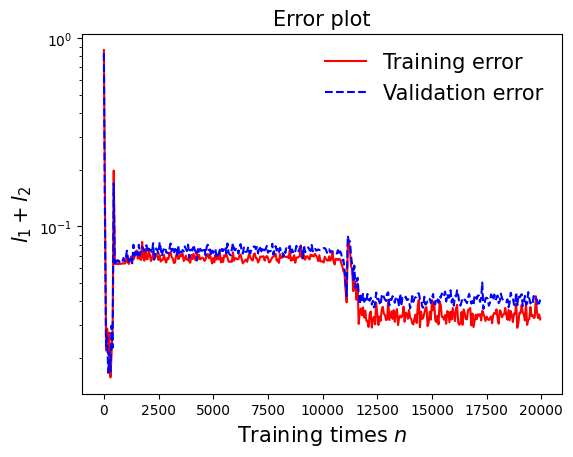

In [66]:
draw_loss(model3)

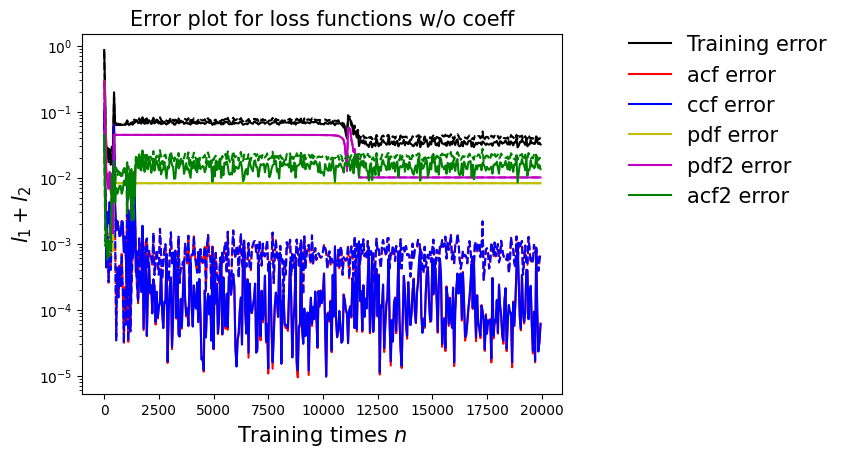

In [67]:
draw_errors(model3)

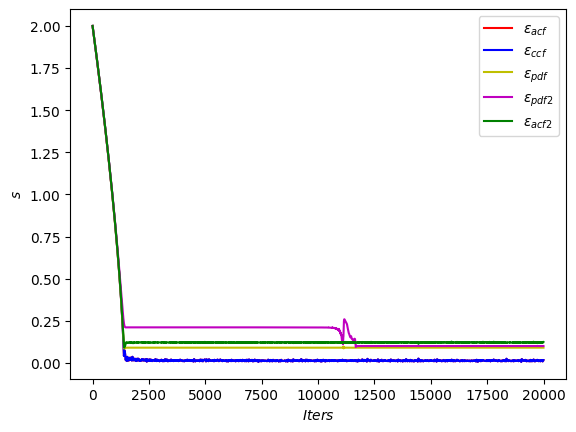

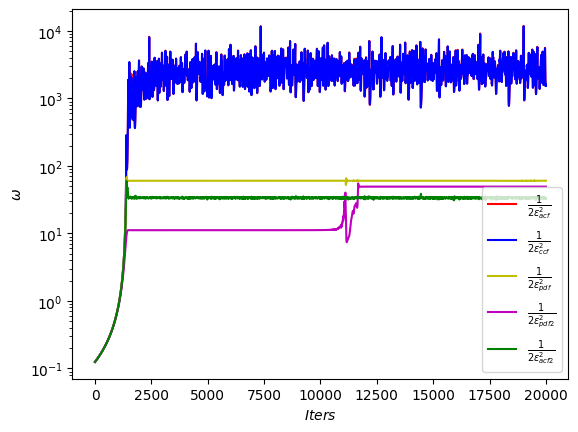

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

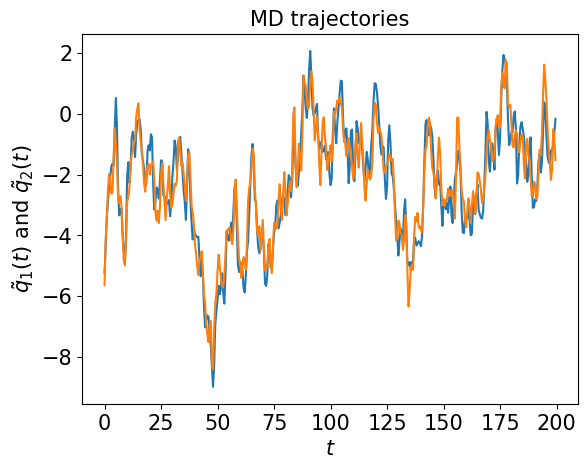

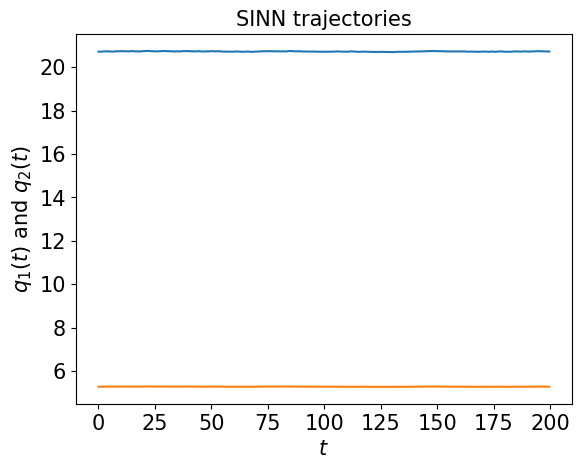

In [69]:
test1(model3)

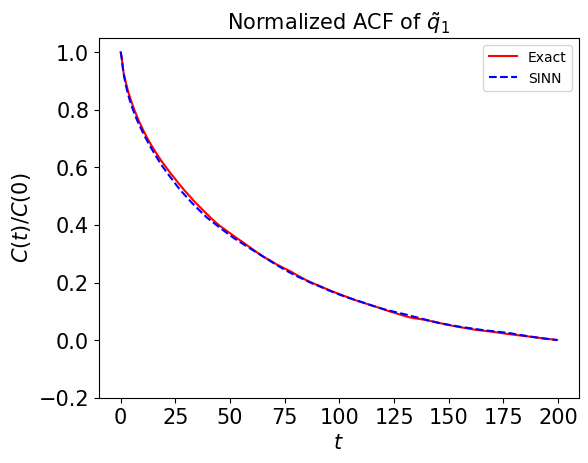

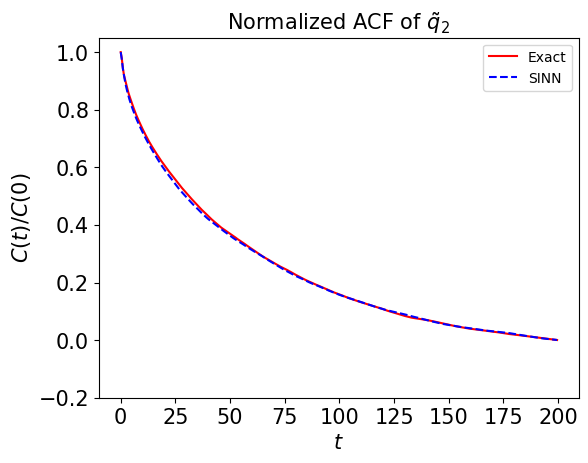

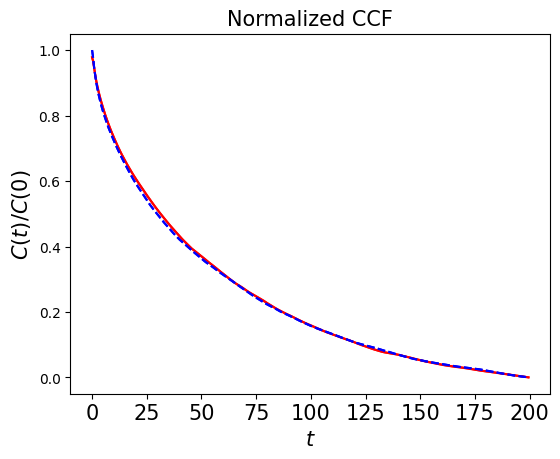

In [70]:
test2(model3)

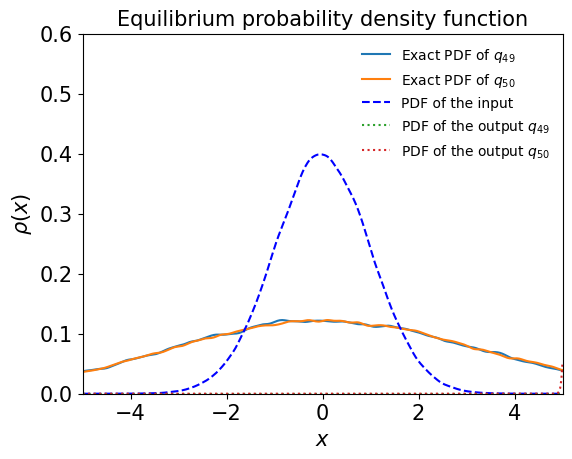

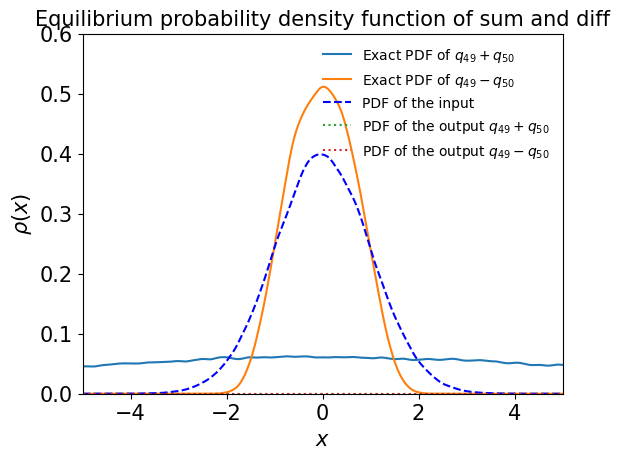

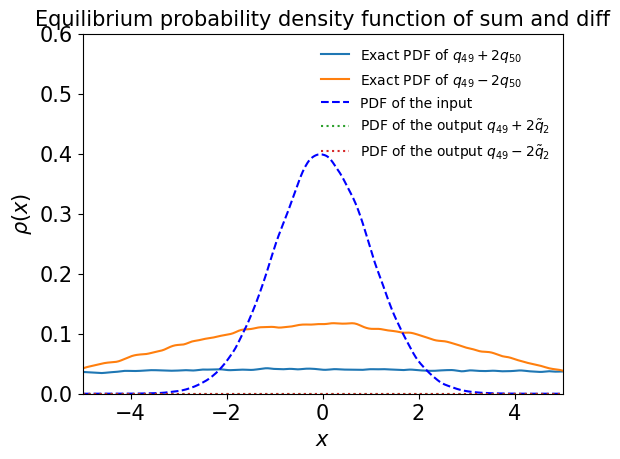

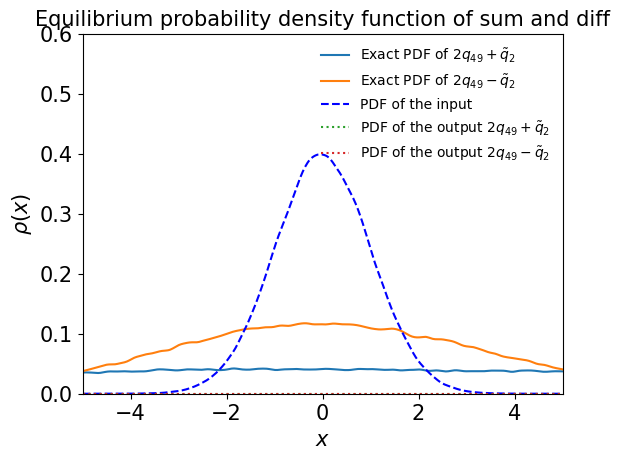

In [71]:
test3(model3)

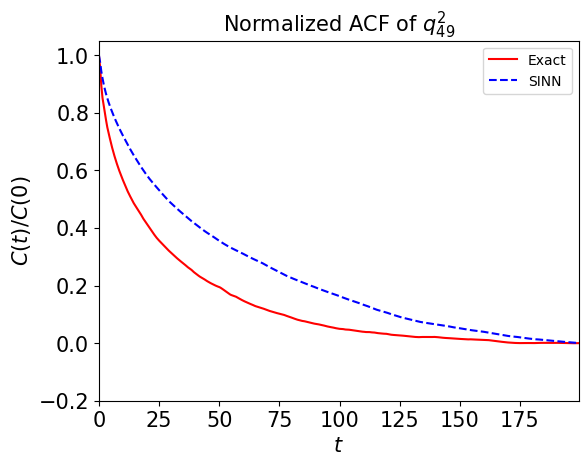

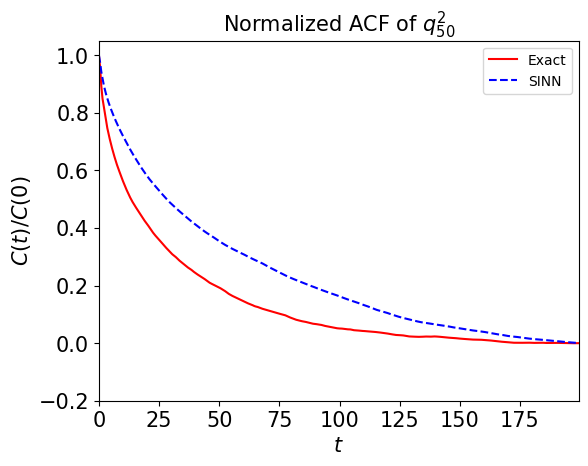

In [72]:
test4(model3)

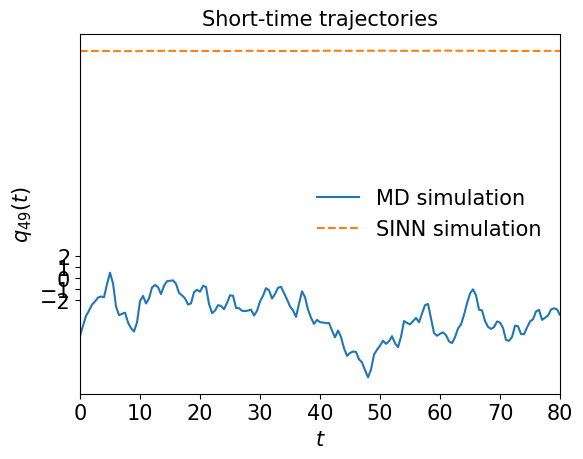

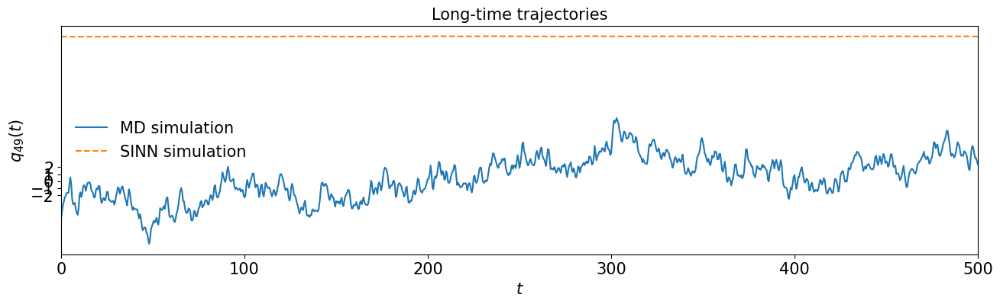

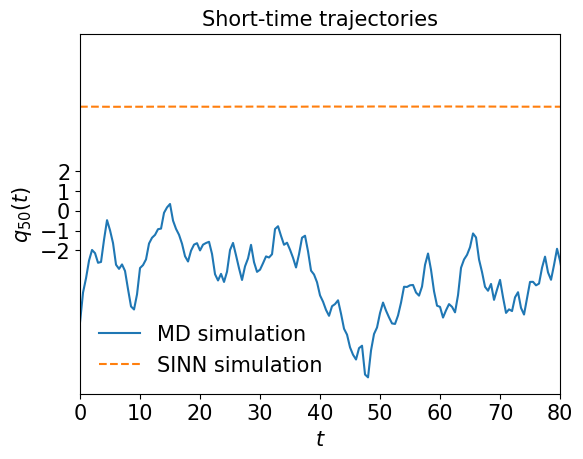

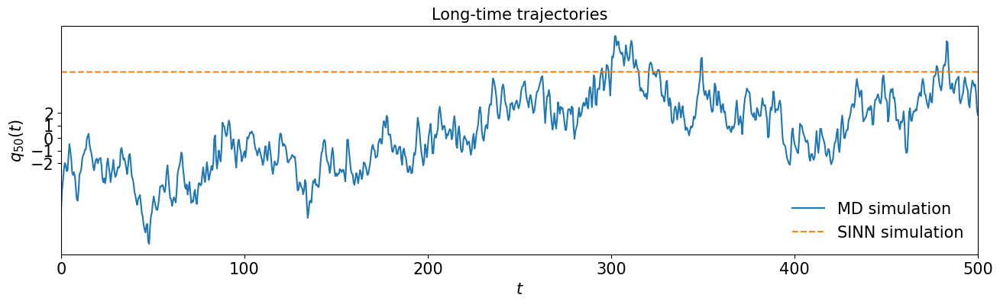

In [73]:
test5(model3)

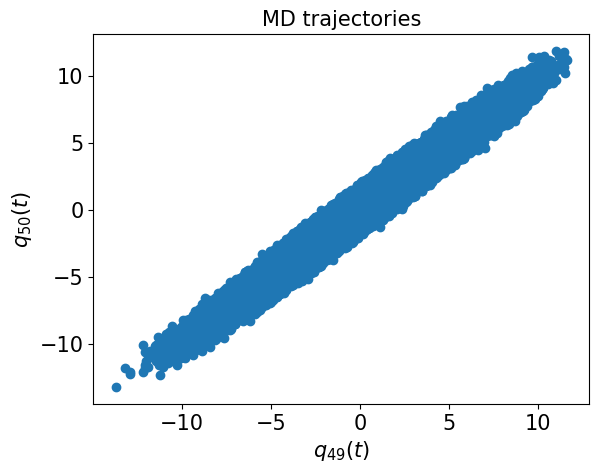

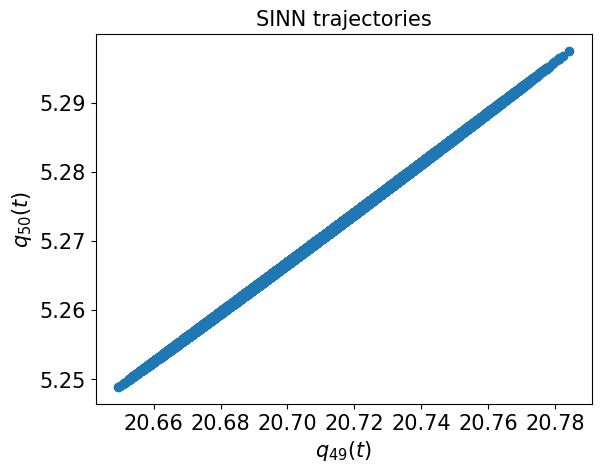

In [74]:
test6(model3)

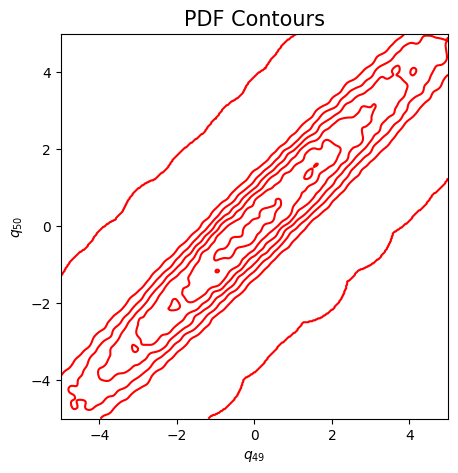

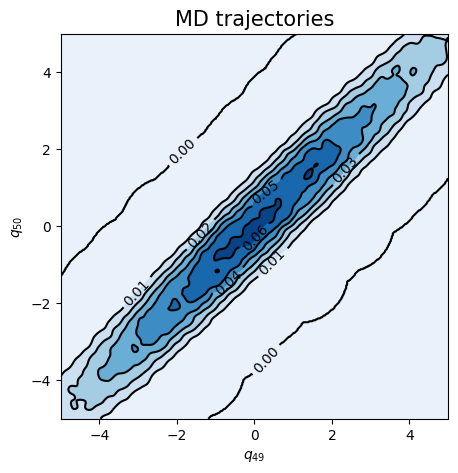

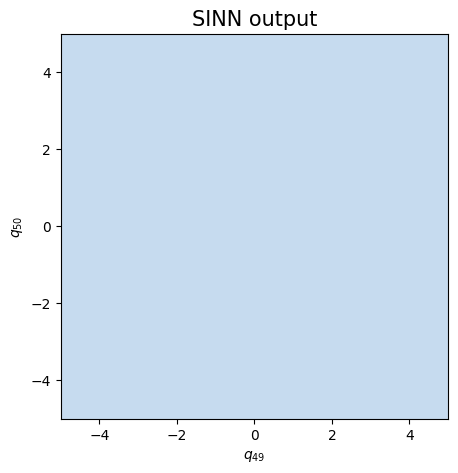

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8562, 0.8236, acf: 0.09893, ccf: 0.09872, pdf: 0.29312, pdf2: 0.29013, acf2: 0.04274
[50]-th step loss: 0.1608, 0.1483, acf: 0.01346, ccf: 0.01344, pdf: 0.07446, pdf2: 0.04348, acf2: 0.00349
[100]-th step loss: 0.0254, 0.0283, acf: 0.00360, ccf: 0.00365, pdf: 0.00990, pdf2: 0.00769, acf2: 0.00342
[150]-th step loss: 0.0185, 0.0220, acf: 0.00335, ccf: 0.00338, pdf: 0.00764, pdf2: 0.00643, acf2: 0.00119
[200]-th step loss: 0.0151, 0.0151, acf: 0.00099, ccf: 0.00102, pdf: 0.00618, pdf2: 0.00628, acf2: 0.00058
[250]-th step loss: 0.0169, 0.0150, acf: 0.00125, ccf: 0.00123, pdf: 0.00586, pdf2: 0.00555, acf2: 0.00108
[300]-th step loss: 0.0098, 0.0159, acf: 0.00331, ccf: 0.00295, pdf: 0.00395, pdf2: 0.00452, acf2: 0.00118
[350]-th step loss: 0.0128, 0.0146, acf: 0.00203, ccf: 0.00089, pdf: 0.00409, pdf2: 0.00336, acf2: 0.00421
[400]-th step loss: 0.0077, 0.0065, acf: 0.00012, ccf: 0.00019, pdf: 0.00198, pdf2: 0.00294, acf2: 0.00131
[450]-th step loss: 0.0060, 0.0085, acf:

[3850]-th step loss: 0.0004, 0.0022, acf: 0.00103, ccf: 0.00104, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00009
[3900]-th step loss: 0.0006, 0.0014, acf: 0.00063, ccf: 0.00063, pdf: 0.00006, pdf2: 0.00002, acf2: 0.00008
[3950]-th step loss: 0.0002, 0.0020, acf: 0.00092, ccf: 0.00093, pdf: 0.00005, pdf2: 0.00002, acf2: 0.00007
[4000]-th step loss: 0.0005, 0.0012, acf: 0.00057, ccf: 0.00057, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00002
[4050]-th step loss: 0.0001, 0.0014, acf: 0.00061, ccf: 0.00062, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00010
[4100]-th step loss: 0.0003, 0.0013, acf: 0.00062, ccf: 0.00062, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00004
[4150]-th step loss: 0.0004, 0.0018, acf: 0.00082, ccf: 0.00083, pdf: 0.00003, pdf2: 0.00001, acf2: 0.00014
[4200]-th step loss: 0.0013, 0.0037, acf: 0.00170, ccf: 0.00171, pdf: 0.00004, pdf2: 0.00002, acf2: 0.00025
[4250]-th step loss: 0.0007, 0.0024, acf: 0.00113, ccf: 0.00114, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00014
[4300]-th step loss: 0.0005,

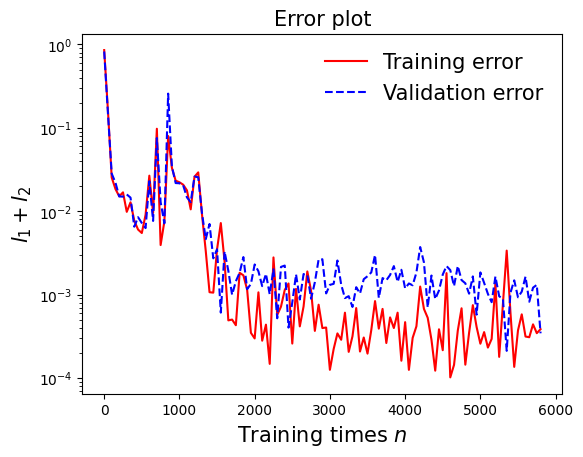

In [77]:
draw_loss(model4)

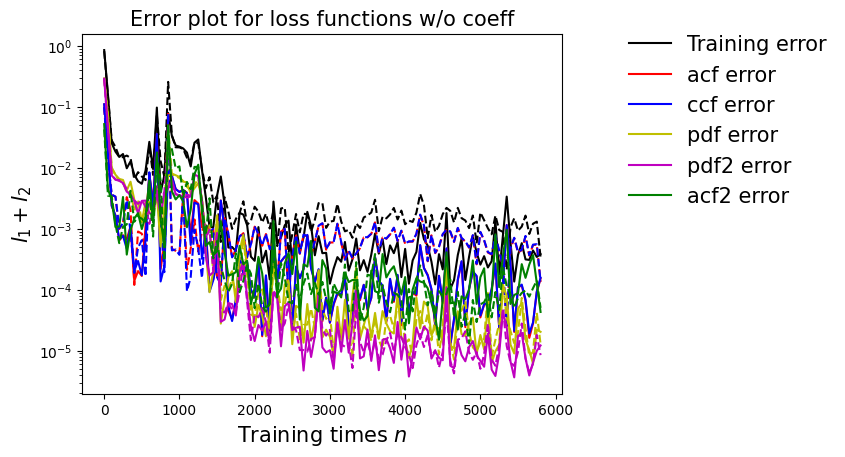

In [78]:
draw_errors(model4)

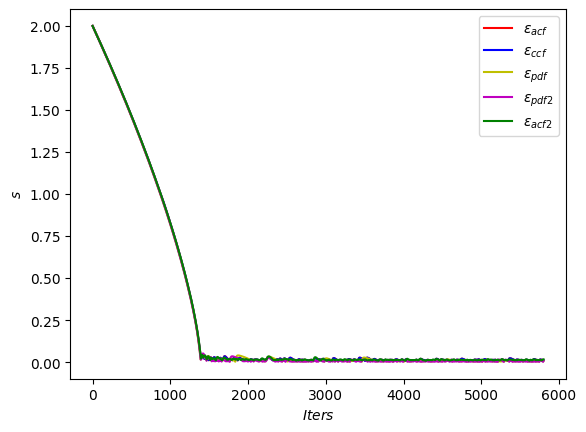

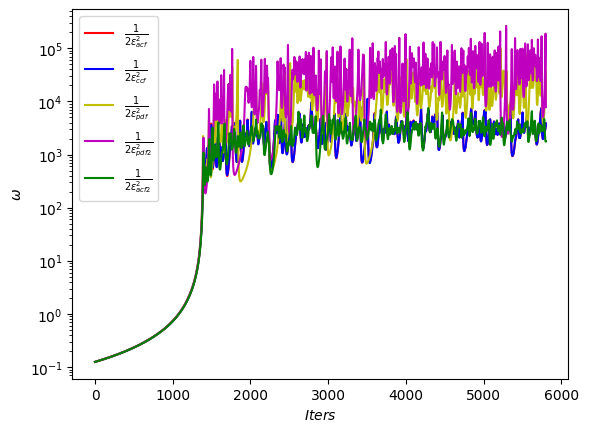

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

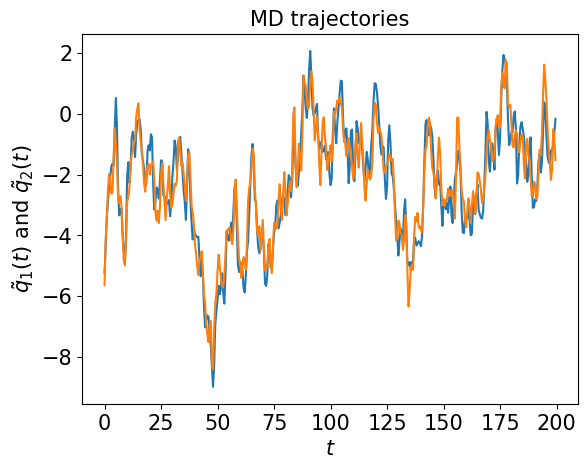

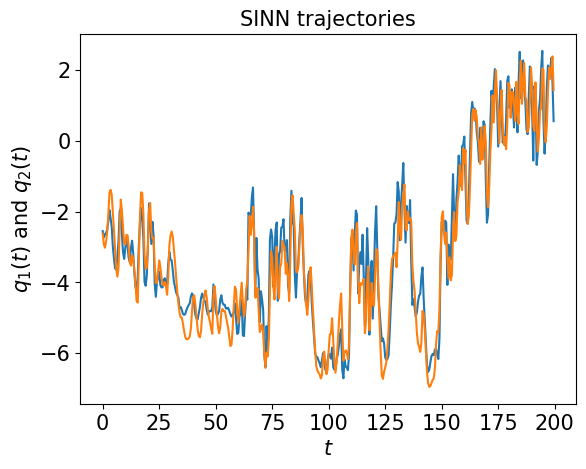

In [80]:
test1(model4)

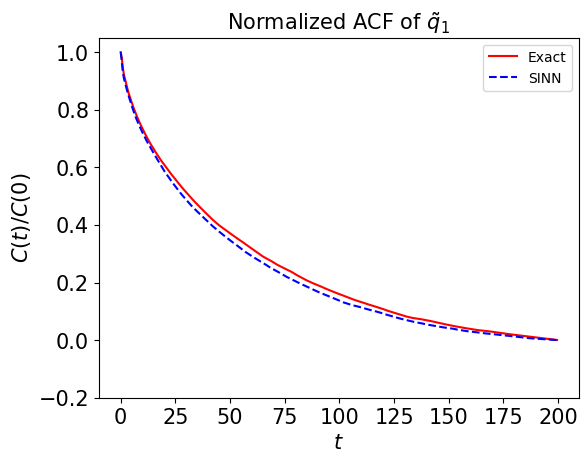

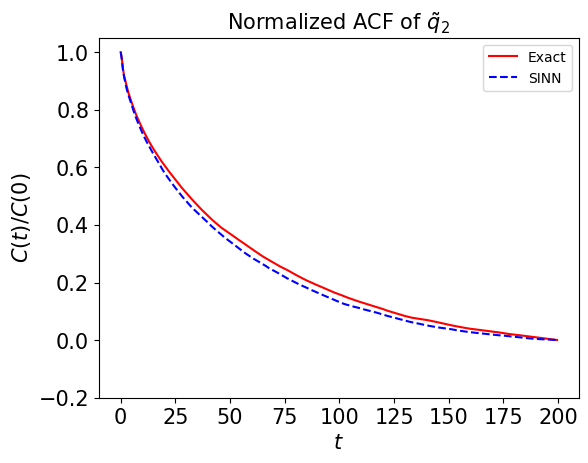

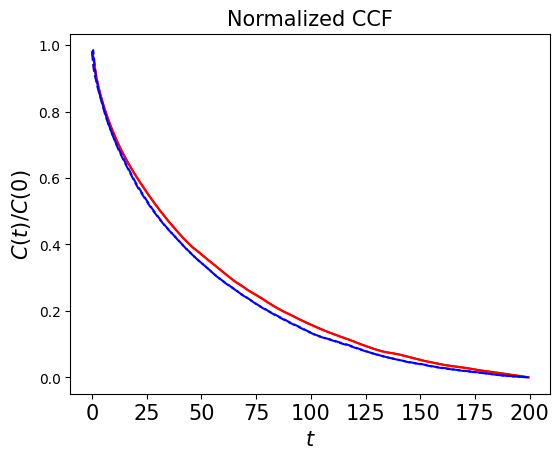

In [81]:
test2(model4)

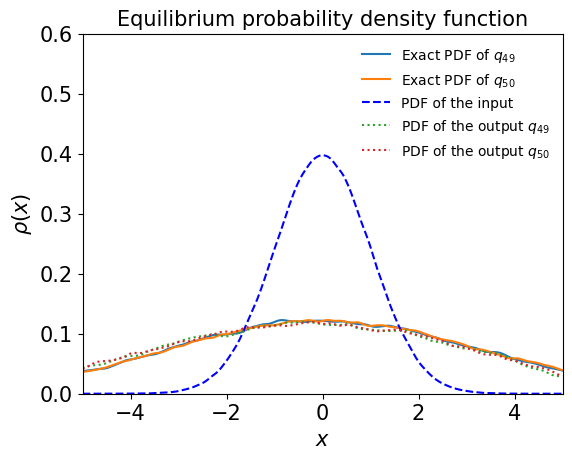

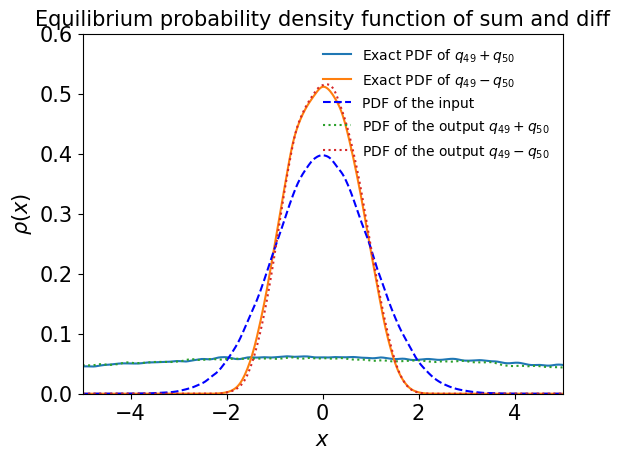

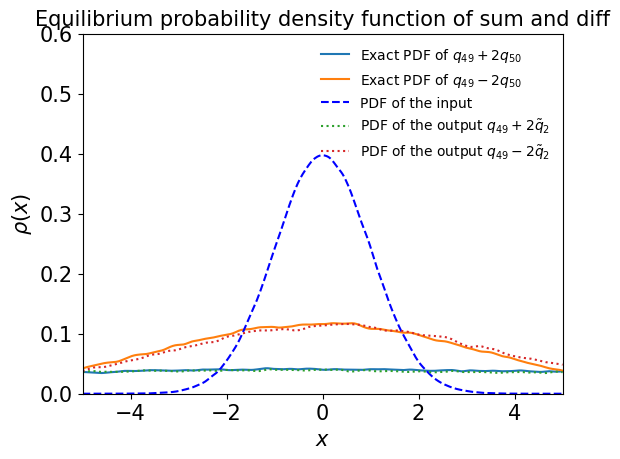

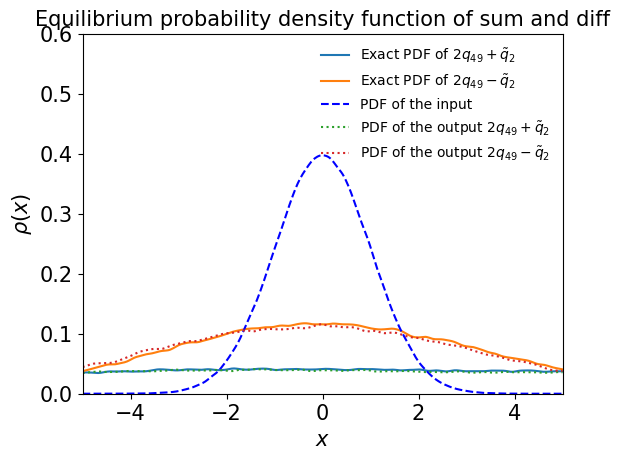

In [82]:
test3(model4)

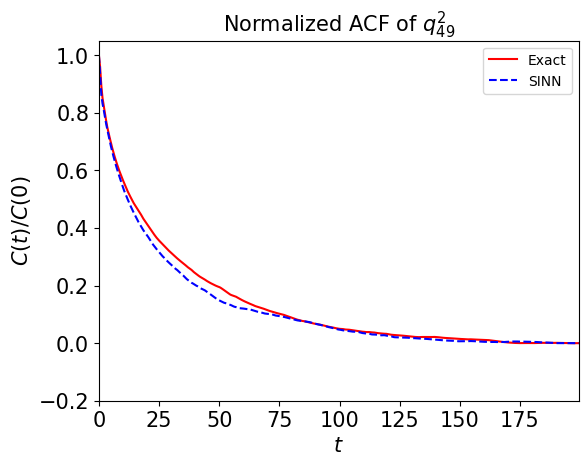

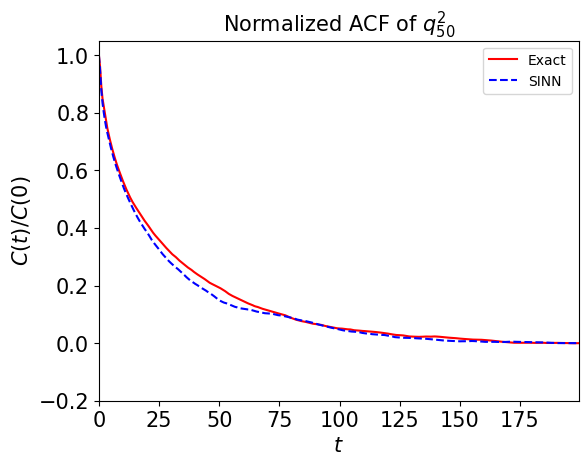

In [83]:
test4(model4)

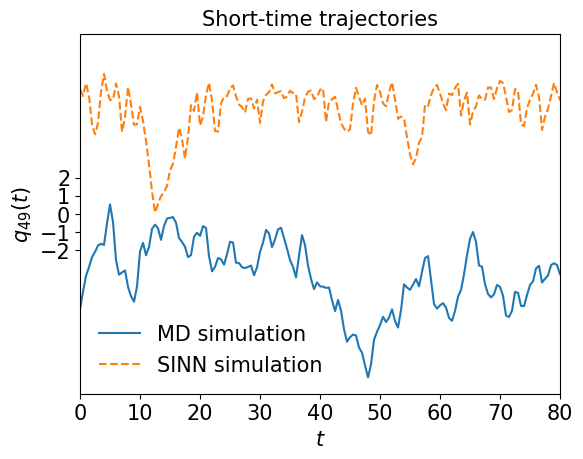

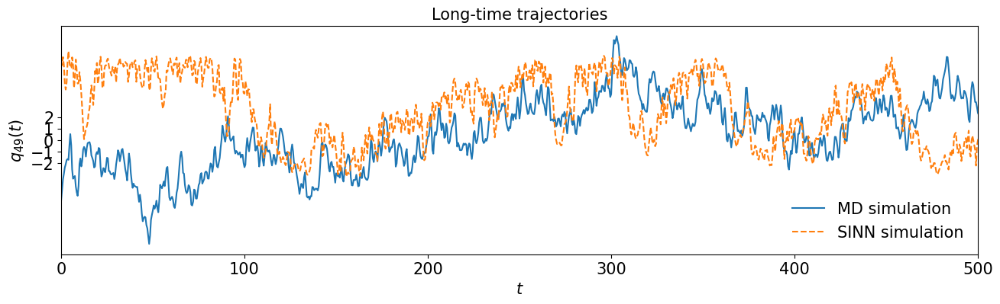

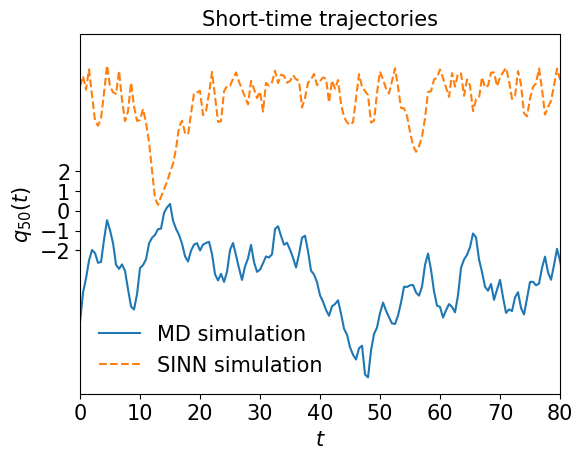

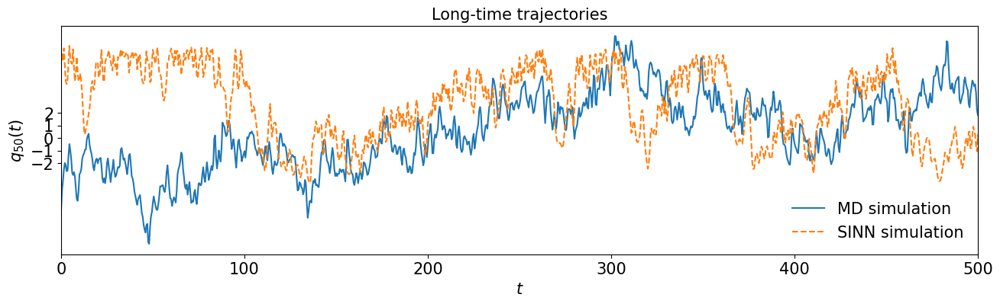

In [84]:
test5(model4)

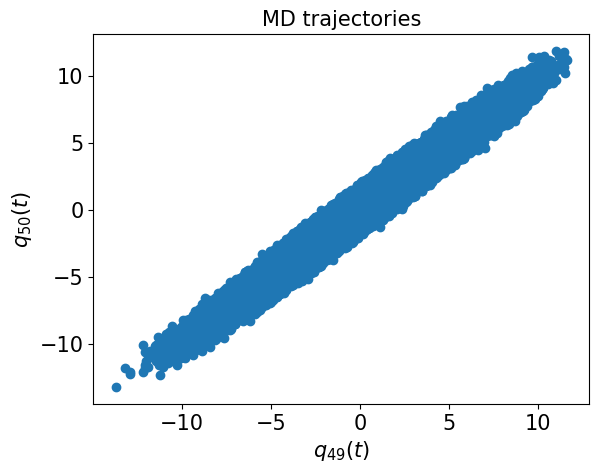

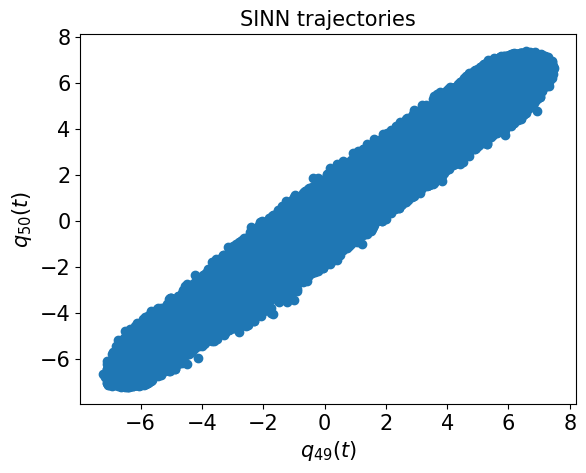

In [85]:
test6(model4)

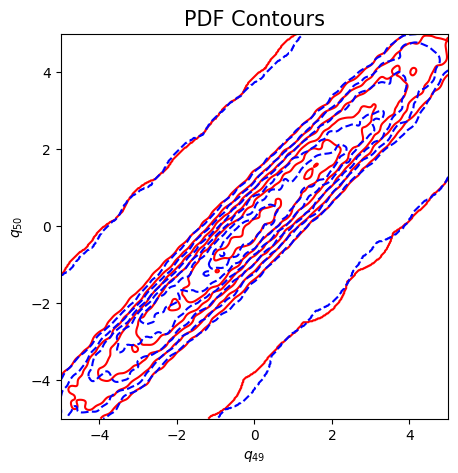

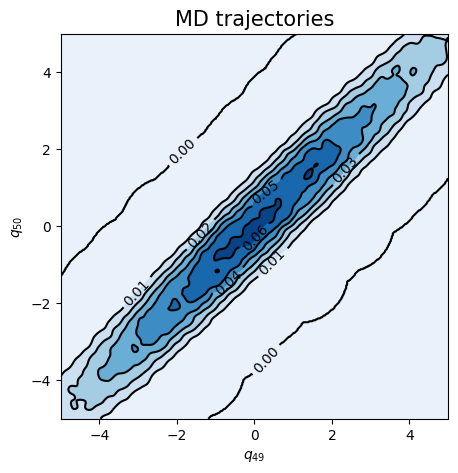

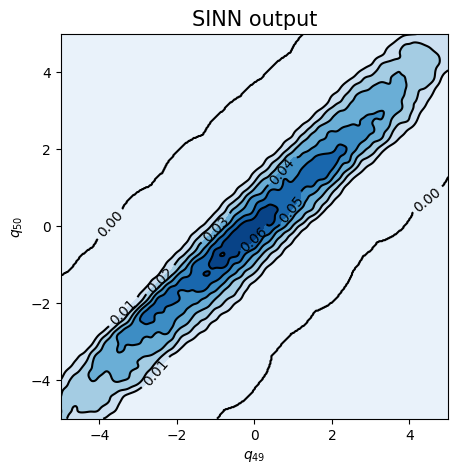

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8692, 0.8241, acf: 0.09901, ccf: 0.09886, pdf: 0.29325, pdf2: 0.29021, acf2: 0.04281
[50]-th step loss: 0.0987, 0.1114, acf: 0.01695, ccf: 0.01698, pdf: 0.04380, pdf2: 0.02921, acf2: 0.00442
[100]-th step loss: 0.1154, 0.1022, acf: 0.02135, ccf: 0.02130, pdf: 0.03610, pdf2: 0.02100, acf2: 0.00246
[150]-th step loss: 0.0631, 0.0506, acf: 0.00311, ccf: 0.00311, pdf: 0.02058, pdf2: 0.01777, acf2: 0.00601
[200]-th step loss: 0.0419, 0.0423, acf: 0.00088, ccf: 0.00089, pdf: 0.01572, pdf2: 0.01308, acf2: 0.01170
[250]-th step loss: 0.0795, 0.0710, acf: 0.00194, ccf: 0.00193, pdf: 0.03136, pdf2: 0.02079, acf2: 0.01504
[300]-th step loss: 0.0418, 0.0427, acf: 0.00066, ccf: 0.00064, pdf: 0.01477, pdf2: 0.01279, acf2: 0.01388
[350]-th step loss: 0.0247, 0.0247, acf: 0.00035, ccf: 0.00021, pdf: 0.00888, pdf2: 0.01020, acf2: 0.00509
[400]-th step loss: 0.0226, 0.0230, acf: 0.00063, ccf: 0.00028, pdf: 0.00698, pdf2: 0.00985, acf2: 0.00530
[450]-th step loss: 0.0201, 0.0201, acf:

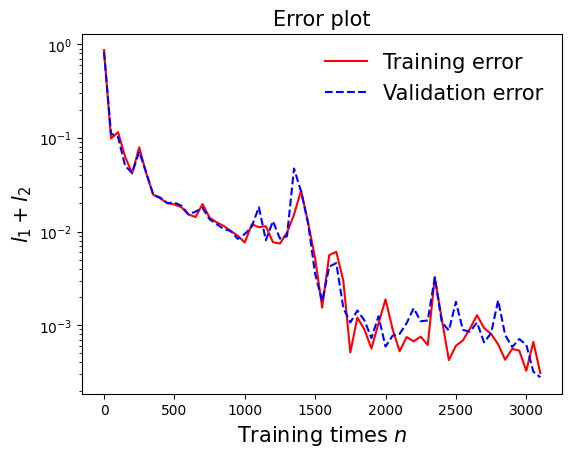

In [88]:
draw_loss(model5)

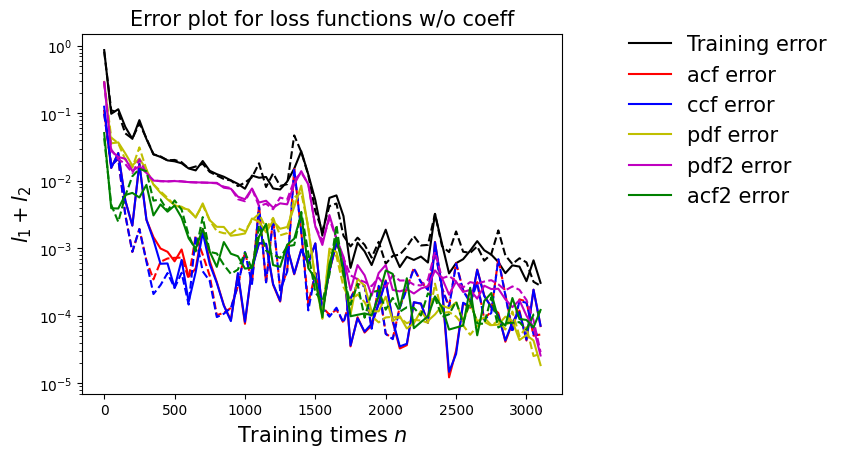

In [89]:
draw_errors(model5)

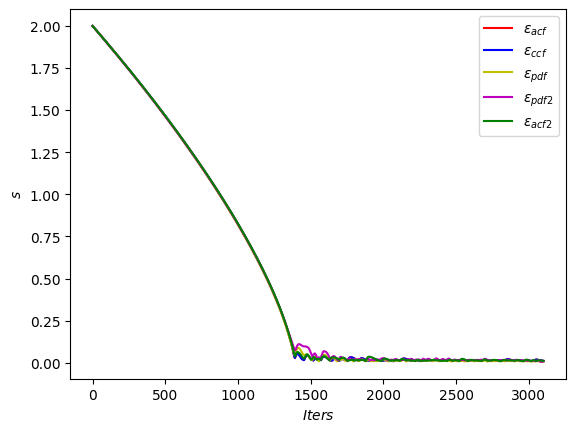

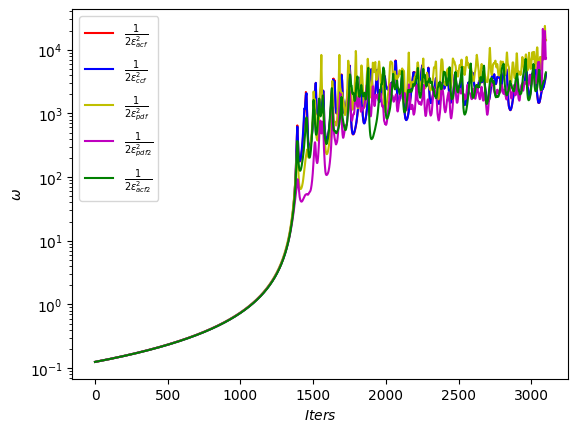

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

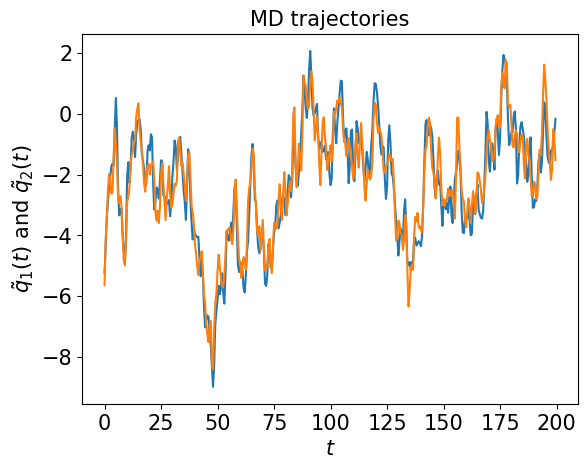

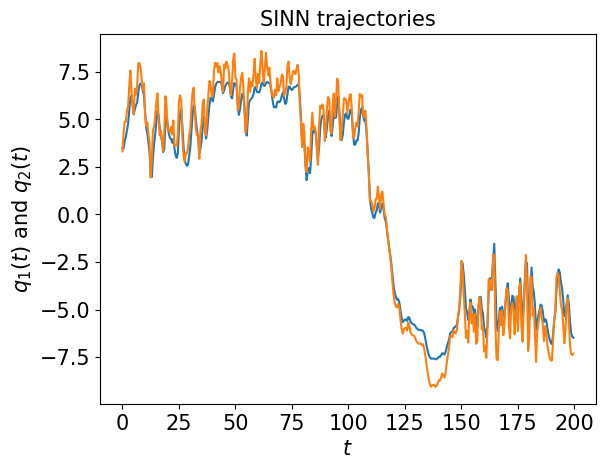

In [91]:
test1(model5)

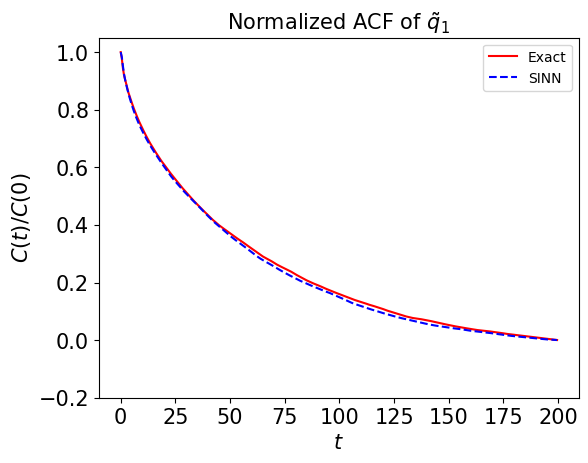

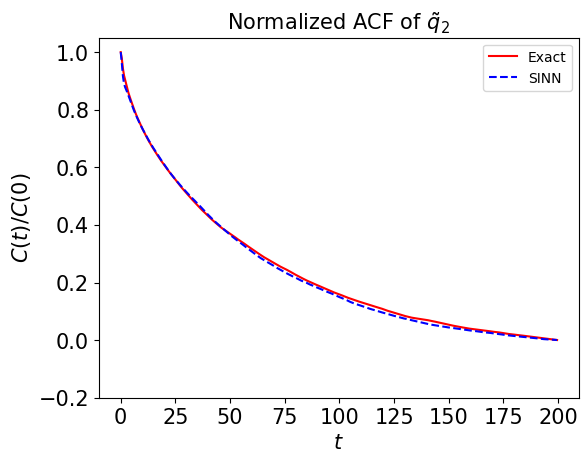

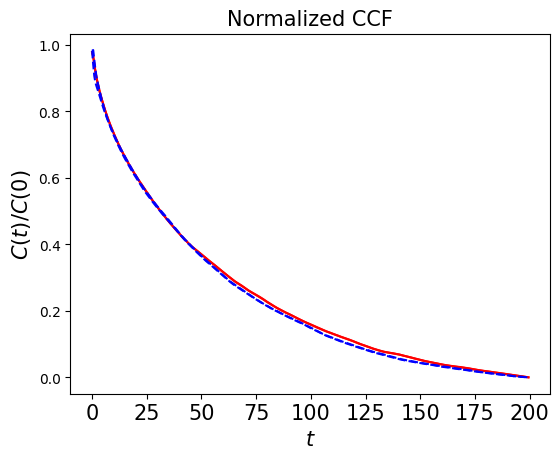

In [92]:
test2(model5)

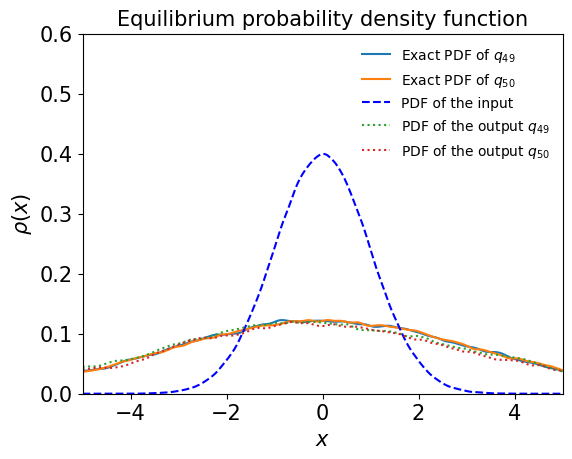

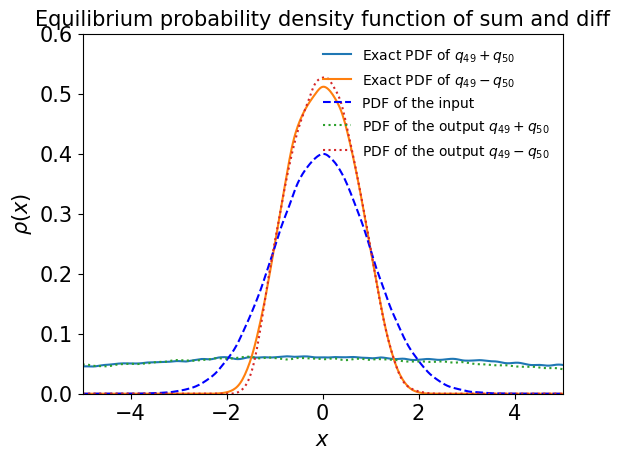

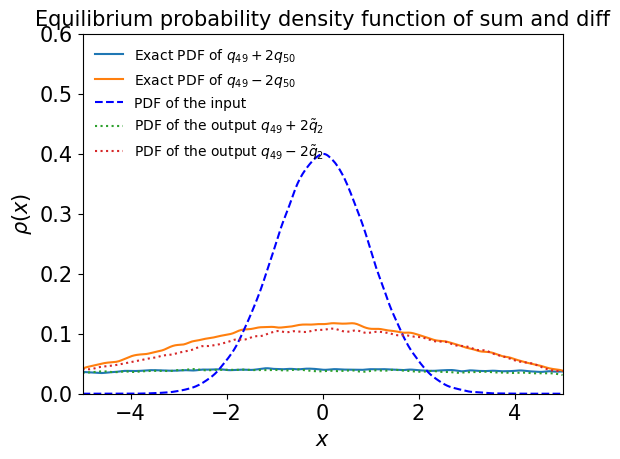

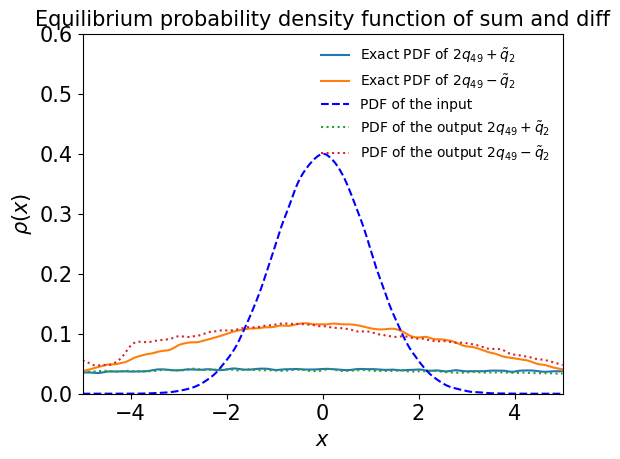

In [93]:
test3(model5)

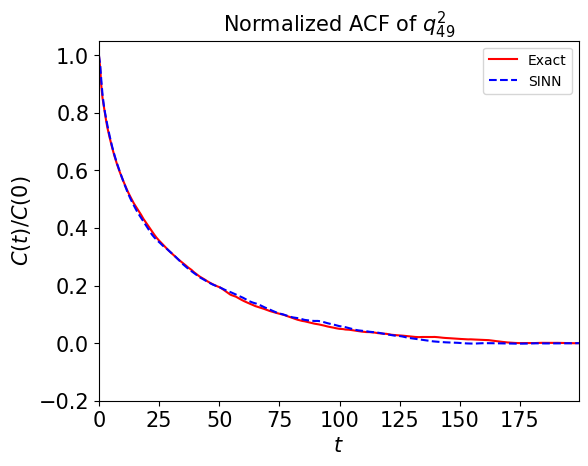

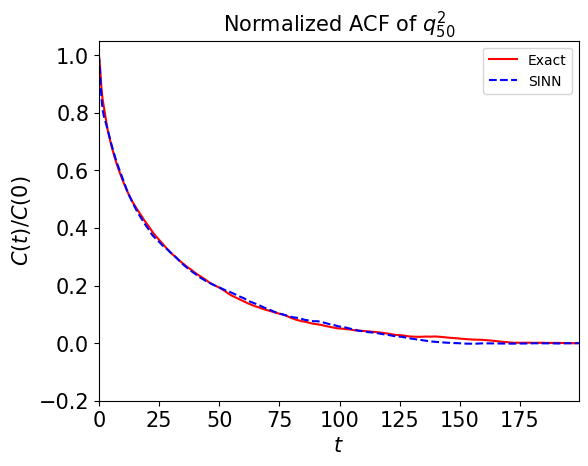

In [94]:
test4(model5)

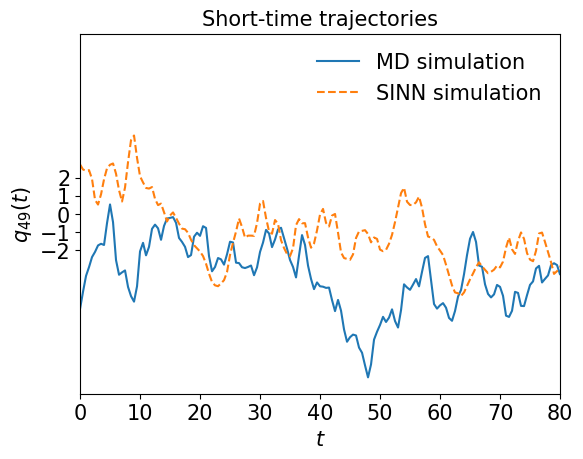

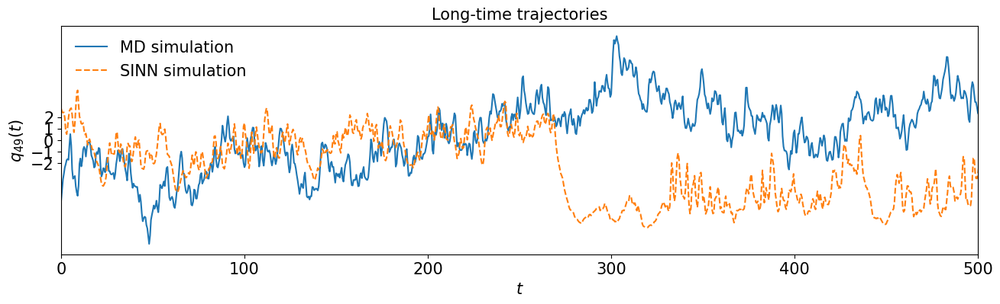

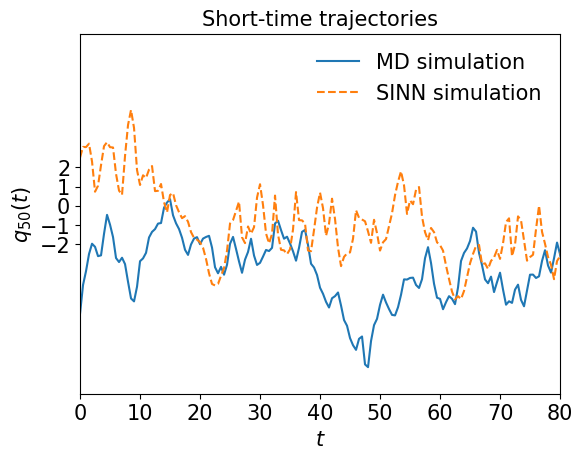

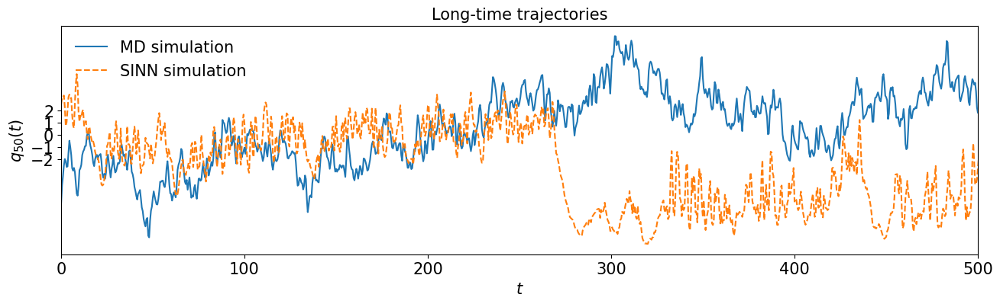

In [95]:
test5(model5)

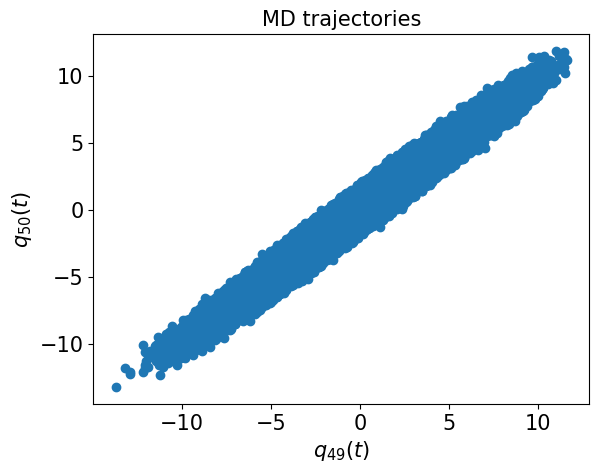

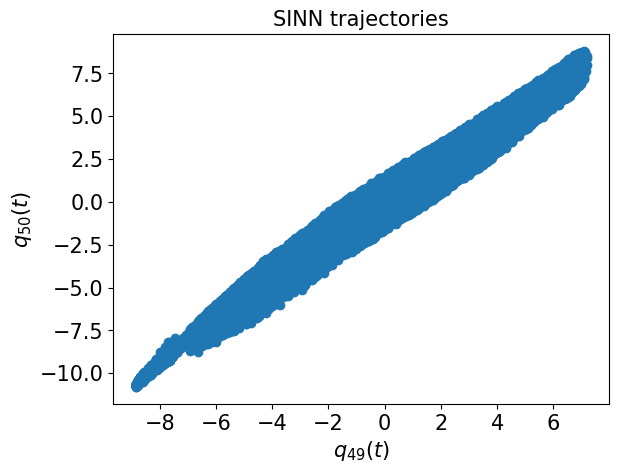

In [96]:
test6(model5)

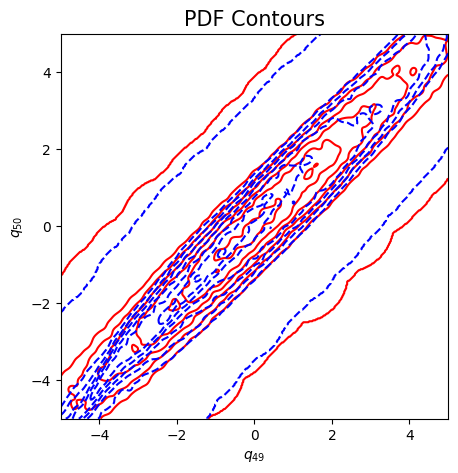

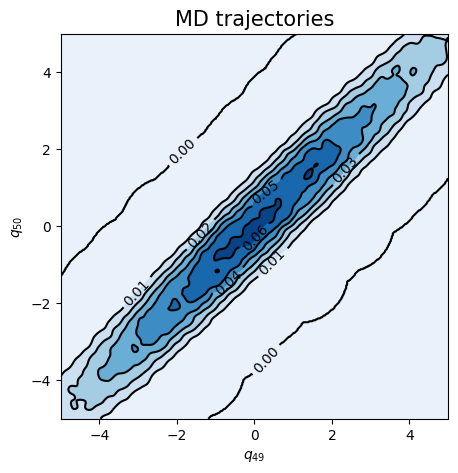

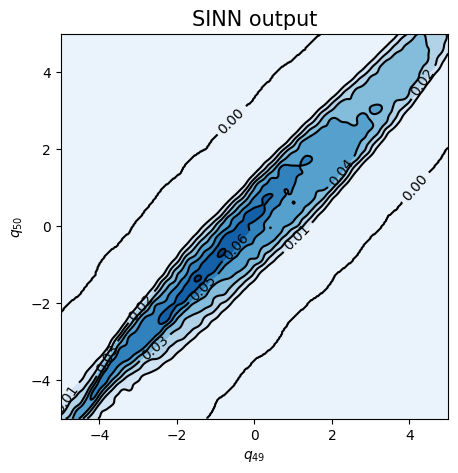

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8283, 0.8146, acf: 0.09572, ccf: 0.09550, pdf: 0.29312, pdf2: 0.29010, acf2: 0.04021
[50]-th step loss: 0.1000, 0.0745, acf: 0.01784, ccf: 0.01781, pdf: 0.01881, pdf2: 0.01697, acf2: 0.00308
[100]-th step loss: 0.0144, 0.0123, acf: 0.00098, ccf: 0.00100, pdf: 0.00465, pdf2: 0.00425, acf2: 0.00138
[150]-th step loss: 0.2992, 0.2954, acf: 0.06931, ccf: 0.06917, pdf: 0.07538, pdf2: 0.05781, acf2: 0.02378
[200]-th step loss: 0.0291, 0.0209, acf: 0.00092, ccf: 0.00093, pdf: 0.00987, pdf2: 0.00821, acf2: 0.00099
[250]-th step loss: 0.0162, 0.0213, acf: 0.00539, ccf: 0.00536, pdf: 0.00139, pdf2: 0.00288, acf2: 0.00627
[300]-th step loss: 0.0080, 0.0166, acf: 0.00155, ccf: 0.00158, pdf: 0.00201, pdf2: 0.00338, acf2: 0.00804
[350]-th step loss: 0.0032, 0.0041, acf: 0.00078, ccf: 0.00081, pdf: 0.00061, pdf2: 0.00083, acf2: 0.00105
[400]-th step loss: 0.0038, 0.0028, acf: 0.00028, ccf: 0.00030, pdf: 0.00031, pdf2: 0.00077, acf2: 0.00114
[450]-th step loss: 0.0051, 0.0061, acf:

[3850]-th step loss: 0.0707, 0.0711, acf: 0.00027, ccf: 0.00026, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01755
[3900]-th step loss: 0.0686, 0.0661, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04492, acf2: 0.01258
[3950]-th step loss: 0.0619, 0.0644, acf: 0.01435, ccf: 0.01425, pdf: 0.00807, pdf2: 0.01661, acf2: 0.01113
[4000]-th step loss: 0.0443, 0.0417, acf: 0.00781, ccf: 0.00796, pdf: 0.00562, pdf2: 0.01655, acf2: 0.00377
[4050]-th step loss: 0.0200, 0.0215, acf: 0.00253, ccf: 0.00253, pdf: 0.00559, pdf2: 0.00934, acf2: 0.00152
[4100]-th step loss: 0.0589, 0.0574, acf: 0.01388, ccf: 0.01353, pdf: 0.00405, pdf2: 0.01483, acf2: 0.01107
[4150]-th step loss: 0.0546, 0.0553, acf: 0.01373, ccf: 0.01346, pdf: 0.00369, pdf2: 0.01414, acf2: 0.01030
[4200]-th step loss: 0.0556, 0.0539, acf: 0.01370, ccf: 0.01342, pdf: 0.00335, pdf2: 0.01384, acf2: 0.00961
[4250]-th step loss: 0.0553, 0.0522, acf: 0.01344, ccf: 0.01313, pdf: 0.00327, pdf2: 0.01364, acf2: 0.00869
[4300]-th step loss: 0.1082,

[7650]-th step loss: 0.0554, 0.0553, acf: 0.01339, ccf: 0.01324, pdf: 0.00693, pdf2: 0.00322, acf2: 0.01853
[7700]-th step loss: 0.0550, 0.0551, acf: 0.01330, ccf: 0.01316, pdf: 0.00691, pdf2: 0.00321, acf2: 0.01850
[7750]-th step loss: 0.0553, 0.0553, acf: 0.01346, ccf: 0.01332, pdf: 0.00676, pdf2: 0.00314, acf2: 0.01862
[7800]-th step loss: 0.0548, 0.0549, acf: 0.01328, ccf: 0.01315, pdf: 0.00676, pdf2: 0.00311, acf2: 0.01860
[7850]-th step loss: 0.0550, 0.0547, acf: 0.01320, ccf: 0.01307, pdf: 0.00674, pdf2: 0.00309, acf2: 0.01860
[7900]-th step loss: 0.0545, 0.0544, acf: 0.01309, ccf: 0.01296, pdf: 0.00674, pdf2: 0.00307, acf2: 0.01855
[7950]-th step loss: 0.0543, 0.0541, acf: 0.01293, ccf: 0.01279, pdf: 0.00673, pdf2: 0.00305, acf2: 0.01860
[8000]-th step loss: 0.0539, 0.0536, acf: 0.01273, ccf: 0.01260, pdf: 0.00671, pdf2: 0.00304, acf2: 0.01856
[8050]-th step loss: 0.0531, 0.0530, acf: 0.01247, ccf: 0.01234, pdf: 0.00669, pdf2: 0.00302, acf2: 0.01849
[8100]-th step loss: 0.0516,

[11450]-th step loss: 0.0464, 0.0466, acf: 0.01506, ccf: 0.01200, pdf: 0.00017, pdf2: 0.00031, acf2: 0.01904
[11500]-th step loss: 0.0488, 0.0501, acf: 0.01653, ccf: 0.01356, pdf: 0.00007, pdf2: 0.00019, acf2: 0.01980
[11550]-th step loss: 0.0483, 0.0491, acf: 0.01570, ccf: 0.01320, pdf: 0.00004, pdf2: 0.00010, acf2: 0.02008
[11600]-th step loss: 0.0432, 0.0433, acf: 0.01409, ccf: 0.01210, pdf: 0.00008, pdf2: 0.00020, acf2: 0.01686
[11650]-th step loss: 0.0445, 0.0440, acf: 0.01345, ccf: 0.01230, pdf: 0.00016, pdf2: 0.00010, acf2: 0.01800
[11700]-th step loss: 0.0406, 0.0405, acf: 0.01262, ccf: 0.01201, pdf: 0.00003, pdf2: 0.00002, acf2: 0.01584
[11750]-th step loss: 0.0358, 0.0363, acf: 0.01167, ccf: 0.01119, pdf: 0.00002, pdf2: 0.00002, acf2: 0.01345
[11800]-th step loss: 0.0311, 0.0297, acf: 0.00972, ccf: 0.00954, pdf: 0.00002, pdf2: 0.00003, acf2: 0.01041
[11850]-th step loss: 0.0196, 0.0170, acf: 0.00634, ccf: 0.00616, pdf: 0.00002, pdf2: 0.00003, acf2: 0.00442
[11900]-th step los

[15250]-th step loss: 0.0079, 0.0045, acf: 0.00079, ccf: 0.00075, pdf: 0.00003, pdf2: 0.00001, acf2: 0.00289
[15300]-th step loss: 0.0044, 0.0043, acf: 0.00069, ccf: 0.00067, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00297
[15350]-th step loss: 0.0053, 0.0058, acf: 0.00021, ccf: 0.00020, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00538
[15400]-th step loss: 0.0051, 0.0048, acf: 0.00047, ccf: 0.00045, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00386
[15450]-th step loss: 0.0054, 0.0044, acf: 0.00056, ccf: 0.00054, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00325
[15500]-th step loss: 0.0069, 0.0047, acf: 0.00024, ccf: 0.00022, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00418
[15550]-th step loss: 0.0041, 0.0042, acf: 0.00022, ccf: 0.00020, pdf: 0.00000, pdf2: 0.00001, acf2: 0.00376
[15600]-th step loss: 0.0049, 0.0039, acf: 0.00040, ccf: 0.00037, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00312
[15650]-th step loss: 0.0041, 0.0041, acf: 0.00065, ccf: 0.00062, pdf: 0.00003, pdf2: 0.00001, acf2: 0.00277
[15700]-th step los

[19050]-th step loss: 0.0038, 0.0026, acf: 0.00029, ccf: 0.00027, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00203
[19100]-th step loss: 0.0031, 0.0023, acf: 0.00023, ccf: 0.00022, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00189
[19150]-th step loss: 0.0026, 0.0025, acf: 0.00022, ccf: 0.00020, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00211
[19200]-th step loss: 0.0030, 0.0023, acf: 0.00024, ccf: 0.00022, pdf: 0.00000, pdf2: 0.00000, acf2: 0.00184
[19250]-th step loss: 0.0040, 0.0030, acf: 0.00037, ccf: 0.00035, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00229
[19300]-th step loss: 0.0028, 0.0024, acf: 0.00029, ccf: 0.00028, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00177
[19350]-th step loss: 0.0024, 0.0022, acf: 0.00019, ccf: 0.00018, pdf: 0.00002, pdf2: 0.00001, acf2: 0.00182
[19400]-th step loss: 0.0033, 0.0022, acf: 0.00020, ccf: 0.00018, pdf: 0.00001, pdf2: 0.00001, acf2: 0.00176
[19450]-th step loss: 0.0036, 0.0023, acf: 0.00015, ccf: 0.00014, pdf: 0.00001, pdf2: 0.00000, acf2: 0.00200
[19500]-th step los

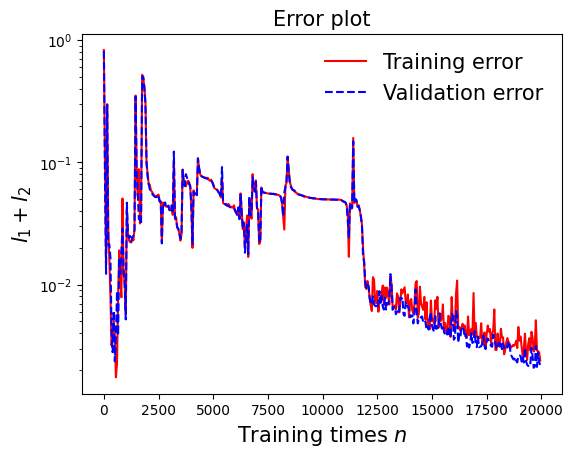

In [99]:
draw_loss(model6)

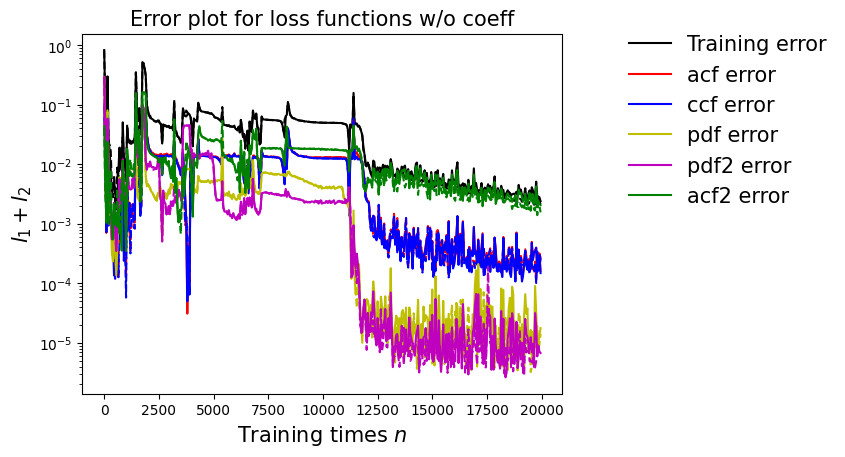

In [100]:
draw_errors(model6)

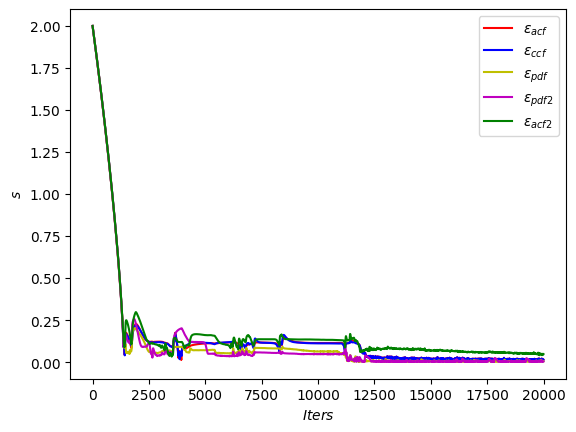

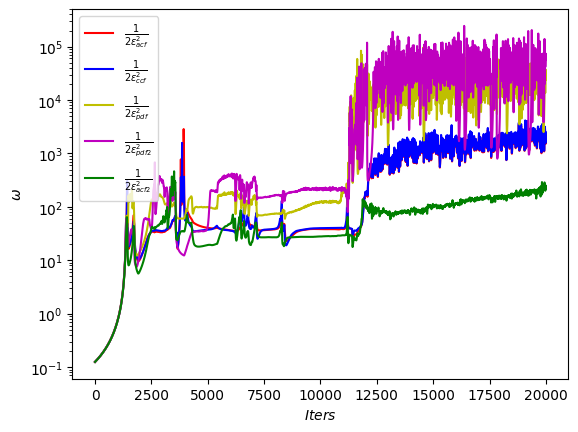

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

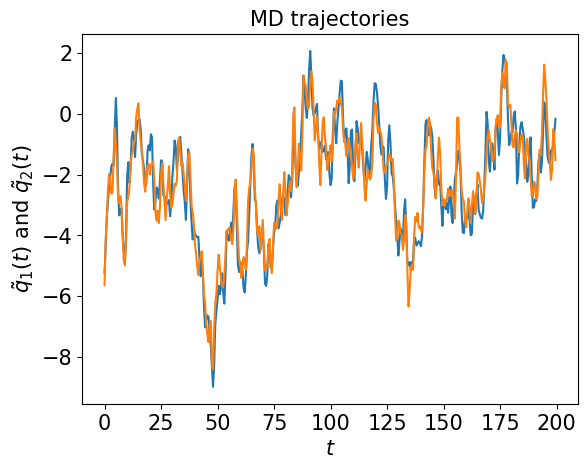

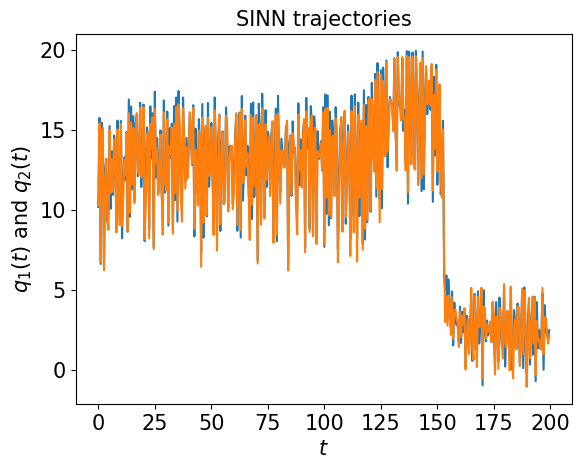

In [102]:
test1(model6)

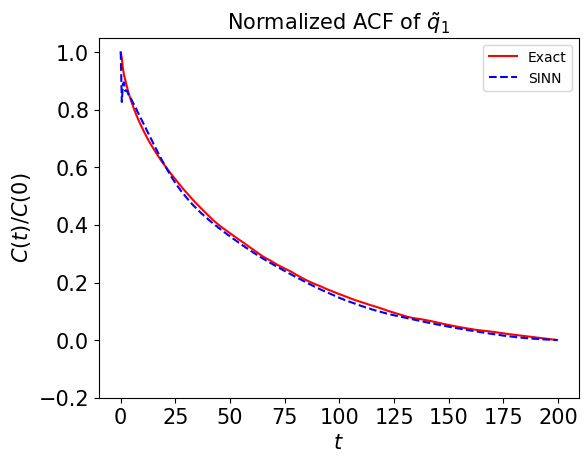

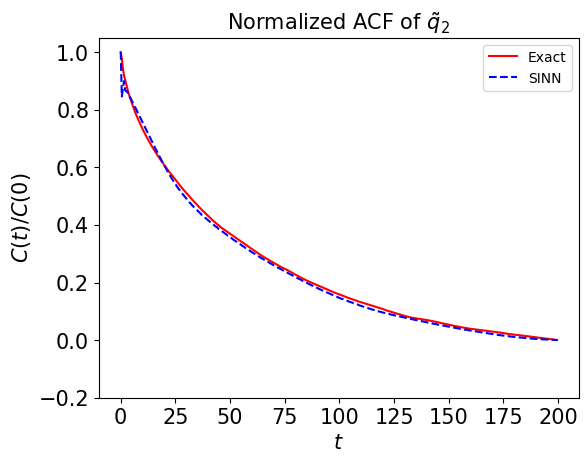

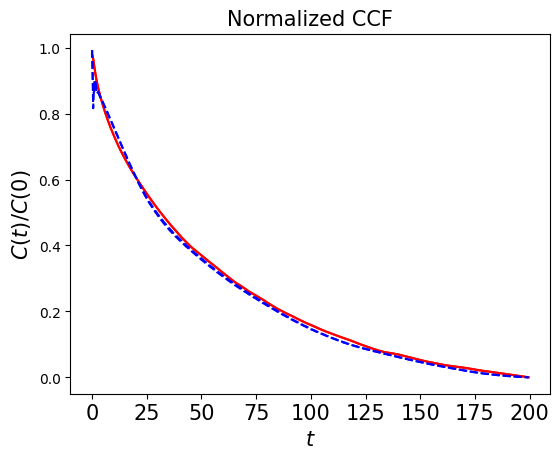

In [103]:
test2(model6)

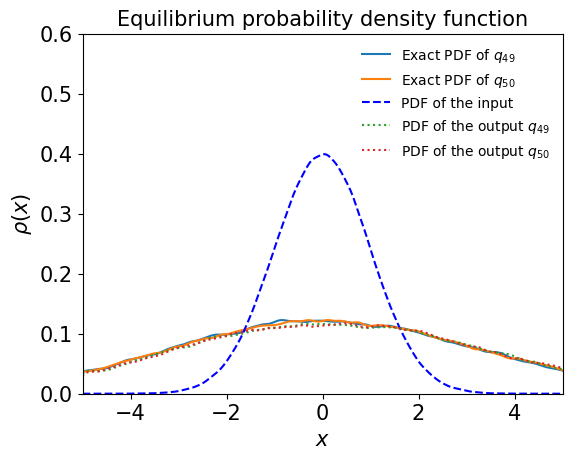

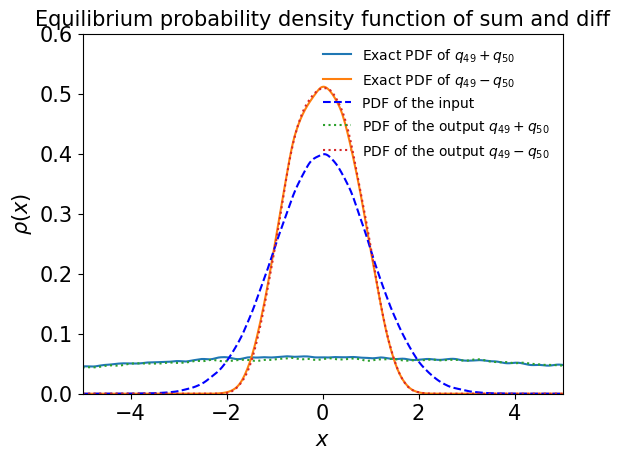

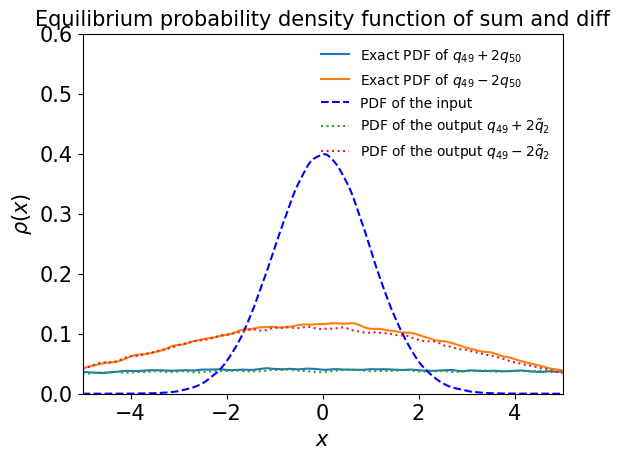

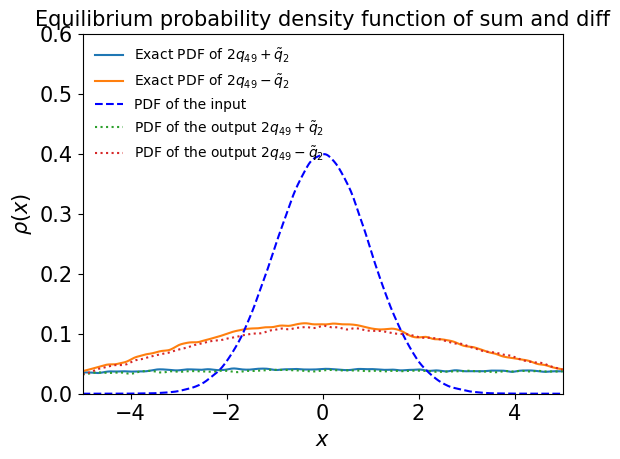

In [104]:
test3(model6)

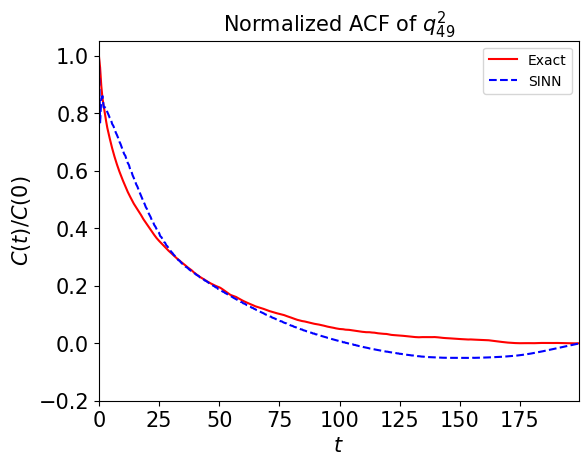

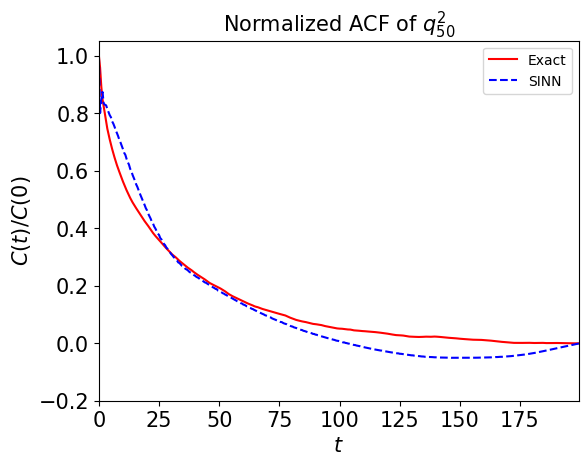

In [105]:
test4(model6)

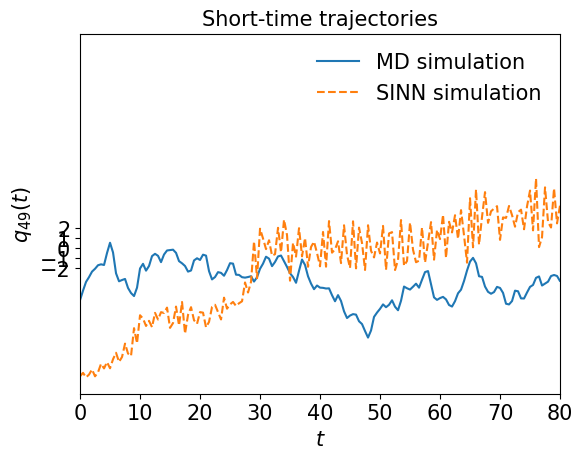

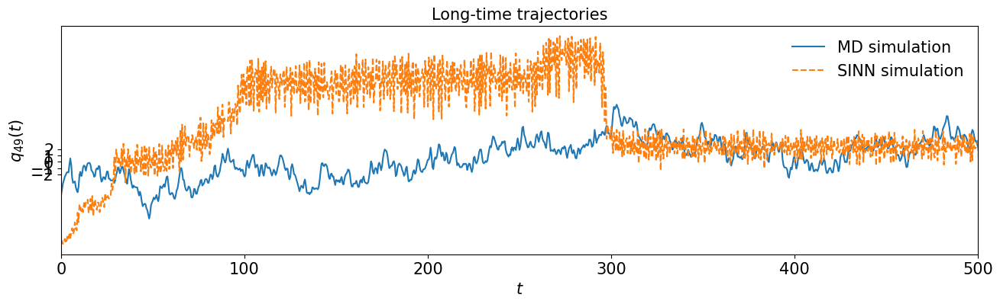

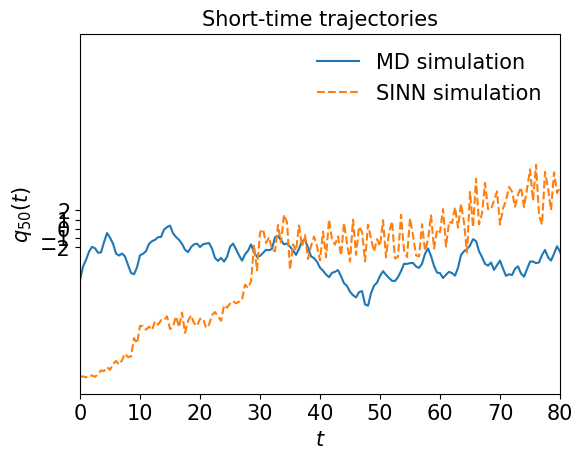

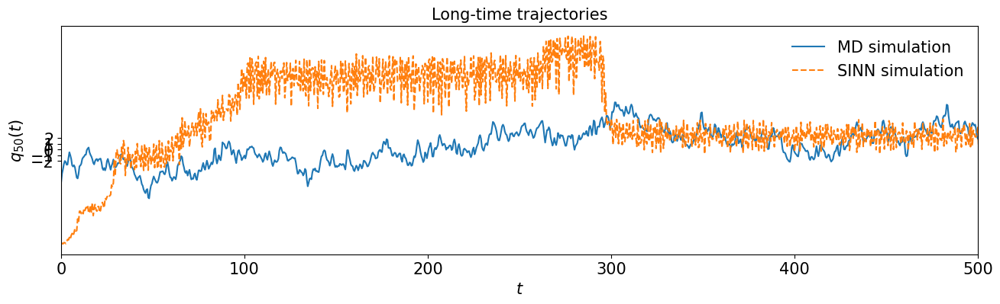

In [106]:
test5(model6)

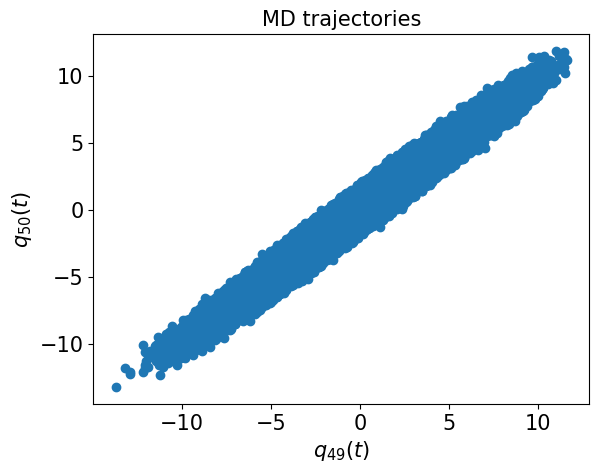

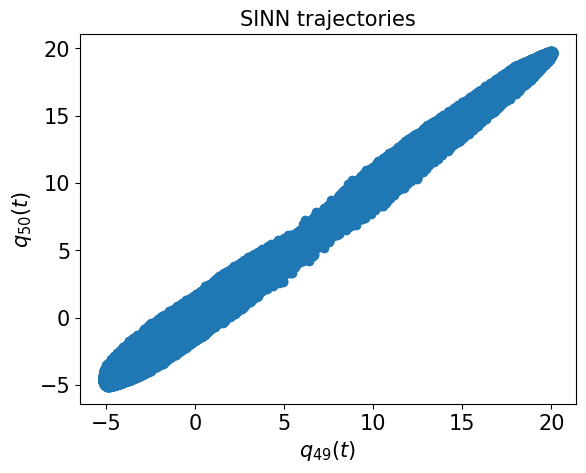

In [107]:
test6(model6)

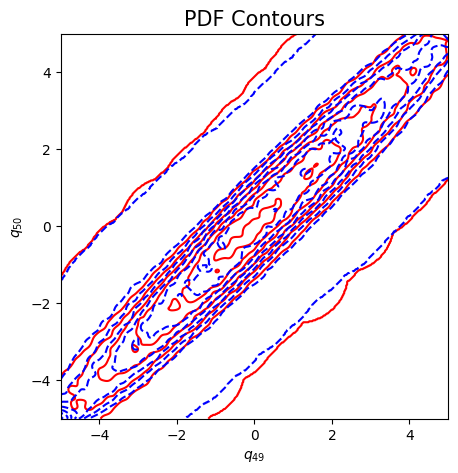

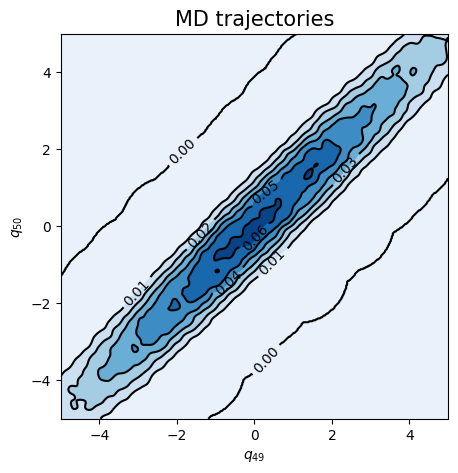

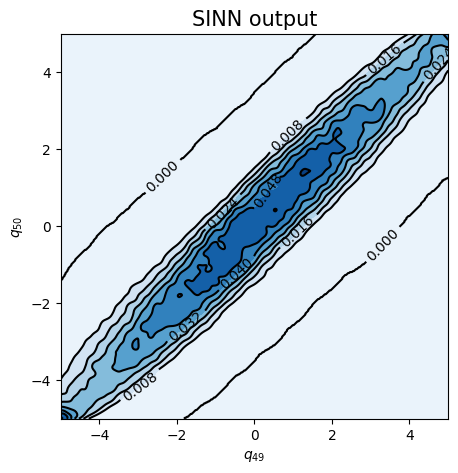

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8382, 0.8239, acf: 0.09897, ccf: 0.09912, pdf: 0.29320, pdf2: 0.28984, acf2: 0.04278
[50]-th step loss: 0.1318, 0.1146, acf: 0.01819, ccf: 0.01814, pdf: 0.03633, pdf2: 0.03713, acf2: 0.00483
[100]-th step loss: 0.0808, 0.0740, acf: 0.01679, ccf: 0.01109, pdf: 0.01886, pdf2: 0.02269, acf2: 0.00455
[150]-th step loss: 0.0155, 0.0168, acf: 0.00179, ccf: 0.00173, pdf: 0.00522, pdf2: 0.00386, acf2: 0.00419
[200]-th step loss: 0.0109, 0.0096, acf: 0.00098, ccf: 0.00095, pdf: 0.00365, pdf2: 0.00252, acf2: 0.00153
[250]-th step loss: 0.0094, 0.0093, acf: 0.00201, ccf: 0.00198, pdf: 0.00249, pdf2: 0.00175, acf2: 0.00109
[300]-th step loss: 0.0414, 0.0584, acf: 0.00361, ccf: 0.00347, pdf: 0.01902, pdf2: 0.01315, acf2: 0.01916
[350]-th step loss: 0.3989, 0.3962, acf: 0.07998, ccf: 0.08004, pdf: 0.01760, pdf2: 0.06008, acf2: 0.15851
[400]-th step loss: 0.1168, 0.1143, acf: 0.03746, ccf: 0.03395, pdf: 0.00777, pdf2: 0.01901, acf2: 0.01613
[450]-th step loss: 0.0526, 0.0625, acf:

[3850]-th step loss: 0.0257, 0.0314, acf: 0.00048, ccf: 0.00048, pdf: 0.00815, pdf2: 0.00398, acf2: 0.01829
[3900]-th step loss: 0.0250, 0.0283, acf: 0.00030, ccf: 0.00029, pdf: 0.00809, pdf2: 0.00374, acf2: 0.01587
[3950]-th step loss: 0.0342, 0.0361, acf: 0.00081, ccf: 0.00080, pdf: 0.00819, pdf2: 0.00399, acf2: 0.02231
[4000]-th step loss: 0.0261, 0.0288, acf: 0.00007, ccf: 0.00007, pdf: 0.00817, pdf2: 0.00358, acf2: 0.01693
[4050]-th step loss: 0.0288, 0.0322, acf: 0.00018, ccf: 0.00019, pdf: 0.00817, pdf2: 0.00499, acf2: 0.01866
[4100]-th step loss: 0.0252, 0.0292, acf: 0.00014, ccf: 0.00014, pdf: 0.00819, pdf2: 0.00420, acf2: 0.01650
[4150]-th step loss: 0.0293, 0.0297, acf: 0.00010, ccf: 0.00009, pdf: 0.00820, pdf2: 0.00385, acf2: 0.01745
[4200]-th step loss: 0.0255, 0.0285, acf: 0.00005, ccf: 0.00006, pdf: 0.00825, pdf2: 0.00466, acf2: 0.01545
[4250]-th step loss: 0.0305, 0.0370, acf: 0.00082, ccf: 0.00081, pdf: 0.00827, pdf2: 0.00458, acf2: 0.02252
[4300]-th step loss: 0.0285,

[7650]-th step loss: 0.0258, 0.0313, acf: 0.00024, ccf: 0.00025, pdf: 0.00806, pdf2: 0.00359, acf2: 0.01916
[7700]-th step loss: 0.0303, 0.0293, acf: 0.00018, ccf: 0.00018, pdf: 0.00802, pdf2: 0.00365, acf2: 0.01729
[7750]-th step loss: 0.0240, 0.0305, acf: 0.00027, ccf: 0.00027, pdf: 0.00813, pdf2: 0.00400, acf2: 0.01784
[7800]-th step loss: 0.0271, 0.0302, acf: 0.00035, ccf: 0.00035, pdf: 0.00807, pdf2: 0.00355, acf2: 0.01789
[7850]-th step loss: 0.0239, 0.0290, acf: 0.00016, ccf: 0.00016, pdf: 0.00804, pdf2: 0.00360, acf2: 0.01705
[7900]-th step loss: 0.0279, 0.0292, acf: 0.00021, ccf: 0.00021, pdf: 0.00805, pdf2: 0.00366, acf2: 0.01703
[7950]-th step loss: 0.0217, 0.0268, acf: 0.00008, ccf: 0.00009, pdf: 0.00806, pdf2: 0.00352, acf2: 0.01504
[8000]-th step loss: 0.0376, 0.0266, acf: 0.00006, ccf: 0.00006, pdf: 0.00810, pdf2: 0.00400, acf2: 0.01439
[8050]-th step loss: 0.0309, 0.0259, acf: 0.00005, ccf: 0.00005, pdf: 0.00807, pdf2: 0.00356, acf2: 0.01418
[8100]-th step loss: 0.0306,

[11450]-th step loss: 0.0281, 0.0260, acf: 0.00011, ccf: 0.00011, pdf: 0.00811, pdf2: 0.00430, acf2: 0.01341
[11500]-th step loss: 0.0272, 0.0273, acf: 0.00013, ccf: 0.00014, pdf: 0.00805, pdf2: 0.00361, acf2: 0.01539
[11550]-th step loss: 0.0232, 0.0230, acf: 0.00014, ccf: 0.00014, pdf: 0.00803, pdf2: 0.00361, acf2: 0.01105
[11600]-th step loss: 0.0244, 0.0308, acf: 0.00027, ccf: 0.00027, pdf: 0.00813, pdf2: 0.00389, acf2: 0.01827
[11650]-th step loss: 0.0227, 0.0246, acf: 0.00004, ccf: 0.00004, pdf: 0.00803, pdf2: 0.00392, acf2: 0.01256
[11700]-th step loss: 0.0266, 0.0318, acf: 0.00032, ccf: 0.00032, pdf: 0.00837, pdf2: 0.00394, acf2: 0.01886
[11750]-th step loss: 0.0283, 0.0302, acf: 0.00034, ccf: 0.00034, pdf: 0.00791, pdf2: 0.00373, acf2: 0.01783
[11800]-th step loss: 0.0215, 0.0254, acf: 0.00005, ccf: 0.00005, pdf: 0.00798, pdf2: 0.00367, acf2: 0.01364
[11850]-th step loss: 0.0278, 0.0274, acf: 0.00017, ccf: 0.00017, pdf: 0.00798, pdf2: 0.00361, acf2: 0.01545
[11900]-th step los

[15250]-th step loss: 0.0023, 0.0025, acf: 0.00019, ccf: 0.00019, pdf: 0.00051, pdf2: 0.00057, acf2: 0.00107
[15300]-th step loss: 0.0011, 0.0020, acf: 0.00006, ccf: 0.00006, pdf: 0.00031, pdf2: 0.00034, acf2: 0.00120
[15350]-th step loss: 0.0009, 0.0009, acf: 0.00017, ccf: 0.00017, pdf: 0.00013, pdf2: 0.00033, acf2: 0.00010
[15400]-th step loss: 0.0007, 0.0009, acf: 0.00011, ccf: 0.00012, pdf: 0.00009, pdf2: 0.00038, acf2: 0.00020
[15450]-th step loss: 0.0010, 0.0009, acf: 0.00005, ccf: 0.00005, pdf: 0.00013, pdf2: 0.00029, acf2: 0.00039
[15500]-th step loss: 0.0011, 0.0018, acf: 0.00044, ccf: 0.00045, pdf: 0.00014, pdf2: 0.00034, acf2: 0.00040
[15550]-th step loss: 0.0014, 0.0020, acf: 0.00058, ccf: 0.00059, pdf: 0.00011, pdf2: 0.00022, acf2: 0.00047
[15600]-th step loss: 0.0007, 0.0011, acf: 0.00010, ccf: 0.00010, pdf: 0.00007, pdf2: 0.00023, acf2: 0.00059
[15650]-th step loss: 0.0007, 0.0007, acf: 0.00006, ccf: 0.00006, pdf: 0.00007, pdf2: 0.00030, acf2: 0.00026
[15700]-th step los

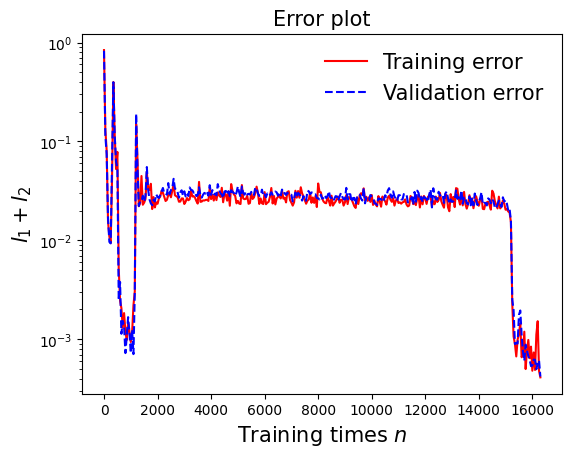

In [110]:
draw_loss(model7)

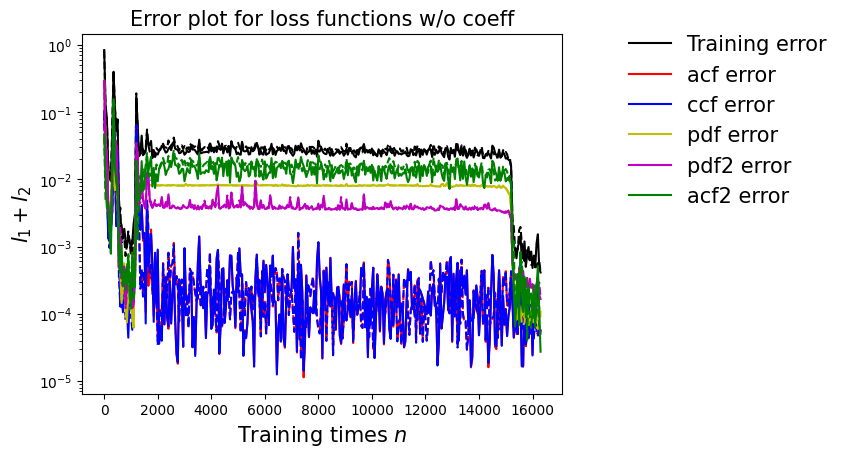

In [111]:
draw_errors(model7)

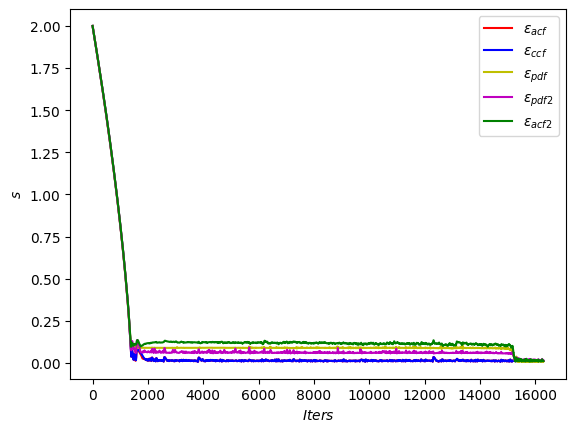

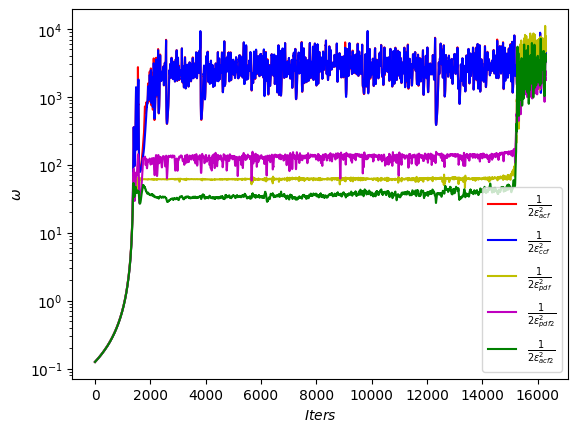

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

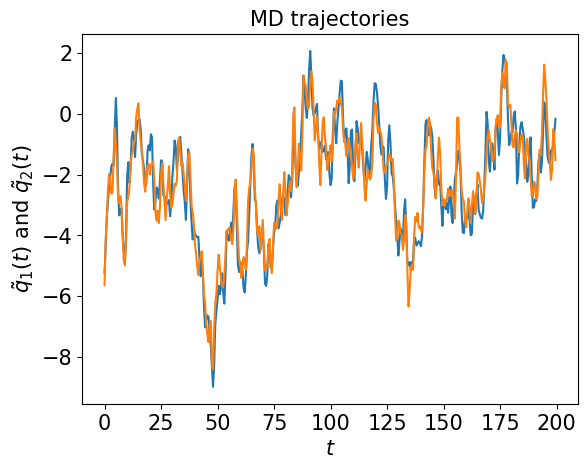

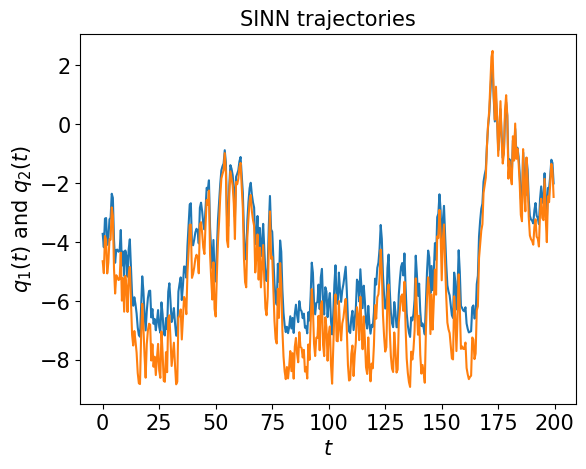

In [113]:
test1(model7)

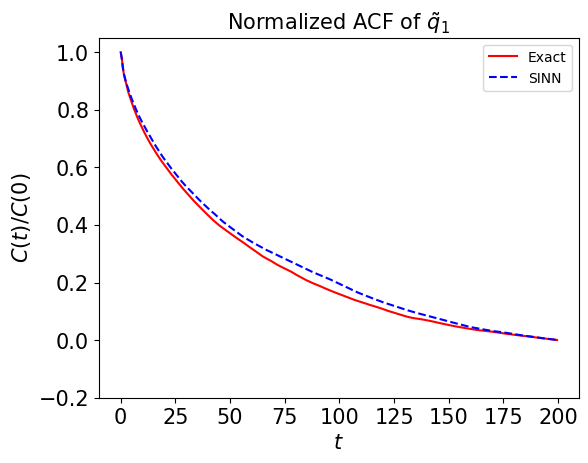

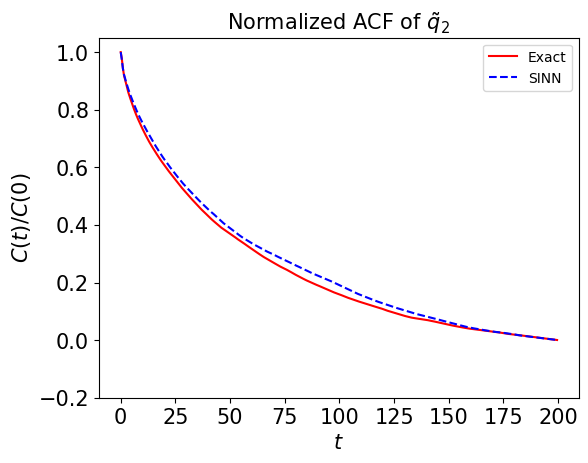

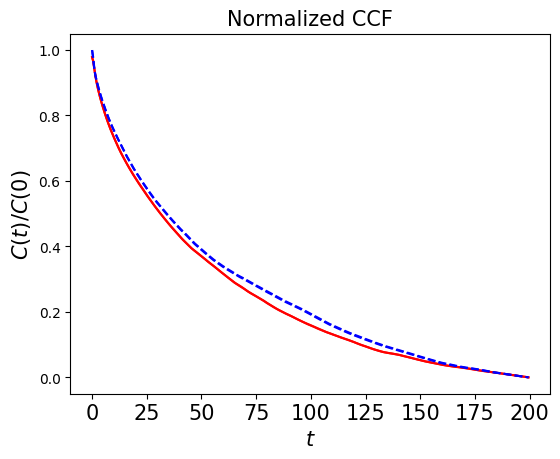

In [114]:
test2(model7)

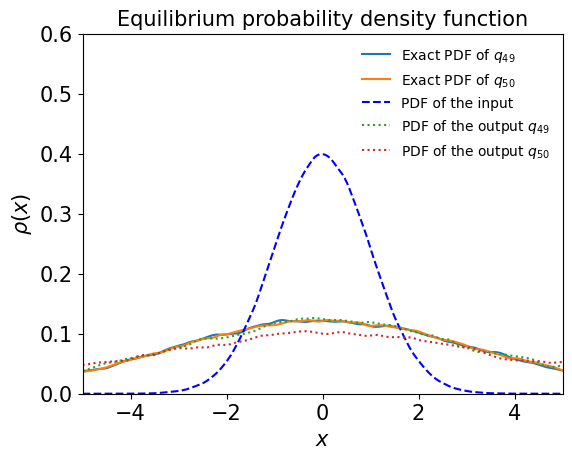

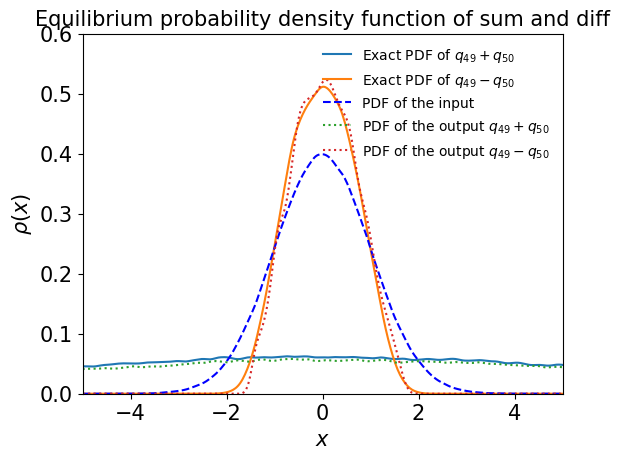

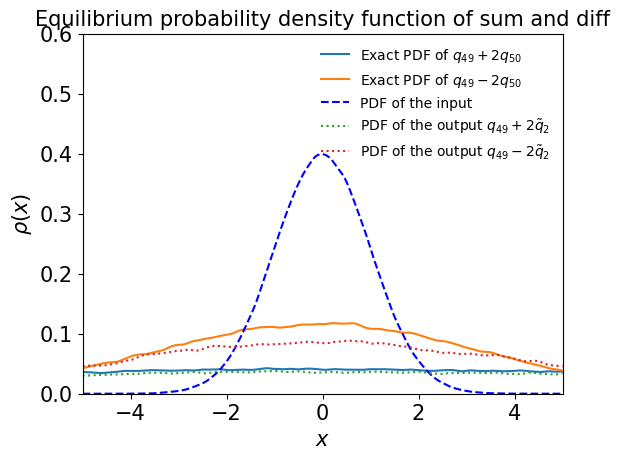

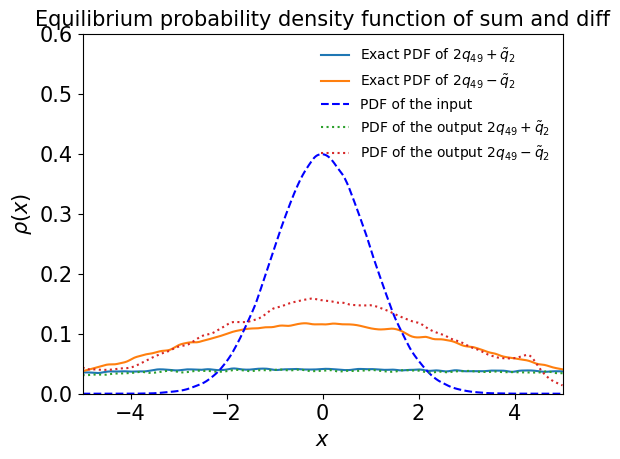

In [115]:
test3(model7)

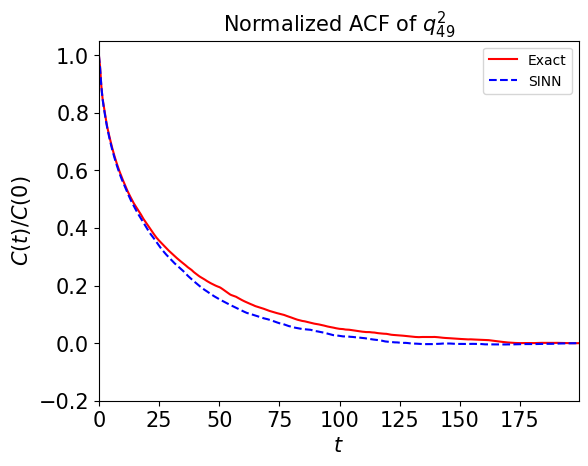

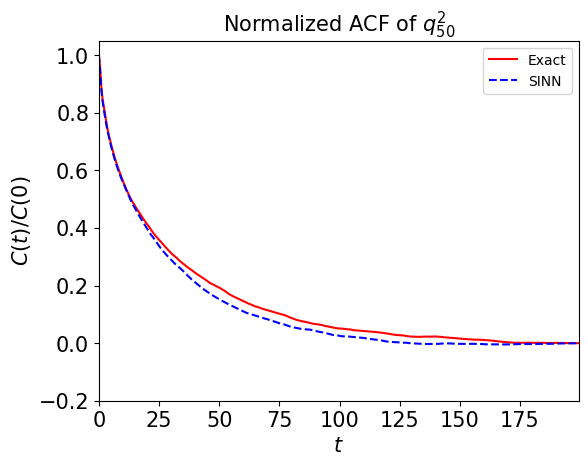

In [116]:
test4(model7)

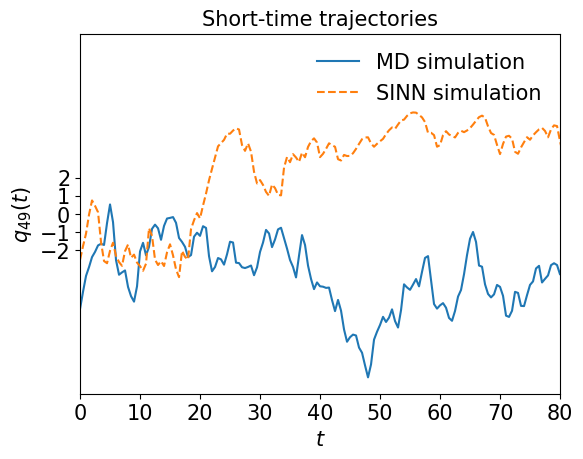

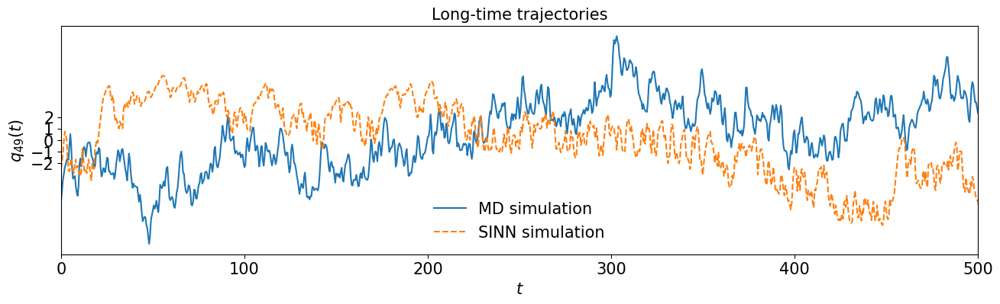

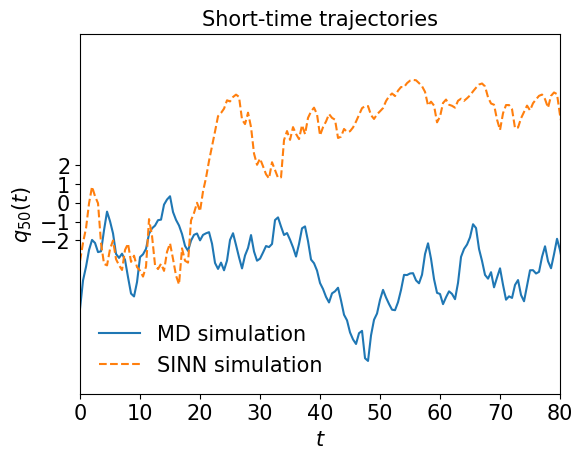

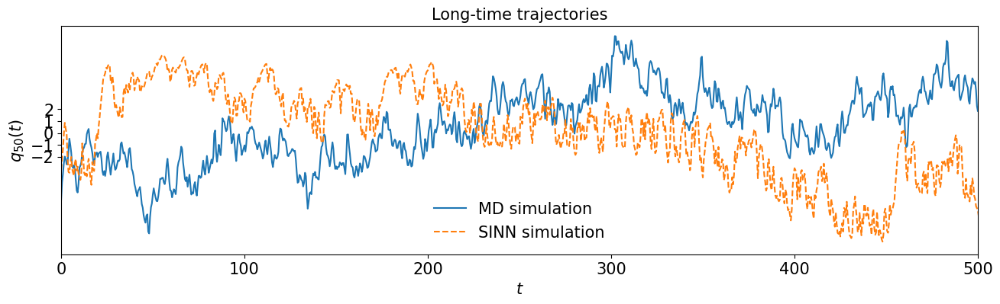

In [117]:
test5(model7)

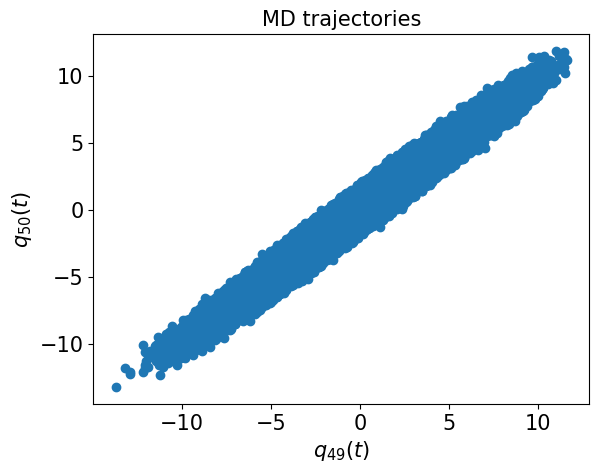

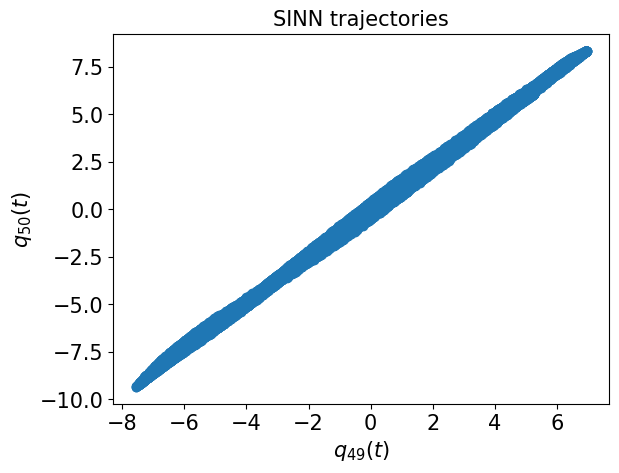

In [118]:
test6(model7)

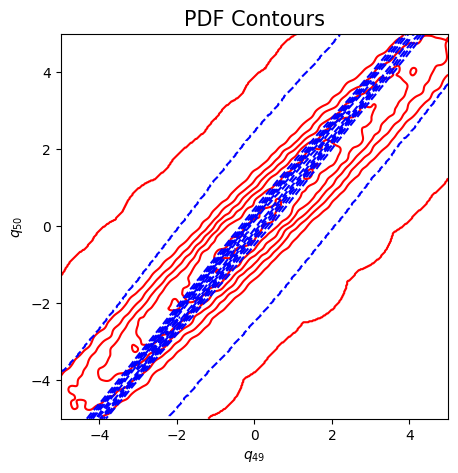

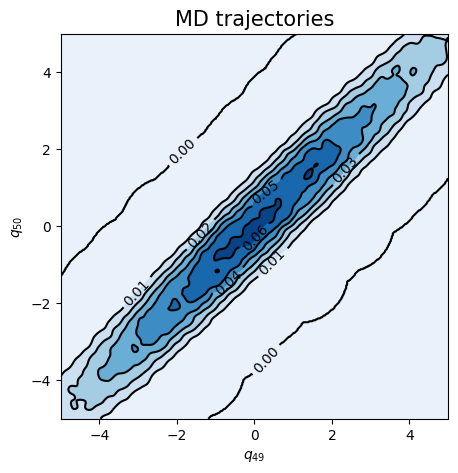

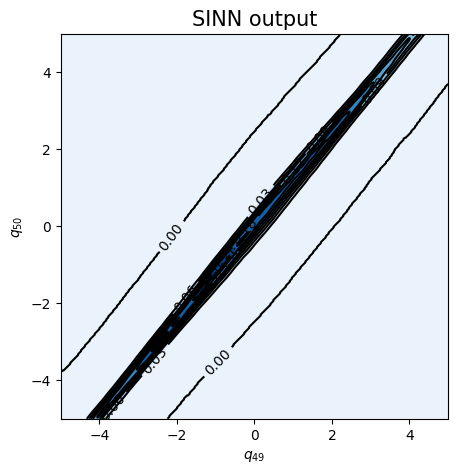

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8632, 0.8654, acf: 0.10217, ccf: 0.13465, pdf: 0.29322, pdf2: 0.28986, acf2: 0.04548
[50]-th step loss: 0.0924, 0.0717, acf: 0.00726, ccf: 0.00725, pdf: 0.03138, pdf2: 0.02218, acf2: 0.00364
[100]-th step loss: 0.0211, 0.0267, acf: 0.00367, ccf: 0.00372, pdf: 0.00854, pdf2: 0.00777, acf2: 0.00301
[150]-th step loss: 0.0073, 0.0109, acf: 0.00239, ccf: 0.00243, pdf: 0.00259, pdf2: 0.00232, acf2: 0.00112
[200]-th step loss: 0.0288, 0.0325, acf: 0.00204, ccf: 0.00198, pdf: 0.01339, pdf2: 0.01107, acf2: 0.00404
[250]-th step loss: 0.0040, 0.0044, acf: 0.00011, ccf: 0.00013, pdf: 0.00154, pdf2: 0.00147, acf2: 0.00117
[300]-th step loss: 0.0034, 0.0042, acf: 0.00042, ccf: 0.00043, pdf: 0.00067, pdf2: 0.00110, acf2: 0.00162
[350]-th step loss: 0.0421, 0.0693, acf: 0.00243, ccf: 0.00243, pdf: 0.03646, pdf2: 0.02102, acf2: 0.00696
[400]-th step loss: 0.0089, 0.0179, acf: 0.00347, ccf: 0.00349, pdf: 0.00242, pdf2: 0.00304, acf2: 0.00546
[450]-th step loss: 0.1357, 0.1288, acf:

[3850]-th step loss: 0.0681, 0.0682, acf: 0.00014, ccf: 0.00013, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01493
[3900]-th step loss: 0.0658, 0.0724, acf: 0.00028, ccf: 0.00029, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01879
[3950]-th step loss: 0.0770, 0.0776, acf: 0.00088, ccf: 0.00090, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02278
[4000]-th step loss: 0.0635, 0.0742, acf: 0.00046, ccf: 0.00047, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02019
[4050]-th step loss: 0.0693, 0.0736, acf: 0.00041, ccf: 0.00042, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01971
[4100]-th step loss: 0.0727, 0.0759, acf: 0.00065, ccf: 0.00066, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02150
[4150]-th step loss: 0.0704, 0.0741, acf: 0.00045, ccf: 0.00046, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02011
[4200]-th step loss: 0.0678, 0.0766, acf: 0.00076, ccf: 0.00077, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02203
[4250]-th step loss: 0.0693, 0.0761, acf: 0.00074, ccf: 0.00075, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02159
[4300]-th step loss: 0.0690,

[7650]-th step loss: 0.0713, 0.0790, acf: 0.00107, ccf: 0.00109, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02378
[7700]-th step loss: 0.0666, 0.0747, acf: 0.00052, ccf: 0.00053, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02063
[7750]-th step loss: 0.0675, 0.0719, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01843
[7800]-th step loss: 0.0661, 0.0690, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01576
[7850]-th step loss: 0.0657, 0.0718, acf: 0.00024, ccf: 0.00025, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01829
[7900]-th step loss: 0.0667, 0.0696, acf: 0.00012, ccf: 0.00012, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01636
[7950]-th step loss: 0.0680, 0.0742, acf: 0.00048, ccf: 0.00049, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02020
[8000]-th step loss: 0.0636, 0.0703, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01695
[8050]-th step loss: 0.0659, 0.0761, acf: 0.00068, ccf: 0.00069, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02166
[8100]-th step loss: 0.0667,

[11450]-th step loss: 0.0646, 0.0714, acf: 0.00021, ccf: 0.00022, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01797
[11500]-th step loss: 0.0717, 0.0709, acf: 0.00016, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01756
[11550]-th step loss: 0.0671, 0.0725, acf: 0.00034, ccf: 0.00035, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01878
[11600]-th step loss: 0.0652, 0.0724, acf: 0.00026, ccf: 0.00027, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01878
[11650]-th step loss: 0.0685, 0.0728, acf: 0.00029, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01914
[11700]-th step loss: 0.0669, 0.0709, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01747
[11750]-th step loss: 0.0702, 0.0740, acf: 0.00047, ccf: 0.00048, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02006
[11800]-th step loss: 0.0688, 0.0753, acf: 0.00066, ccf: 0.00067, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02092
[11850]-th step loss: 0.0669, 0.0746, acf: 0.00050, ccf: 0.00051, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02051
[11900]-th step los

[15250]-th step loss: 0.0666, 0.0723, acf: 0.00027, ccf: 0.00027, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01874
[15300]-th step loss: 0.0678, 0.0730, acf: 0.00034, ccf: 0.00035, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01929
[15350]-th step loss: 0.0665, 0.0739, acf: 0.00044, ccf: 0.00045, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01999
[15400]-th step loss: 0.0662, 0.0748, acf: 0.00050, ccf: 0.00051, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02070
[15450]-th step loss: 0.0665, 0.0705, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01711
[15500]-th step loss: 0.0707, 0.0711, acf: 0.00017, ccf: 0.00017, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01767
[15550]-th step loss: 0.0674, 0.0713, acf: 0.00022, ccf: 0.00023, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01779
[15600]-th step loss: 0.0741, 0.0747, acf: 0.00053, ccf: 0.00054, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02060
[15650]-th step loss: 0.0732, 0.0701, acf: 0.00071, ccf: 0.00073, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01565
[15700]-th step los

[19050]-th step loss: 0.0673, 0.0717, acf: 0.00029, ccf: 0.00030, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01809
[19100]-th step loss: 0.0662, 0.0726, acf: 0.00039, ccf: 0.00039, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01881
[19150]-th step loss: 0.0696, 0.0749, acf: 0.00058, ccf: 0.00059, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02069
[19200]-th step loss: 0.0656, 0.0711, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.04477, acf2: 0.01765
[19250]-th step loss: 0.0675, 0.0718, acf: 0.00026, ccf: 0.00027, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01820
[19300]-th step loss: 0.0726, 0.0764, acf: 0.00076, ccf: 0.00077, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02185
[19350]-th step loss: 0.0682, 0.0739, acf: 0.00047, ccf: 0.00048, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01994
[19400]-th step loss: 0.0685, 0.0744, acf: 0.00052, ccf: 0.00053, pdf: 0.00829, pdf2: 0.04475, acf2: 0.02030
[19450]-th step loss: 0.0692, 0.0741, acf: 0.00054, ccf: 0.00055, pdf: 0.00829, pdf2: 0.04475, acf2: 0.01993
[19500]-th step los

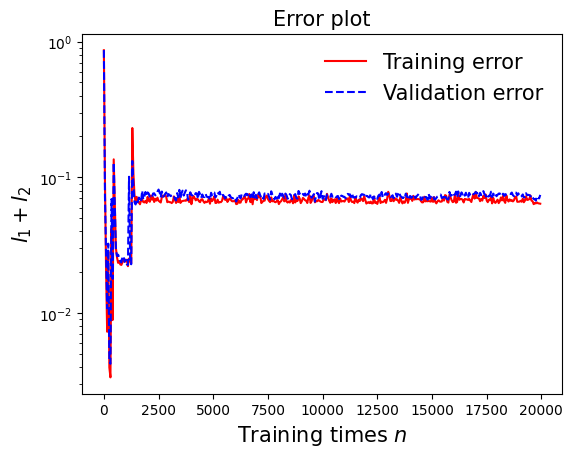

In [121]:
draw_loss(model8)

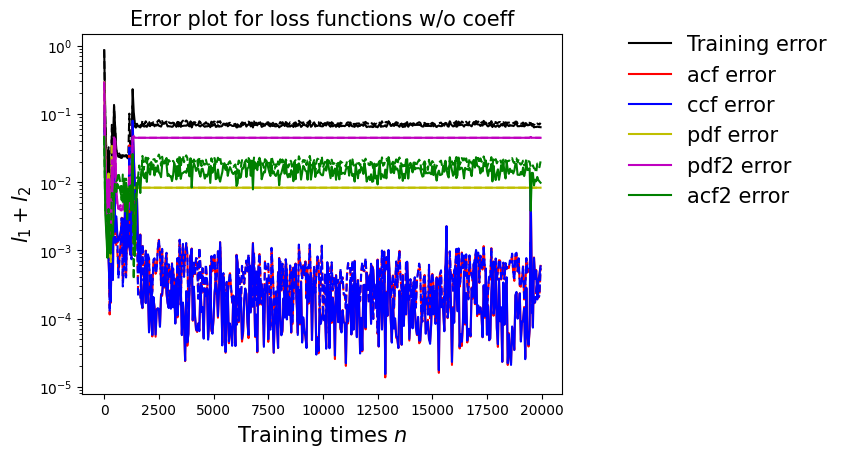

In [122]:
draw_errors(model8)

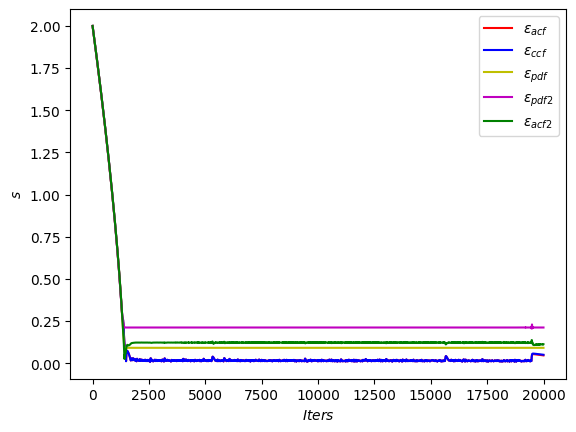

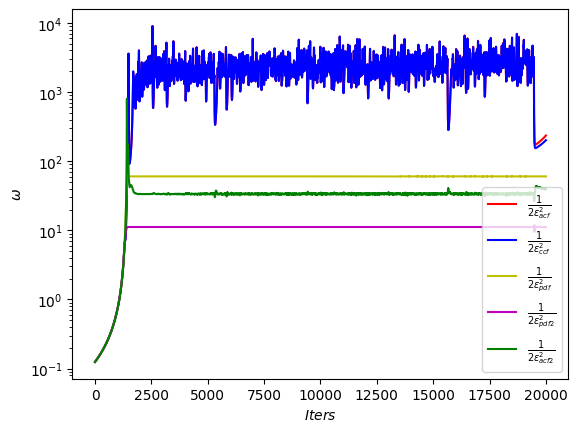

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

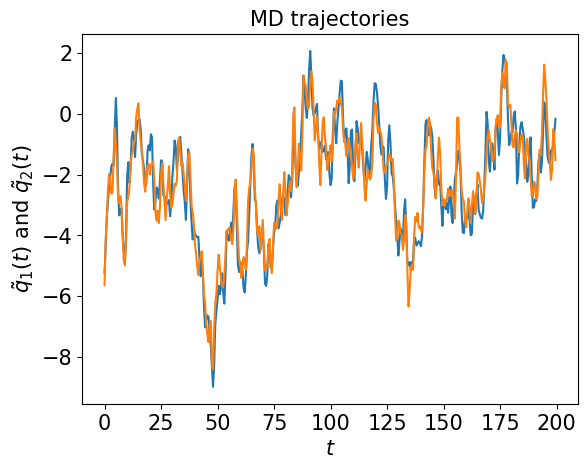

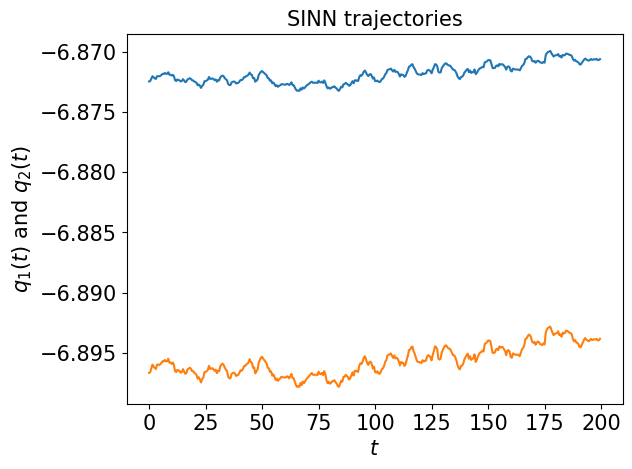

In [124]:
test1(model8)

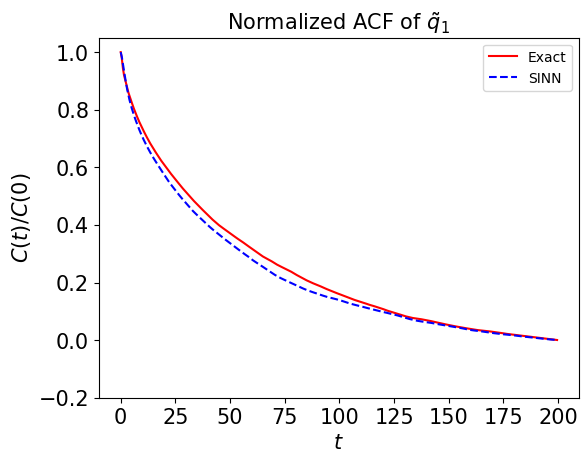

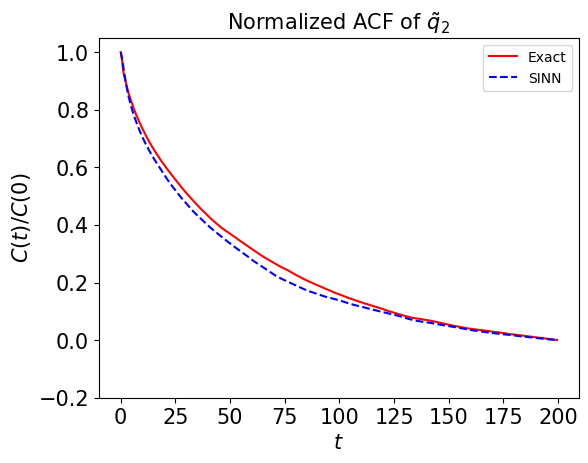

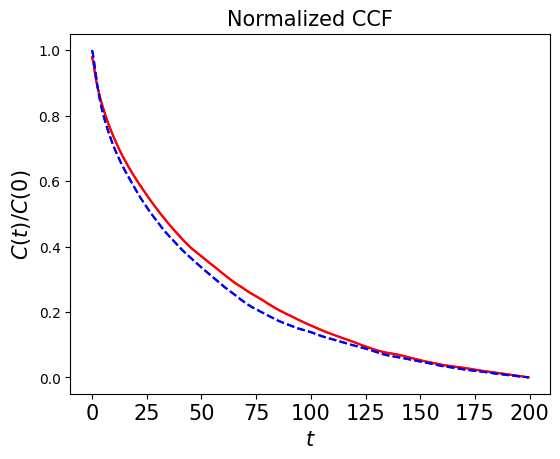

In [125]:
test2(model8)

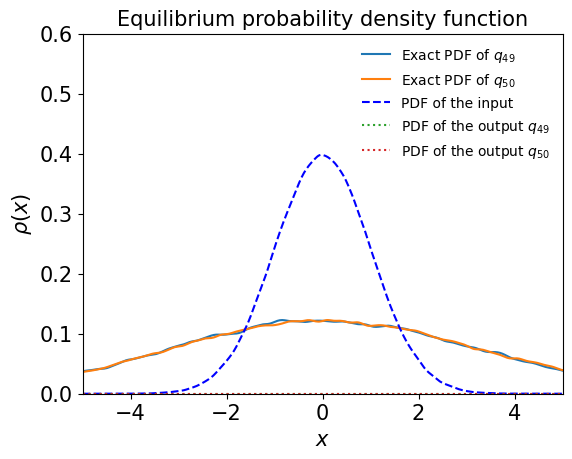

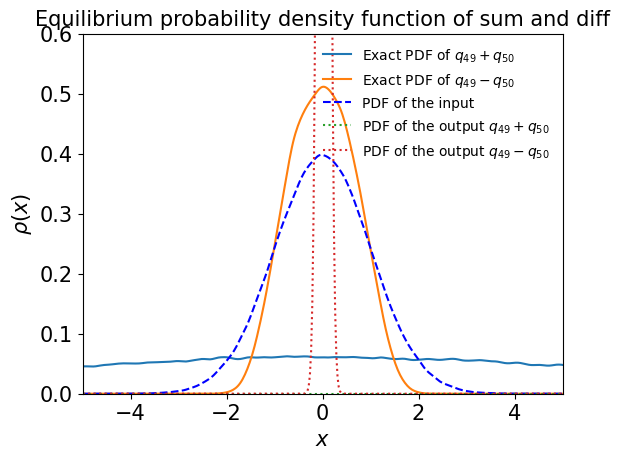

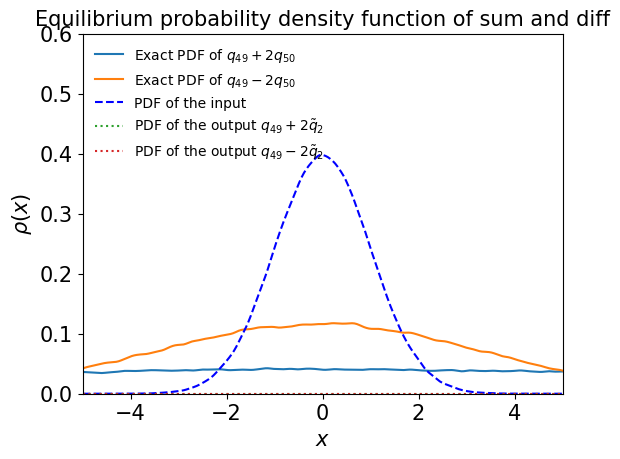

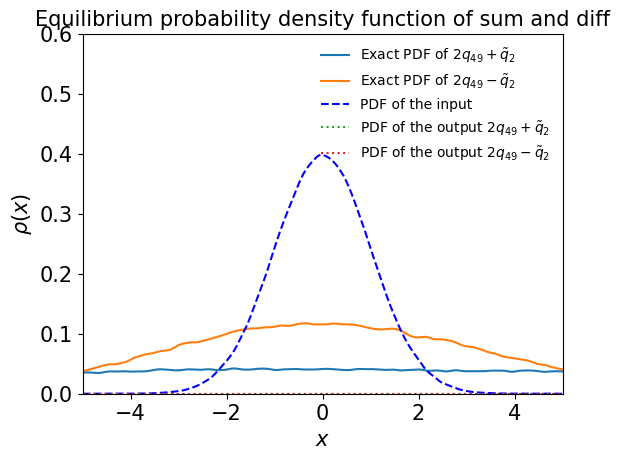

In [126]:
test3(model8)

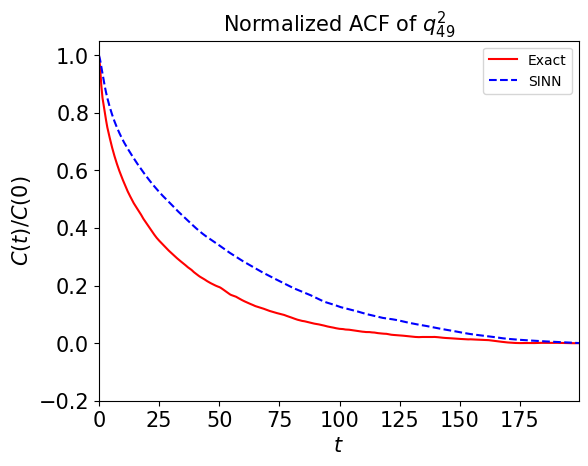

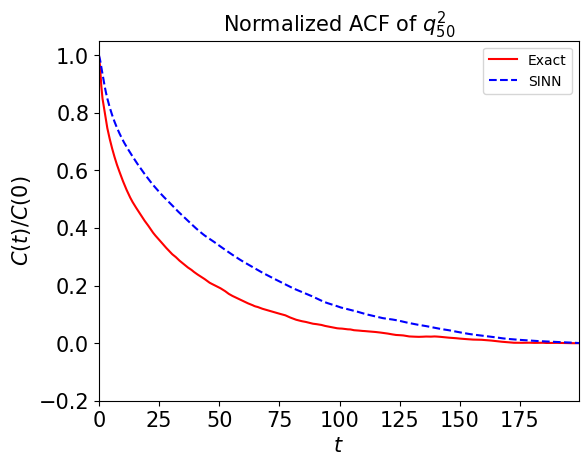

In [127]:
test4(model8)

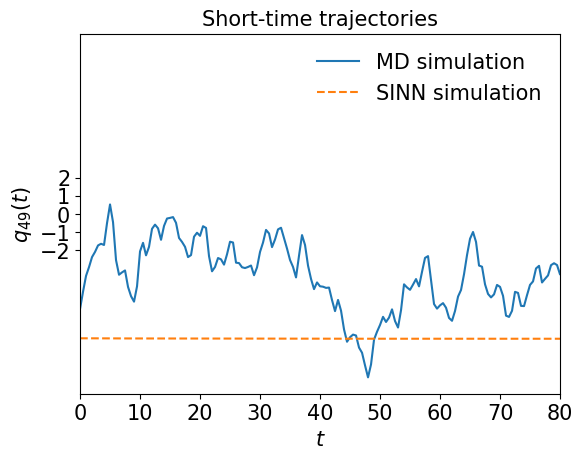

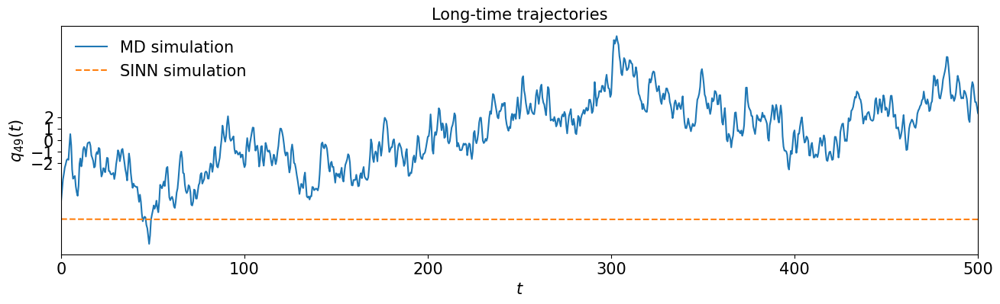

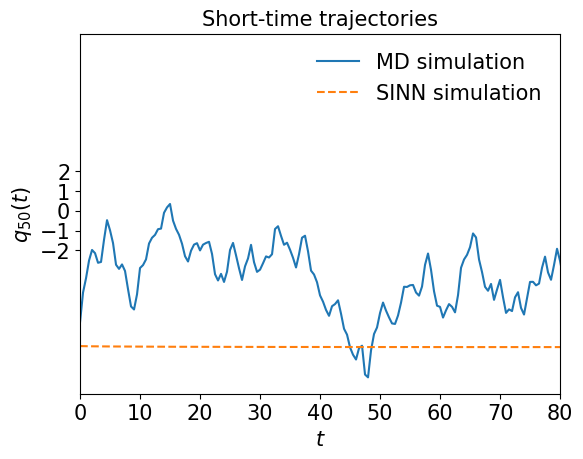

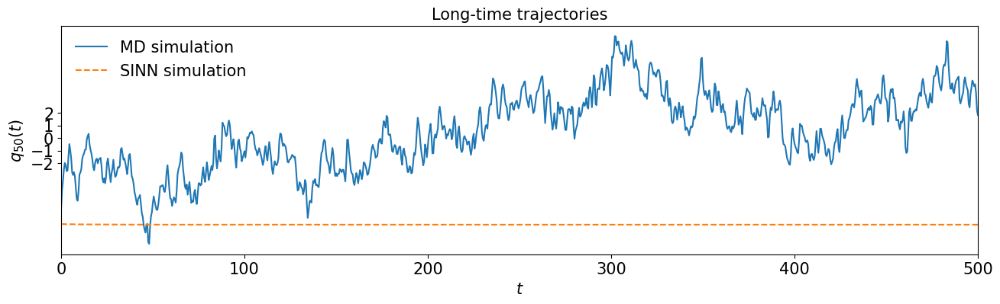

In [128]:
test5(model8)

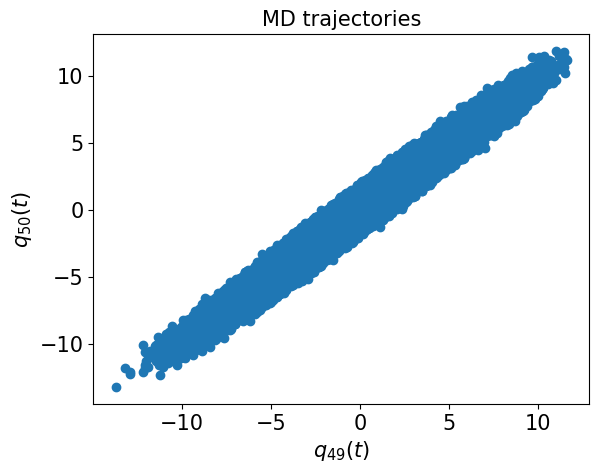

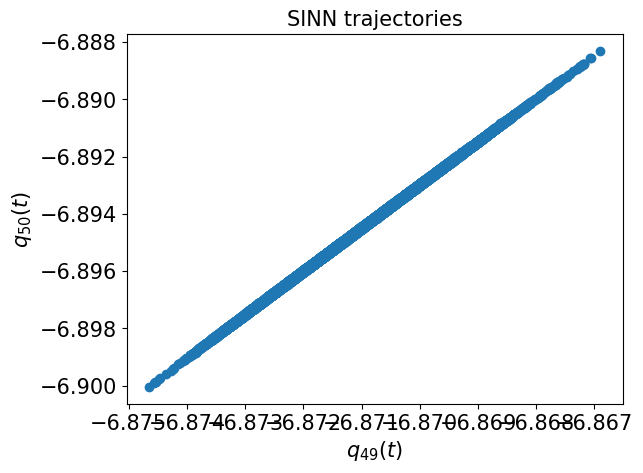

In [129]:
test6(model8)

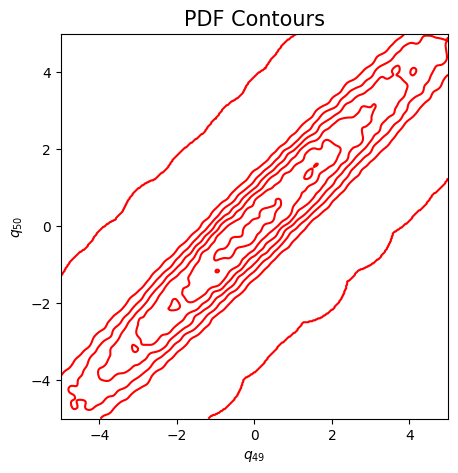

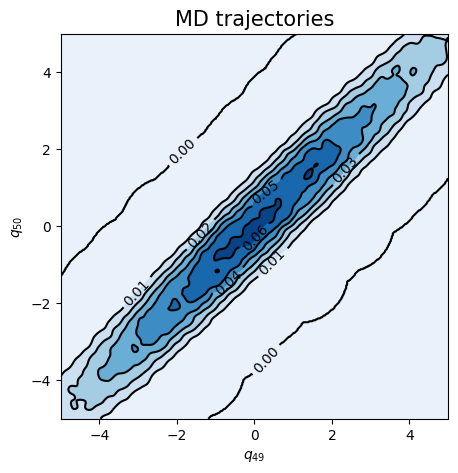

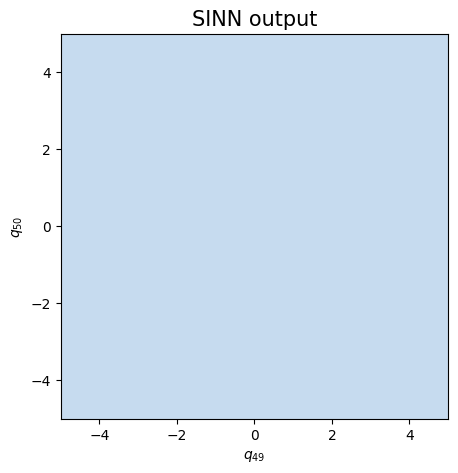

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(1, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8676, 0.8492, acf: 0.10660, ccf: 0.11017, pdf: 0.29324, pdf2: 0.28992, acf2: 0.04930
[50]-th step loss: 0.1239, 0.0902, acf: 0.01683, ccf: 0.01701, pdf: 0.03186, pdf2: 0.01914, acf2: 0.00537
[100]-th step loss: 0.1491, 0.0979, acf: 0.00973, ccf: 0.00968, pdf: 0.04511, pdf2: 0.02861, acf2: 0.00479
[150]-th step loss: 0.0886, 0.0973, acf: 0.00967, ccf: 0.00962, pdf: 0.05275, pdf2: 0.02369, acf2: 0.00162
[200]-th step loss: 0.0425, 0.0385, acf: 0.00090, ccf: 0.00083, pdf: 0.01655, pdf2: 0.01076, acf2: 0.00948
[250]-th step loss: 0.0286, 0.0329, acf: 0.00022, ccf: 0.00023, pdf: 0.01601, pdf2: 0.00980, acf2: 0.00660
[300]-th step loss: 0.0752, 0.0837, acf: 0.00142, ccf: 0.00081, pdf: 0.03665, pdf2: 0.02443, acf2: 0.02042
[350]-th step loss: 0.0293, 0.0303, acf: 0.00044, ccf: 0.00033, pdf: 0.01262, pdf2: 0.01012, acf2: 0.00680
[400]-th step loss: 0.0216, 0.0222, acf: 0.00067, ccf: 0.00062, pdf: 0.00938, pdf2: 0.00772, acf2: 0.00385
[450]-th step loss: 0.0177, 0.0172, acf:

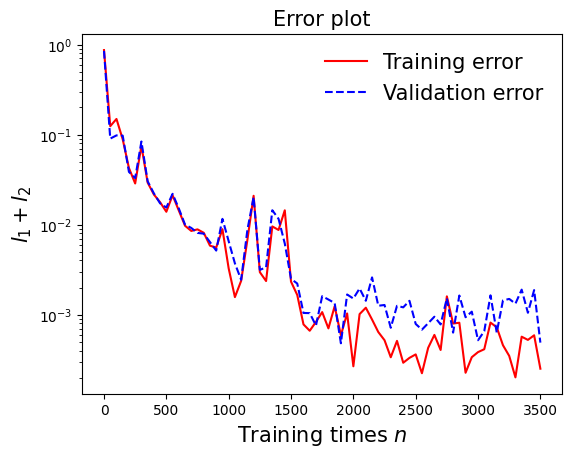

In [132]:
draw_loss(model9)

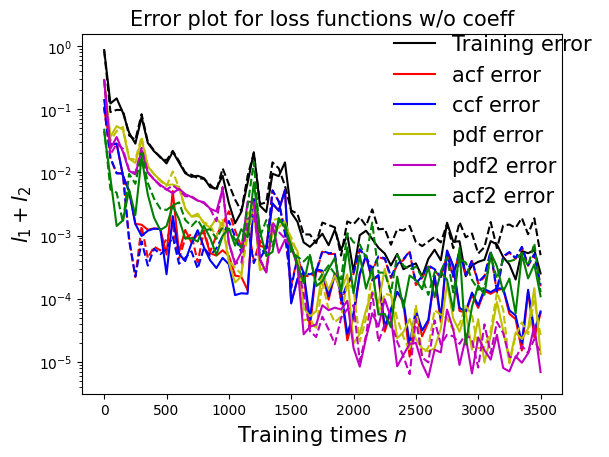

In [133]:
draw_errors(model9)

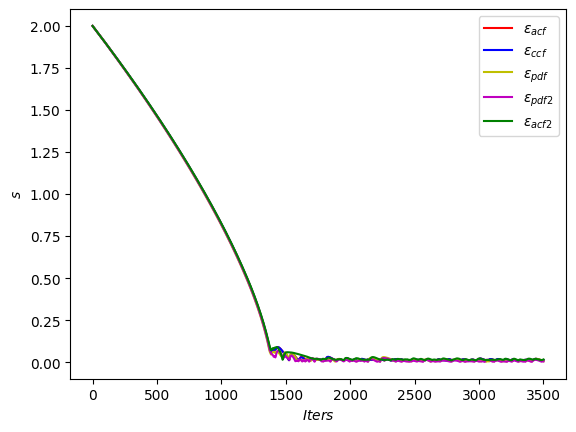

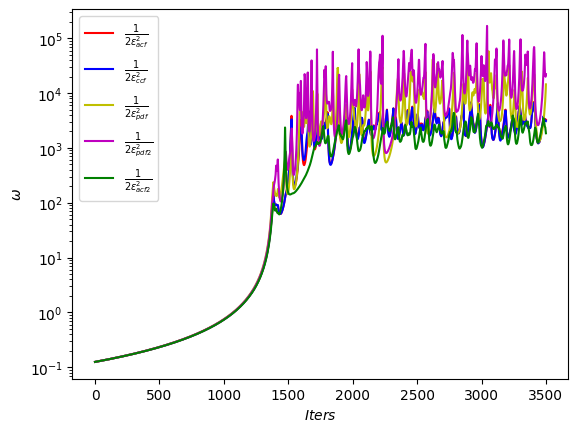

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

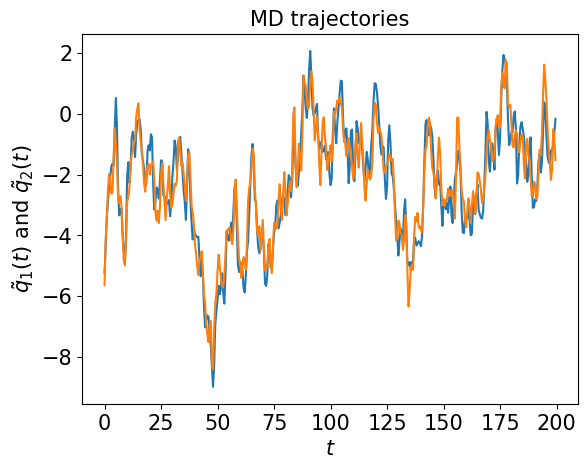

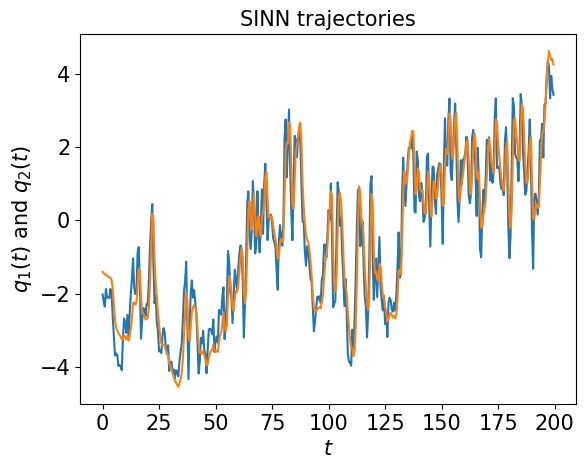

In [135]:
test1(model9)

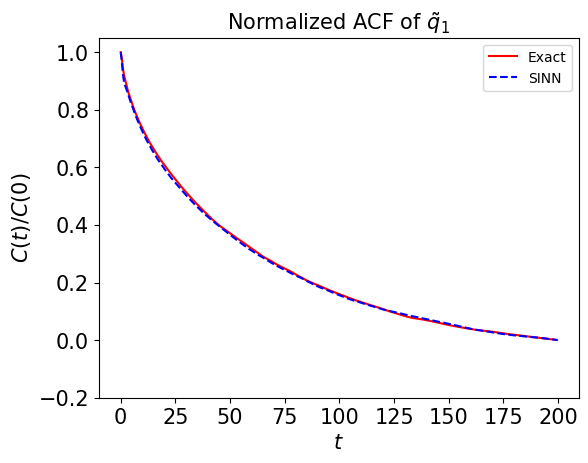

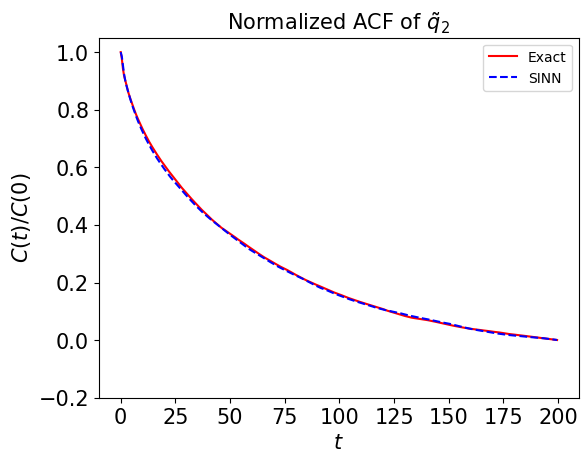

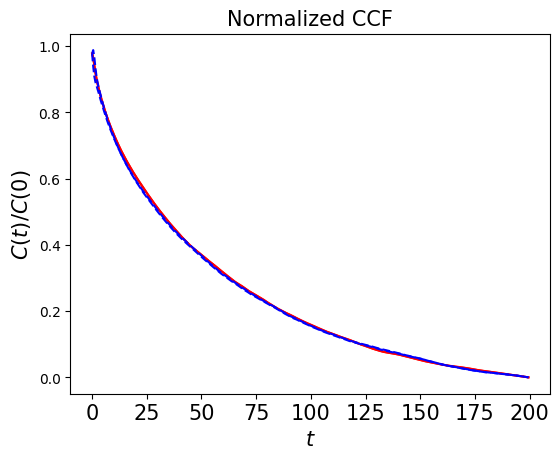

In [136]:
test2(model9)

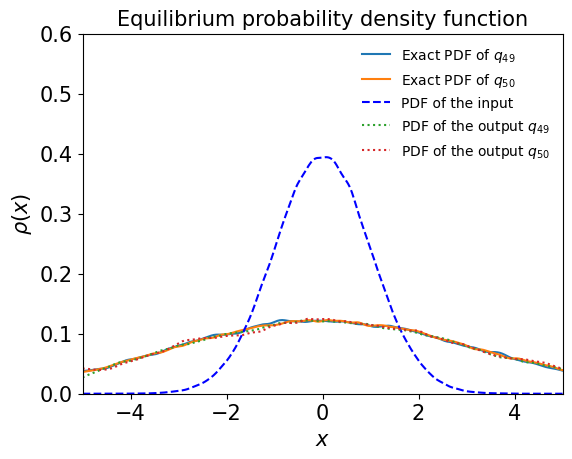

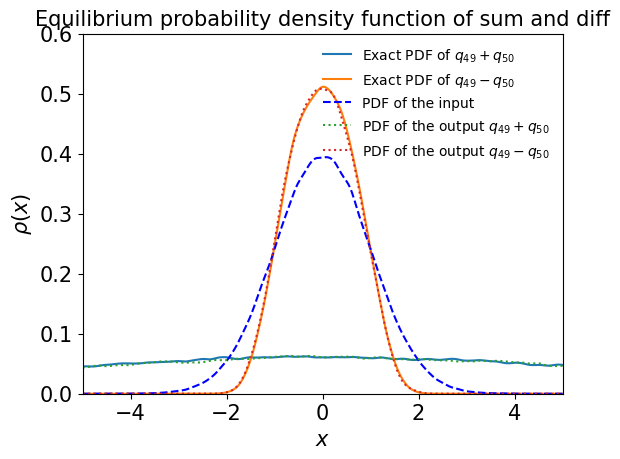

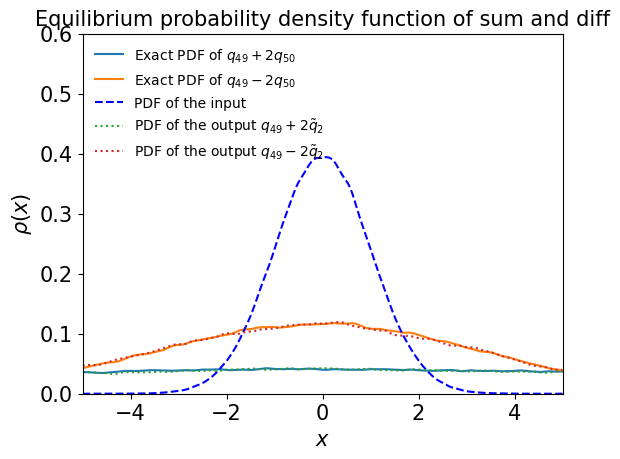

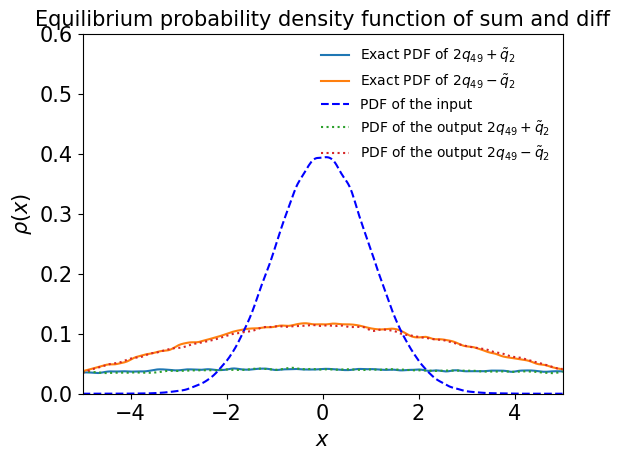

In [137]:
test3(model9)

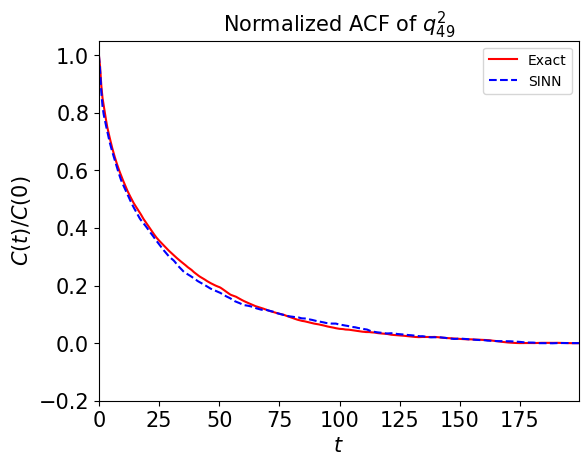

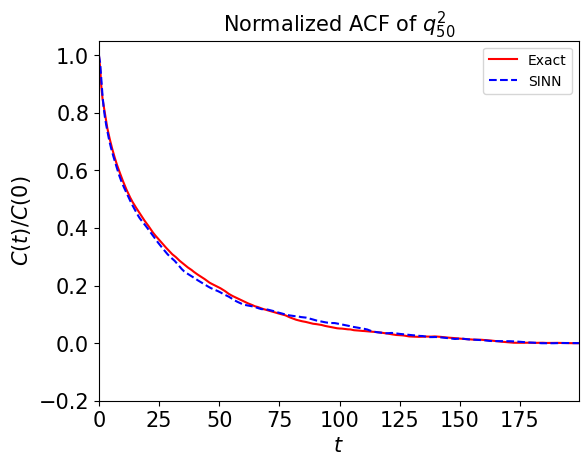

In [138]:
test4(model9)

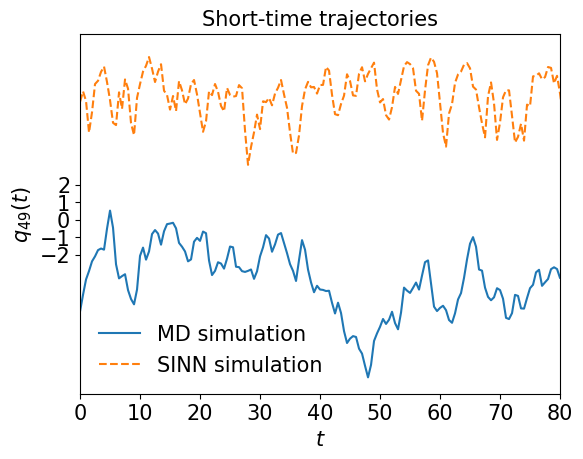

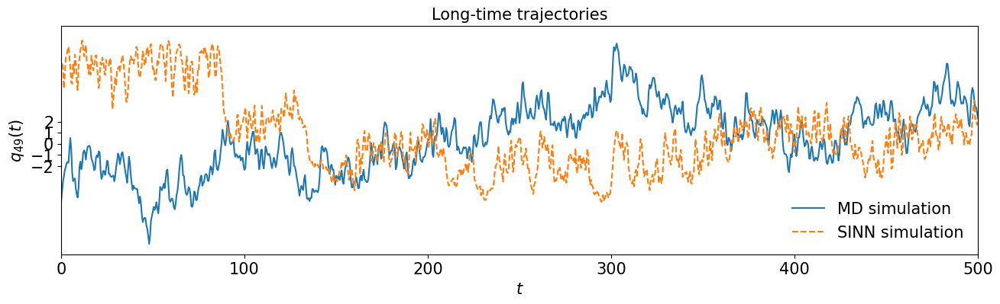

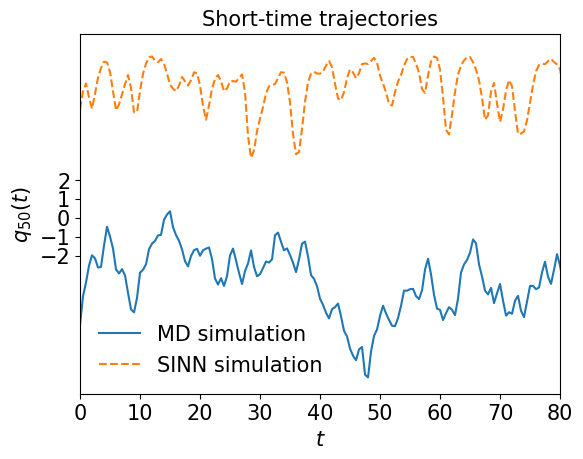

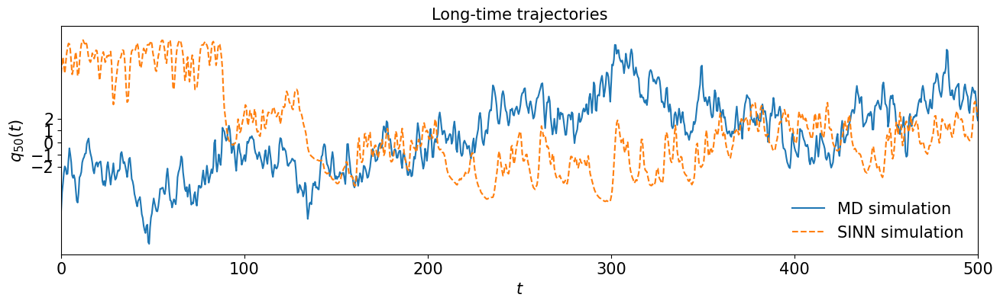

In [139]:
test5(model9)

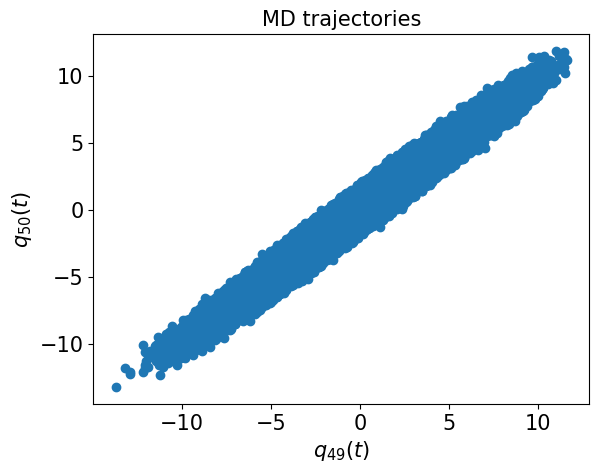

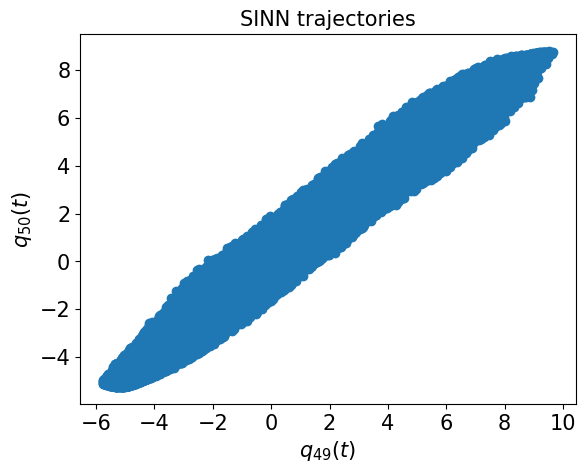

In [140]:
test6(model9)

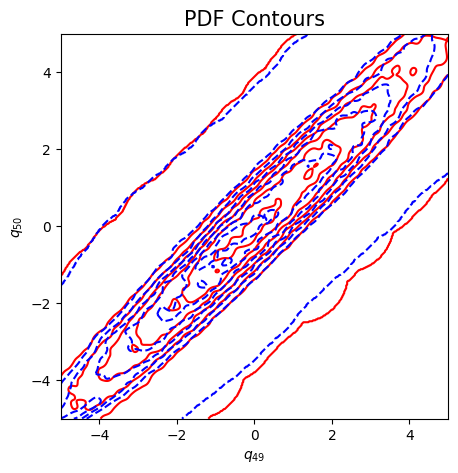

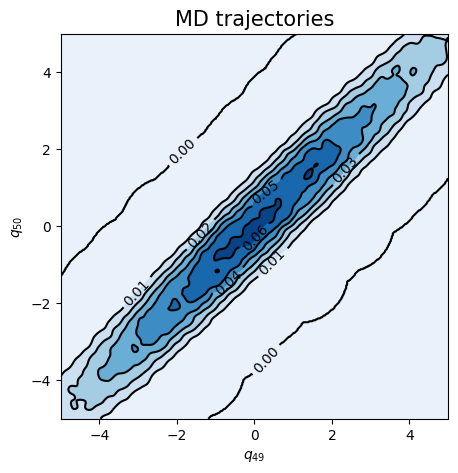

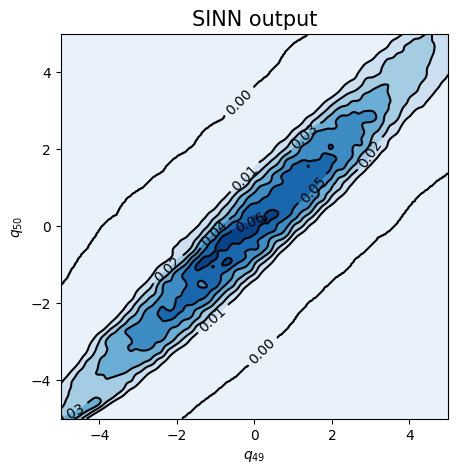

In [141]:
test7(model9)